# Projet n°6 : Classifier automatiquement des biens de consommation - notebook n°1

## Les attendus du projet

**Consignes :**

La mission est de réaliser une étude de faisabilité d'un moteur de classification automatique d’articles, en utilisant leur image et leur description sur le jeu de données d'articles disponible via ce fichier csv 'flipkart_com-ecommerce_sample_1050'. 

**Les étapes à suivre sont :**

- Un prétraitement des données texte et image

- Une extraction de features
   
- Une réduction en 2 dimensions, afin de projeter les produits sur un graphique 2D, sous la forme de points dont la couleur correspondra à la catégorie réelle
  
- Une analyse du graphique afin de conclure, à l’aide des descriptions ou des images, sur la faisabilité de regrouper automatiquement des produits de même catégorie
  
- Une réalisation d’une mesure pour confirmer ton analyse visuelle, en calculant la similarité entre les catégories réelles et les catégories issues d’une segmentation en clusters

**Le cahier des charges technique :**

Afin d’extraire les features image, il sera nécessaire de mettre en œuvre :

- un algorithme de type SIFT / ORB / SURF

- un algorithme de type CNN Transfer Learning.
 
Afin d’extraire les features texte, il sera nécessaire de mettre en œuvre : deux approches de type bag-of-words, comptage simple de mots et Tf-idf,

- une approche de type word/sentence embedding classique avec Word2Vec (ou Glove ou FastText),
- une approche de type word/sentence embedding avec BERT,
- une approche de type word/sentence embedding avec USE (Universal Sentence Encoder).

# I. Importation des librairies et des données

## A. Importer les librairies

In [1]:
# Librairies de base python 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import pandas as pd
import missingno as msno
import scipy
from tqdm import tqdm

# Librairies pour l'analyse textuelle
import nltk
import re
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk import pos_tag, word_tokenize
import string
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
from gensim import corpora
from gensim.models import LdaModel
from gensim.parsing.preprocessing import preprocess_string
from transformers import BertTokenizer, BertModel
import torch
import tensorflow as tf
import tensorflow_hub as hub
from sklearn.decomposition import TruncatedSVD

# Librairies pre-processing
from sklearn.preprocessing import LabelEncoder, MultiLabelBinarizer, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

# Librairies projection & réduction
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Librairies pour les métriques de performances
from collections import defaultdict
from time import time
from sklearn import metrics
from sklearn.metrics import adjusted_rand_score, silhouette_score
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import classification_report
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import StratifiedKFold

# Librairies pour le clustering
from sklearn.cluster import KMeans

# Librairies joblib
from joblib import Parallel, delayed

# Librairies pour la modélisation supervisée (classification)
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

## B. Importer les données

In [2]:
df = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

# II. Exploration des données

## A. Description généraliste des données

In [3]:
# Visualisation du dataframe
df.head(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [28]:
# Structure du df & nom des colonnes et taux de remplissage
print('Noms des colonnes:', df.columns)
print('Structure du fichier:', df.shape)

Noms des colonnes: Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')
Structure du fichier: (1050, 15)


In [29]:
# Infos par colonnes avec la .info()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [30]:
# Statistiques avec describe
df.describe(include = 'all')

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1049.000000,1049.000000,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,NaN,NaN,1050,2,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars""]",CRNEG7BKMFFYHQ8Z,NaN,NaN,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""value""=>""Mug""}, {""key""=>""Mug Capacity"", ""value""=>""5.5 l""}, {""key""=>""Freezer Safe"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Ceramic""}, {""key""=>""Microwave Safe"", ""value""=>""Yes""}, {""value""=>""1 Year Rockmantra Brand Warranty and Free Transit Insurance.""}, {""key""=>""Diameter"", ""value""=>""88 mm""}, {""key""=>""Weight"", ""value""=>""300 g""}, {""key""=>""Height"", ""value""=>""101 mm""}, {""key""=>""Width"", ""value""=>""88 mm""}, {""key""=>""Sales Package"", ""value""=>""1 mug""}]}"
freq,1,150,1,1,56,1,NaN,NaN,1,993,1,889,889,11,22
mean,NaN,NaN,NaN,NaN,NaN,NaN,2186.197331,1584.527169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,7639.229411,7475.099680,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,35.000000,35.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,555.000000,340.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,999.000000,600.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,1999.000000,1199.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

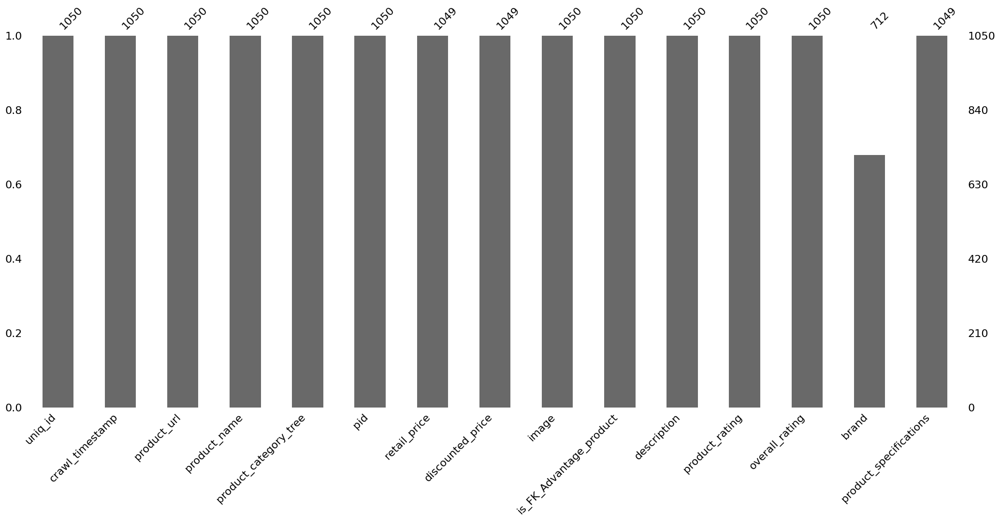

In [31]:
# Visualisation des valeurs manquantes
msno.bar(df)

In [32]:
# Filtrer les lignes où 'retail_price' est NaN
df_nan = df[df['retail_price'].isna()]
df_nan

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-face-towel-set/p/itmeg6shbrpubhca?pid=BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,"Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our product is 100% cotton, so it is susceptible to shrinkage. Product color may vary from the picture. Size may vary by ±3% WASH CARE: Wash in cold Water, Do not Iron, Do not Bleach, Flat dry, Wash before first use. SIZE- FACE TOWEL - 23 cms X 23 cms.,Specifications of Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Bath Towel Features Material Cotton Terry Design SHUVAM General Brand Eurospa GSM 360 Type Face Towel Set Model Name SHUVAM20PCFTSETASSORTED Ideal For Boys, Girls, Men, Women Model ID SHUVAM20PCFTSETASSORTED Size small Color Assorted Dimensions Weight 350 g Length 9 inch Width 9 inch In the Box Number of Contents in Sales Package 20 Sales Package 20 PIECE FACE TOWEL SET",No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"", ""value""=>""Cotton Terry""}, {""key""=>""Design"", ""value""=>""SHUVAM""}, {""key""=>""Brand"", ""value""=>""Eurospa""}, {""key""=>""GSM"", ""value""=>""360""}, {""key""=>""Type"", ""value""=>""Face Towel Set""}, {""key""=>""Model Name"", ""value""=>""SHUVAM20PCFTSETASSORTED""}, {""key""=>""Ideal For"", ""value""=>""Boys, Girls, Men, Women""}, {""key""=>""Model ID"", ""value""=>""SHUVAM20PCFTSETASSORTED""}, {""key""=>""Size"", ""value""=>""small""}, {""key""=>""Color"", ""value""=>""Assorted""}, {""key""=>""Weight"", ""value""=>""350 g""}, {""key""=>""Length"", ""value""=>""9 inch""}, {""key""=>""Width"", ""value""=>""9 inch""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""20""}, {""key""=>""Sales Package"", ""value""=>""20 PIECE FACE TOWEL SET""}]}"


## B. Analyse de la colonne des catégories produits

La colonne 'product_category_tree' représente l'arborescence des catégories produits en suivant une hiérarchie spécifique.
Nous allons explorer les données dans cette colonne et procéder à certaines transformation pour en exploiter les données.
Pour cela nous allons éclater l'arborescence de la colonne. Notre étude portant sur une classification automatique de biens selon leur catégorie, cette variable semble être essentielle.

### 1. Analyse de la profondeur de l'arboresence

In [33]:
# Regarder le nombre de valeurs uniques dans cette colonne
df['product_category_tree'].nunique()

642

Nous avons 642 catégories différentes. Regardons sur la structure de la colonne.

In [34]:
# Réglage de la largeur d'affichage maximale
pd.set_option('display.max_colwidth', None)

# Afficher les données en tant que liste pour une meilleure lisibilité
first_10_values_list = df['product_category_tree'].head(10).tolist()
for value in first_10_values_list:
    print(value)

["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]
["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]
["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]
["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ..."]
["Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed..."]
["Watches >> Wrist Watches >> Maserati Time Wrist Watches"]
["Watches >> Wrist Watches >> Camerii Wrist Watches"]
["Watches >> Wrist Watches >> T STAR Wrist Watches"]
["Watches >> Wrist Watches >> Alfajr Wrist Watches"]
["Watches >> Wrist Watches >> TAG Heuer Wrist Watches"]


In [35]:
# Fonction pour calculer le nombre de niveaux d'arborescence
def calculate_tree_depth(tree):
    # Supprimer les crochets et diviser par le séparateur >>
    levels = tree.strip('[]').split('>>')
    return len(levels)

# Appliquer la fonction à chaque entrée de la colonne
df['tree_depth'] = df['product_category_tree'].apply(calculate_tree_depth)

# Trouver le niveau d'arborescence maximal
max_depth = df['tree_depth'].max()
print(f'Le niveau d\'arborescence maximal est : {max_depth}')

Le niveau d'arborescence maximal est : 7


In [36]:
# Trouver le niveau d'arborescence maximal
max_depth = df['tree_depth'].max()
print(f'Le niveau d\'arborescence maximal est : {max_depth}')

# Afficher une ligne avec le niveau d'arborescence maximal
max_depth_row = df[df['tree_depth'] == max_depth].iloc[0]
print('Une ligne avec le niveau d\'arborescence maximal :')
print(max_depth_row)

# Nombre de lignes qui correspondent au maximum
num_max_depth_rows = df[df['tree_depth'] == max_depth].shape[0]
print(f'Le nombre de lignes qui correspondent au niveau d\'arborescence maximal est : {num_max_depth_rows}')


Le niveau d'arborescence maximal est : 7
Une ligne avec le niveau d'arborescence maximal :
uniq_id                                                                                                                                                                                                                                                                                                                                                                                                                       90e56526f4c5892beac49f262b85150a
crawl_timestamp                                                                                                                                                                                                                                                                                                                                                                                                                      2016-06-15 04:53:12 +0000
product_url    

### 2. Segmenter l'arborescence : une colonne = un niveau

#### a. Segmentation de la colonne

Nous allons segmenter notre colonne par niveau d'arboresence, l'objectif est d'avoir une colonne = un niveau de l'arboresence.
Nous ferons par la suite l'analyse du contenu.

In [37]:
def segment_tree(tree):
    """
    Segmente une chaîne de caractères représentant une arborescence en niveaux distincts.
    
    Args:
    tree (str): Une chaîne de caractères représentant une arborescence, avec des niveaux séparés par '>>'.
    
    Returns:
    list: Une liste de chaînes de caractères, chaque élément représentant un niveau de l'arborescence.
    """
    # Supprimer les crochets et diviser par le séparateur >>
    levels = tree.strip('[]').split('>>')
    # Enlever les espaces et les guillemets éventuels
    levels = [level.strip(' "').strip() for level in levels]
    return levels

# Appliquer la fonction à chaque entrée de la colonne
segmented = df['product_category_tree'].apply(segment_tree)

# Convertir en DataFrame avec colonnes séparées
segmented_df = pd.DataFrame(segmented.tolist())

# Renommer les colonnes
segmented_df.columns = [f'Level_{i+1}' for i in range(segmented_df.shape[1])]

# Afficher le nouveau DataFrame
segmented_df

,Level_1,Level_2,Level_3,Level_4,Level_5,Level_6,Level_7
0,Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet Do...,None,None,None
1,Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...",None,None
2,Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,Eurospa Cotton Terry Face Towel Set (20 PIECE FA...,None,None
3,Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Bedsheets,SANTOSH ROYAL FASHION Cotton Printed King sized ...,None,None
4,Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Bedsheets,Jaipur Print Cotton Floral King sized Double Bed...,None,None
...,...,...,...,...,...,...,...
1045,Baby Care,Baby & Kids Gifts,Stickers,Oren Empower Stickers,None,None,None
1046,Baby Care,Baby & Kids Gifts,Stickers,Wallmantra Stickers,None,None,None
1047,Baby Care,Baby & Kids Gifts,Stickers,Uberlyfe Stickers,None,None,None
1048,Baby Care,Baby & Kids Gifts,Stickers,Wallmantra Stickers,None,None,None


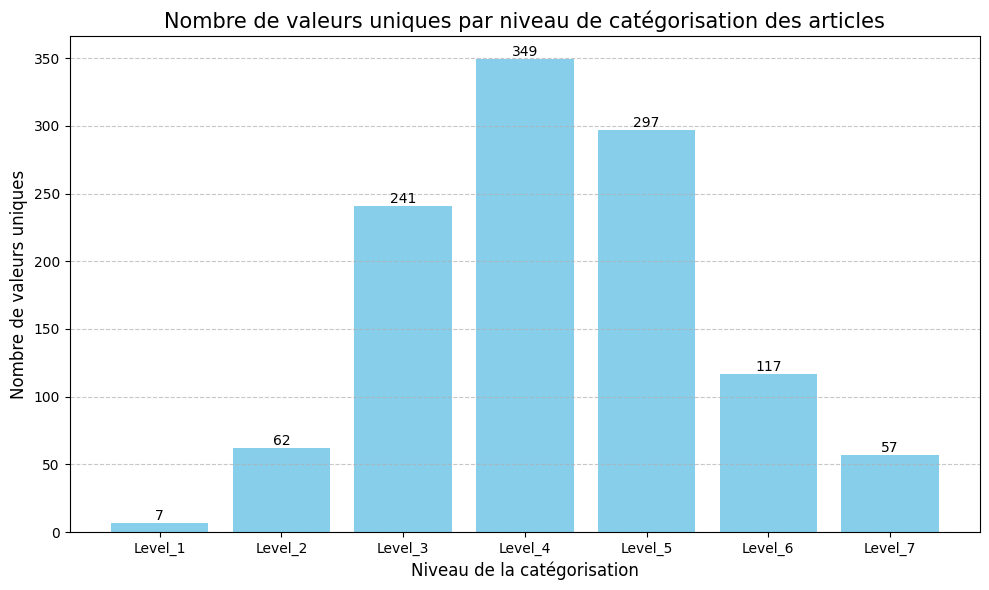

In [39]:
# Compter les valeurs uniques de chaque colonnes de dataframe 
unique_counts = segmented_df.nunique()

# Création du graphique avec malplotlib
plt.figure(figsize=(10, 6))
bars = plt.bar(unique_counts.index, unique_counts.values, color='skyblue')

# Adding title and labels in French
plt.title('Nombre de valeurs uniques par niveau de catégorisation des articles', fontsize=15)
plt.xlabel('Niveau de la catégorisation', fontsize=12)
plt.ylabel('Nombre de valeurs uniques', fontsize=12)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Ajouter les étiquettes 
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

# Show plot
plt.tight_layout()
plt.show()


#### b. Analyse des variables catégorielles

<Axes: >

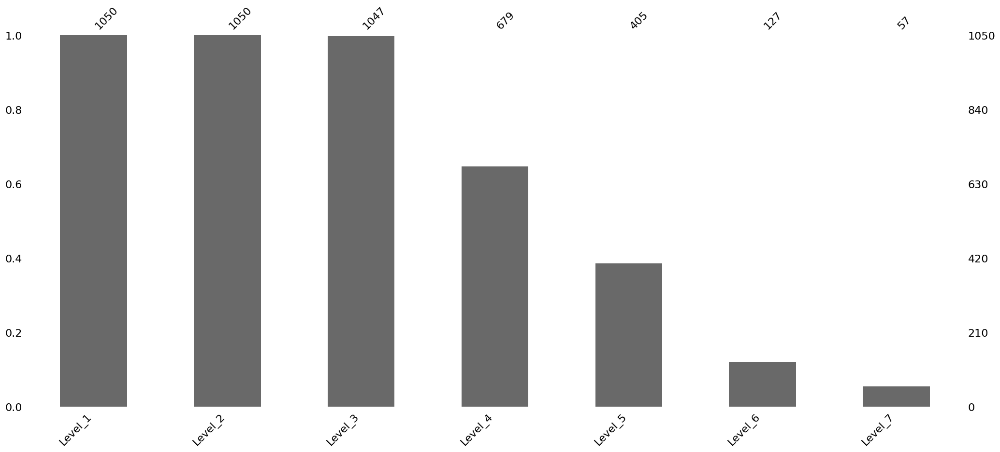

In [40]:
# niveau des manquants par level
msno.bar(segmented_df)

Quasiment la totalité des lignes ont 3 levels, puis progressivement cela diminue, pour n'avoir que 127 lignes et 57 lignes pour les levels 6 & 7.

In [41]:
# Describe qualitatif 
segmented_df.describe(include = 'all')

,Level_1,Level_2,Level_3,Level_4,Level_5,Level_6,Level_7
count,1050,1050,1047,679,405,127,57
unique,7,62,241,349,297,117,57
top,Home Furnishing,Wrist Watches,Deodorants,Combos,Dresses,Wow! Dresses,Mom and Kid Baby Girl's Printed Green Top & Pyja...
freq,150,149,65,64,21,3,1


##### i. Premier niveau de l'arborescence

In [21]:
# Calculer le tableau de fréquence pour Level_1
frequency_table = segmented_df['Level_1'].value_counts().reset_index()
frequency_table.columns = ['Category', 'Frequency']

# Calculer la fréquence relative
frequency_table['Relative Frequency'] = frequency_table['Frequency'] / frequency_table['Frequency'].sum()*100

frequency_table

,Category,Frequency,Relative Frequency
0,Home Furnishing,150,14.285714
1,Baby Care,150,14.285714
2,Watches,150,14.285714
3,Home Decor & Festive Needs,150,14.285714
4,Kitchen & Dining,150,14.285714
5,Beauty and Personal Care,150,14.285714
6,Computers,150,14.285714


La répartition entre les catégories 'level1' est uniforme avec 150 produits chacune.

##### ii. Second niveau de l'arborescence

In [18]:
# Calculer le tableau de fréquence pour Level_2
frequency_table = segmented_df['Level_2'].value_counts().reset_index()
frequency_table.columns = ['Category', 'Frequency']

# Calculer la fréquence relative
frequency_table['Relative Frequency'] = frequency_table['Frequency'] / frequency_table['Frequency'].sum()*100

frequency_table

,Category,Frequency,Relative Frequency
0,Wrist Watches,149,14.190476
1,Laptop Accessories,87,8.285714
2,Infant Wear,84,8.000000
3,Coffee Mugs,74,7.047619
4,Showpieces,71,6.761905
...,...,...,...
57,Consumables & Disposables,1,0.095238
58,TRUE Home Decor & Festive Needs,1,0.095238
59,JMD Home Furnishing,1,0.095238
60,Kripa's Home Furnishing,1,0.095238


##### iii. Troisième niveau de l'arborescence

In [22]:
# Calculer le tableau de fréquence pour Level_3
frequency_table = segmented_df['Level_3'].value_counts().reset_index()
frequency_table.columns = ['Category', 'Frequency']

# Calculer la fréquence relative
frequency_table['Relative Frequency'] = frequency_table['Frequency'] / frequency_table['Frequency'].sum()*100

frequency_table

,Category,Frequency,Relative Frequency
0,Deodorants,65,6.208214
1,"Blankets, Quilts & Dohars",57,5.444126
2,Routers,49,4.680038
3,Baby Girls' Clothes,49,4.680038
4,USB Gadgets,38,3.629417
...,...,...,...
236,Portable Projectors,1,0.095511
237,Changing Tables,1,0.095511
238,Titan Wrist Watches,1,0.095511
239,Table Linen Sets,1,0.095511


##### iV. Quatrième niveau de l'arborescence

In [23]:
# Calculer le tableau de fréquence pour Level_4
frequency_table = segmented_df['Level_4'].value_counts().reset_index()
frequency_table.columns = ['Category', 'Frequency']

# Calculer la fréquence relative
frequency_table['Relative Frequency'] = frequency_table['Frequency'] / frequency_table['Frequency'].sum()*100

frequency_table

,Category,Frequency,Relative Frequency
0,Combos,64,9.425626
1,Woks & Kadhais,22,3.240059
2,Dresses & Skirts,21,3.092784
3,Religious Idols,18,2.650957
4,Bodysuits & Sleepsuits,11,1.620029
...,...,...,...
344,"JewelKraft Designs Brown, Pink Table Linen Set",1,0.147275
345,HomeEdge Health Care Devices,1,0.147275
346,ocean Bar Glasses,1,0.147275
347,Graco Strollers & Prams,1,0.147275


##### V. Cinquième niveau de l'arborescence

In [24]:
# Calculer le tableau de fréquence pour Level_5
frequency_table = segmented_df['Level_5'].value_counts().reset_index()
frequency_table.columns = ['Category', 'Frequency']

# Calculer la fréquence relative
frequency_table['Relative Frequency'] = frequency_table['Frequency'] / frequency_table['Frequency'].sum()*100

frequency_table

,Category,Frequency,Relative Frequency
0,Dresses,21,5.185185
1,Bodysuits,8,1.975309
2,Denver Combos,8,1.975309
3,Night Suits,7,1.728395
4,"Smartpro 19.5v,3.9a Replacement Charger for Vaio...",7,1.728395
...,...,...,...
292,Cinthol Combos,1,0.246914
293,Ajmal Combos,1,0.246914
294,Clear Face Kesar Chandan Multivitamin Nourishing...,1,0.246914
295,YGS Keyboard Case for Asus Memo Pad 7in Tab (Pink),1,0.246914


##### vi. Sixième niveau de l'arborescence

In [26]:
# Calculer le tableau de fréquence pour Level_6
frequency_table = segmented_df['Level_6'].value_counts().reset_index()
frequency_table.columns = ['Category', 'Frequency']

# Calculer la fréquence relative
frequency_table['Relative Frequency'] = frequency_table['Frequency'] / frequency_table['Frequency'].sum()*100

frequency_table

,Category,Frequency,Relative Frequency
0,Wow! Dresses,3,2.362205
1,Vitamins Shorts,3,2.362205
2,Mom and Kid Night Suits,2,1.574803
3,MKB Dresses,2,1.574803
4,Jacadi Paris Dresses,2,1.574803
...,...,...,...
112,Saba Garments Dresses,1,0.787402
113,Rute Sleepsuits,1,0.787402
114,NAMS 06 Fully Automatic Pulse Oximeter (White),1,0.787402
115,Budding Bees Jumpsuits,1,0.787402


##### vii. Septième niveau de l'arborescence

In [27]:
# Calculer le tableau de fréquence pour Level_7
frequency_table = segmented_df['Level_7'].value_counts().reset_index()
frequency_table.columns = ['Category', 'Frequency']

# Calculer la fréquence relative
frequency_table['Relative Frequency'] = frequency_table['Frequency'] / frequency_table['Frequency'].sum()*100

frequency_table

,Category,Frequency,Relative Frequency
0,Mom and Kid Baby Girl's Printed Green Top & Pyja...,1,1.754386
1,FS Mini Klub Baby Boy's Bodysuit,1,1.754386
2,"You Got Plan B Baby Boy's, Baby Girl's Romper",1,1.754386
3,Oxolloxo Solid Single Breasted Casual Women's Bl...,1,1.754386
4,Kushies baby Baby Girl's Shrug,1,1.754386
5,Wow! Baby Girl's Gathered Yellow Dress,1,1.754386
6,"CHOCOBERRY Baby Girl's Printed White, Dark Blue ...",1,1.754386
7,Lilliput Solid Baby Boy's Blue Cargo Shorts,1,1.754386
8,Jacadi Paris Baby Girl's Gathered Dark Blue Dress,1,1.754386
9,Wow! Baby Girl's Gathered Pink Dress,1,1.754386


#### c. Jointure entre les deux dataframes

In [42]:
# jointure via les index
df1 = pd.merge(df, segmented_df, left_index=True, right_index=True)
df1.shape

(1050, 23)

In [43]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [44]:
# Afficher le dataset dans sa complétude
pd.set_option('display.max_column', None)
df1.head(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,tree_depth,Level_1,Level_2,Level_3,Level_4,Level_5,Level_6,Level_7
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}",4,Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet Do...,None,None,None
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}

## C. Analyse de la colonne 'description'

In [45]:
# Créer une nouvelle colonne 'lenght_description' qui contient la longueur des string
df1['lenght_description'] = df1['description'].str.len()

# Total et moyenne de caractères pour les desciptions
totalCar = df1['lenght_description'].sum()
print('Total de caractères pour les descriptions concernant les produits:',totalCar)

means_lenght = df1['lenght_description'].mean()
print('Nombre de caractères en moyenne par description:',means_lenght)

Total de caractères pour les descriptions concernant les produits: 497512
Nombre de caractères en moyenne par description: 473.8209523809524


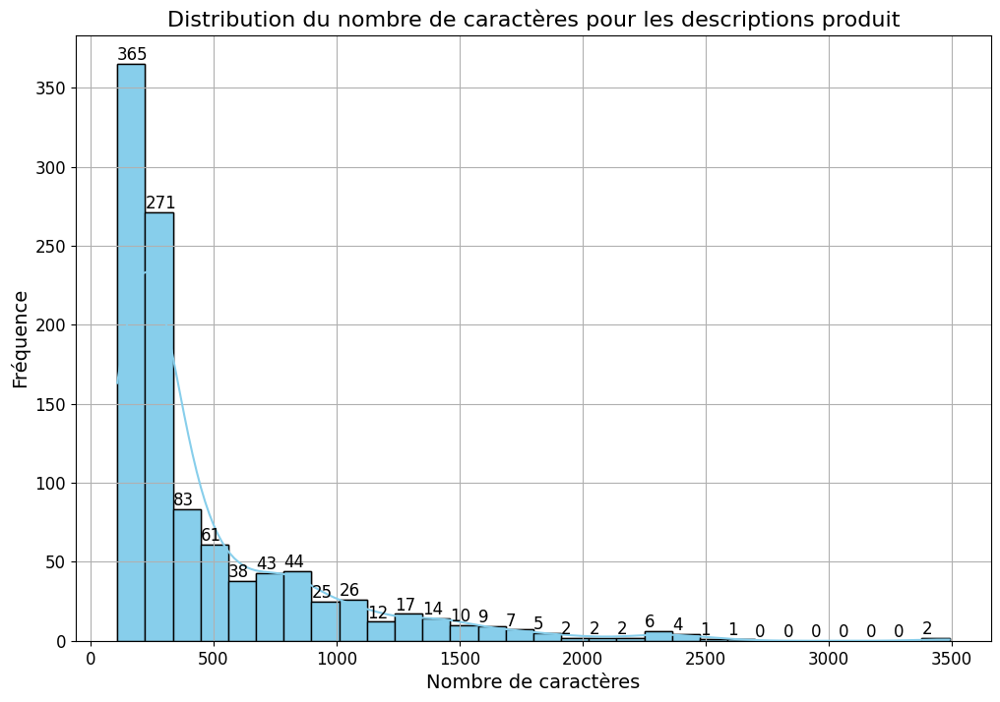

In [46]:
# Distribution de la colonne pour le nombre de caractère
plt.figure(figsize=(12, 8))
sns.histplot(df1['lenght_description'], bins=30, kde=True, color='skyblue', edgecolor='black')

# Ajouter des étiquettes des valeurs
counts, bins, patches = plt.hist(df1['lenght_description'], bins=30, color='skyblue', edgecolor='black')
for count, bin_ in zip(counts, bins):
    plt.text(bin_, count, str(int(count)), fontsize=12, ha='left', va='bottom')

plt.title('Distribution du nombre de caractères pour les descriptions produit', fontsize=16)
plt.xlabel('Nombre de caractères', fontsize=14)
plt.ylabel('Fréquence', fontsize=14)
plt.grid(True)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

## D. Analyse de la colonne 'product name'

In [47]:
# Nombre de valeurs uniques pour les noms de produits
valName = df1['product_name'].nunique()
print(valName)

1050


In [48]:
# Créer une nouvelle colonne 'lenght_name' qui contient la longueur des string
df1['lenght_name'] = df1['product_name'].str.len()

# Total et moyenne de caractères pour les desciptions
totalCar = df1['lenght_name'].sum()
print('Total de caractères pour les descriptions concernant les produits:',totalCar)

means_lenght = df1['lenght_name'].mean()
print('Nombre de caractères en moyenne par description:',means_lenght)

Total de caractères pour les descriptions concernant les produits: 47357
Nombre de caractères en moyenne par description: 45.10190476190476


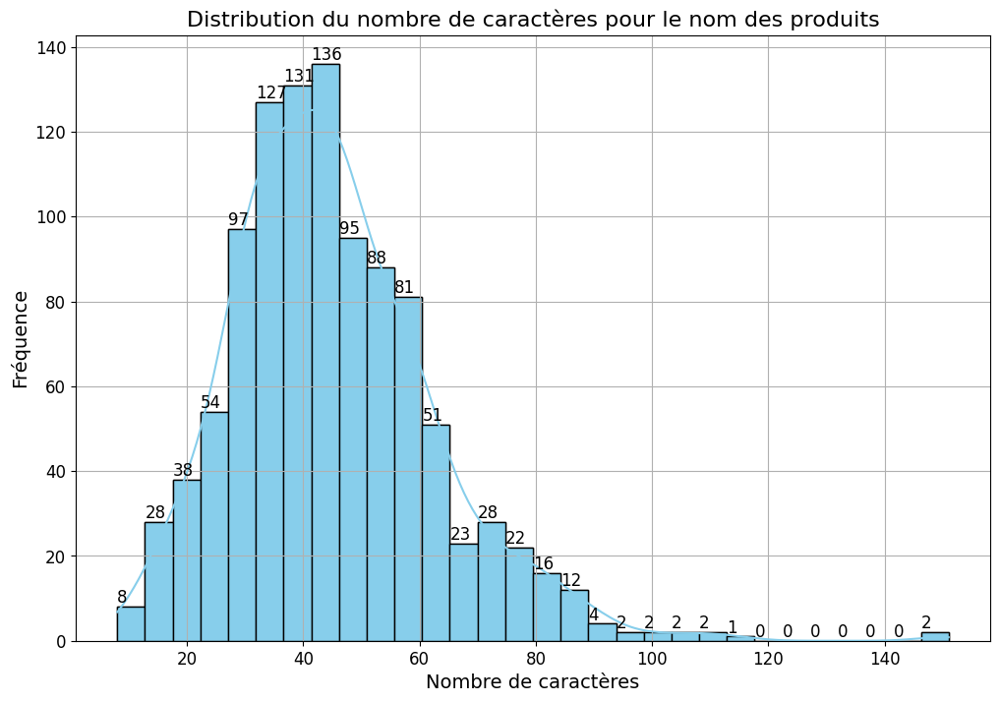

In [49]:
# Distribution de la colonne pour le nombre de caractère
plt.figure(figsize=(12, 8))
sns.histplot(df1['lenght_name'], bins=30, kde=True, color='skyblue', edgecolor='black')

# Ajouter des étiquettes des valeurs
counts, bins, patches = plt.hist(df1['lenght_name'], bins=30, color='skyblue', edgecolor='black')
for count, bin_ in zip(counts, bins):
    plt.text(bin_, count, str(int(count)), fontsize=12, ha='left', va='bottom')

plt.title('Distribution du nombre de caractères pour le nom des produits', fontsize=16)
plt.xlabel('Nombre de caractères', fontsize=14)
plt.ylabel('Fréquence', fontsize=14)
plt.grid(True)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

Nous allons analyser les données textuelles dans la partie suivante

In [50]:
# afficher le dataset et créer un dataset dédié pour l'analyse textuelle
#### colonnes à conserver
df_text = df1[['product_name',
               'product_category_tree',
               'description',
               'tree_depth',
               'Level_1',
               'Level_2',
               'Level_3',
               'Level_4',
               'Level_5',
               'Level_6',
               'Level_7',
               'lenght_description',
               'lenght_name'
              ]].copy()

# consolidation du dataframe en csv
df_text.to_csv('df_text.csv', index=False)

# III. Analyse des données textuelles

Pour l'analyse textuelle, le cahier des charges techniques stipule d'utiliser des méthodes précises d'analyse de données non-structurées.
Voici les méthodes requises : 

- deux approches de type bag-of-words, comptage simple de mots et Tf-idf ;
  
- une approche de type word/sentence embedding classique avec Word2Vec (ou Glove ou FastText) ;
  
- une approche de type word/sentence embedding avec BERT ;
  
- une approche de type word/sentence embedding avec USE (Universal Sentence Encoder).

## Détails sur les approches à employer dans le cahier des charges

Pour stucturer cette troisième paratie, nous allons scinder l'étude avec en premier la variable pour les noms de produits, puis nous enchainerons sur l'analyse des description produits.

In [10]:
df_text = pd.read_csv('df_text.csv')

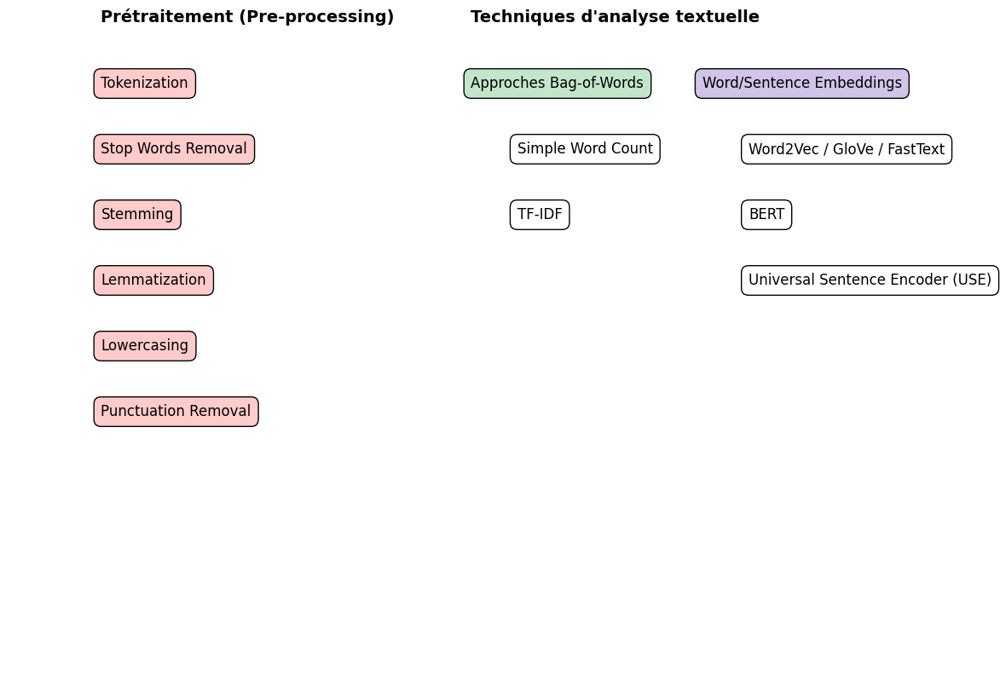

In [29]:
# Création du schéma
fig, ax = plt.subplots(figsize=(14, 10))

# Couleurs
color_preprocessing = '#ffcccb'
color_analysis = '#c3e6cb'
color_embedding = '#d1c4e9'

# Prétraitement
preprocessing = ["Tokenization", "Stop Words Removal", "Stemming", "Lemmatization", "Lowercasing", "Punctuation Removal"]

# Techniques d'analyse
bow_approaches = ["Simple Word Count", "TF-IDF"]
embedding_approaches = ["Word2Vec / GloVe / FastText", "BERT", "Universal Sentence Encoder (USE)"]

# Position des éléments
y_start = 0.9
x_pre = 0.1
x_analysis = 0.5
x_embedding = 0.75

# Ajout des éléments de prétraitement
for i, step in enumerate(preprocessing):
    ax.text(x_pre, y_start - i * 0.1, step, fontsize=12, bbox=dict(facecolor=color_preprocessing, edgecolor='black', boxstyle='round,pad=0.5'))

# Ajout des titres
ax.text(x_pre, y_start + 0.1, "Prétraitement (Pre-processing)", fontsize=14, weight='bold')
ax.text(x_analysis, y_start + 0.1, "Techniques d'analyse textuelle", fontsize=14, weight='bold')

# Ajout des éléments d'analyse Bag-of-Words
ax.text(x_analysis, y_start, "Approches Bag-of-Words", fontsize=12, bbox=dict(facecolor=color_analysis, edgecolor='black', boxstyle='round,pad=0.5'))
for i, step in enumerate(bow_approaches):
    ax.text(x_analysis + 0.05, y_start - (i+1) * 0.1, step, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

# Ajout des éléments d'analyse Embeddings
ax.text(x_embedding, y_start, "Word/Sentence Embeddings", fontsize=12, bbox=dict(facecolor=color_embedding, edgecolor='black', boxstyle='round,pad=0.5'))
for i, step in enumerate(embedding_approaches):
    ax.text(x_embedding + 0.05, y_start - (i+1) * 0.1, step, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

# Suppression des axes
ax.axis('off')

# Affichage
plt.show()


## A. Préparation du nettoyage du texte

**Création d'une fonction de nettoyage global, avant d'utiliser d'autres techniques d'analyse de texte :**
- enlever la ponctuation
- tokenisation
- supprimer les stopwords
- mettre en minuscule
- stemming
- lemmatization (choix de la lemmatisation ald du stemming)
- supprimer les lettres isolées
- conservation des noms et adjectifs (piste explorée mais non concluante)

In [30]:
# Afficher les mots dits 'stop_words' en anglais
english_sw = nltk.corpus.stopwords.words('english')
print('afficher les stop-words:', english_sw)

afficher les stop-words: ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own'

In [31]:
# télécharger les ressources nécessaires 
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\justi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\justi\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\justi\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\justi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

### 1. Application de la fonction de pré-traitement sur la colonne 'description'

In [32]:
def clean_text_column(df, column_name):
    """
    Cette fonction nettoie une colonne de texte dans un DataFrame et conserve uniquement les noms et les adjectifs.
    :param df: DataFrame pandas
    :param column_name: Nom de la colonne à nettoyer
    :return: DataFrame avec une nouvelle colonne nettoyée
    """
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    def clean_text(text):
        # Mettre en minuscule
        text = text.lower()
        
        # Suppression de la ponctuation en ajoutant des espaces pour éviter la concatenation des mots
        text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
        
        # Tokenisation
        words = word_tokenize(text)
        
        # Suppression des stop words, des caractères non alphabétiques, et des lettres uniques
        words = [word for word in words if word.isalpha() and word not in stop_words and len(word) > 1]
        
        # POS tagging
        tagged_words = pos_tag(words)
        
        # Conserver seulement les noms (NN) et les adjectifs (JJ)
        words = [word for word, tag in tagged_words if tag in ('NN', 'NNS', 'NNP', 'NNPS', 'JJ', 'JJR', 'JJS')]
        
        # Lemmatisation
        words = [lemmatizer.lemmatize(word) for word in words]
        
        return ' '.join(words)
    
    clean_column_name = 'clean_' + column_name
    df[clean_column_name] = df[column_name].apply(clean_text)
    
    return df

# Utilisation de la fonction sur la colonne description
df_text = clean_text_column(df_text, 'description')


In [53]:
def clean_text_column(df, column_name):
    """
    Cette fonction nettoie une colonne de texte dans un DataFrame et conserve uniquement les noms et les adjectifs.
    :param df: DataFrame pandas
    :param column_name: Nom de la colonne à nettoyer
    :return: DataFrame avec une nouvelle colonne nettoyée
    """
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    def clean_text(text):
        print("\n===== Début du pré-traitement =====")
        print(f"Texte original:\n{text}\n")

        # Mettre en minuscule
        text = text.lower()
        print(f"Après mise en minuscule:\n{text}\n")

        # Suppression de la ponctuation en ajoutant des espaces pour éviter la concatenation des mots
        text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
        print(f"Après suppression de la ponctuation:\n{text}\n")

        # Tokenisation
        words = word_tokenize(text)
        print(f"Après tokenisation:\n{words}\n")

        # Suppression des stop words, des caractères non alphabétiques, et des lettres uniques
        words = [word for word in words if word.isalpha() and word not in stop_words and len(word) > 1]
        print(f"Après suppression des stop words et des caractères non alphabétiques:\n{words}\n")

        # POS tagging
        tagged_words = pos_tag(words)
        print(f"Après POS tagging:\n{tagged_words}\n")

        # Conserver seulement les noms (NN) et les adjectifs (JJ)
        words = [word for word, tag in tagged_words if tag in ('NN', 'NNS', 'NNP', 'NNPS', 'JJ', 'JJR', 'JJS')]
        print(f"Après filtrage des noms et adjectifs:\n{words}\n")

        # Lemmatisation
        words = [lemmatizer.lemmatize(word) for word in words]
        print(f"Après lemmatisation:\n{words}\n")

        print("===== Fin du pré-traitement =====\n")
        return ' '.join(words)
    
    # Appliquer la fonction seulement à la première ligne de la colonne
    first_row_text = df[column_name].iloc[5]
    cleaned_text = clean_text(first_row_text)
    
    print(f"Texte nettoyé final:\n{cleaned_text}")
    
    # Créer une nouvelle colonne avec le texte nettoyé pour la première ligne
    clean_column_name = 'clean_' + column_name
    df.loc[0, clean_column_name] = cleaned_text
    
    return df

# Utilisation de la fonction sur la colonne product_name
df_text = clean_text_column(df_text, 'description')


===== Début du pré-traitement =====
Texte original:
Maserati Time R8851116001 Analog Watch  - For Boys - Buy Maserati Time R8851116001 Analog Watch  - For Boys  R8851116001 Online at Rs.24400 in India Only at Flipkart.com. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!

Après mise en minuscule:
maserati time r8851116001 analog watch  - for boys - buy maserati time r8851116001 analog watch  - for boys  r8851116001 online at rs.24400 in india only at flipkart.com. - great discounts, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!

Après suppression de la ponctuation:
maserati time r8851116001 analog watch    for boys   buy maserati time r8851116001 analog watch    for boys  r8851116001 online at rs 24400 in india only at flipkart com    great discounts  only genuine products  30 day replacement guarantee  free shipping  cash on delivery 

Après tokenisation:
['maserati', 'time', 'r8851116001'

In [33]:
# Calculer la longueur des caractères dans les colonnes 'description' et 'clean_description'
df_text['description_length'] = df_text['description'].astype(str).apply(len)
df_text['clean_description_length'] = df_text['clean_description'].astype(str).apply(len)

# Calculer les totaux des colonnes
total_description_length = df_text['description_length'].sum()
total_clean_description_length = df_text['clean_description_length'].sum()

# Calculer la différence entre les totaux
total_difference = total_description_length - total_clean_description_length

# Calculer la différence relative (en pourcentage)
if total_description_length != 0:
    relative_difference = (total_difference / total_description_length) * 100
else:
    relative_difference = 0

# Afficher les résultats
print(f"Total description length: {total_description_length}")
print(f"Total clean description length: {total_clean_description_length}")
print(f"Total difference: {total_difference}")
print(f"Relative difference: {relative_difference:.2f}%")


Total description length: 497512
Total clean description length: 301155
Total difference: 196357
Relative difference: 39.47%


### 2. Application de la fonction de pré-traitement sur la colonne 'product name'

In [34]:
def clean_text_column(df, column_name):
    """
    Cette fonction nettoie une colonne de texte dans un DataFrame et conserve uniquement les noms et les adjectifs.
    :param df: DataFrame pandas
    :param column_name: Nom de la colonne à nettoyer
    :return: DataFrame avec une nouvelle colonne nettoyée
    """
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    def clean_text(text):
        # Mettre en minuscule
        text = text.lower()
        
        # Suppression de la ponctuation en ajoutant des espaces pour éviter la concatenation des mots
        text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
        
        # Tokenisation
        words = word_tokenize(text)
        
        # Suppression des stop words, des caractères non alphabétiques, et des lettres uniques
        words = [word for word in words if word.isalpha() and word not in stop_words and len(word) > 1]
        
        # POS tagging
        tagged_words = pos_tag(words)
        
        # Conserver seulement les noms (NN) et les adjectifs (JJ)
        #words = [word for word, tag in tagged_words if tag in ('NN', 'NNS', 'NNP', 'NNPS', 'JJ', 'JJR', 'JJS')]
        
        # Lemmatisation
        words = [lemmatizer.lemmatize(word) for word in words]
        
        return ' '.join(words)
    
    clean_column_name = 'clean_' + column_name
    df[clean_column_name] = df[column_name].apply(clean_text)
    
    return df

# Utilisation de la fonction sur la colonne description
df_text = clean_text_column(df_text, 'product_name')


In [44]:
def clean_text_column(df, column_name):
    """
    Cette fonction nettoie une colonne de texte dans un DataFrame et conserve uniquement les noms et les adjectifs.
    :param df: DataFrame pandas
    :param column_name: Nom de la colonne à nettoyer
    :return: DataFrame avec une nouvelle colonne nettoyée
    """
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    def clean_text(text):
        print("\n===== Début du pré-traitement =====")
        print(f"Texte original:\n{text}\n")

        # Mettre en minuscule
        text = text.lower()
        print(f"Après mise en minuscule:\n{text}\n")

        # Suppression de la ponctuation en ajoutant des espaces pour éviter la concatenation des mots
        text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
        print(f"Après suppression de la ponctuation:\n{text}\n")

        # Tokenisation
        words = word_tokenize(text)
        print(f"Après tokenisation:\n{words}\n")

        # Suppression des stop words, des caractères non alphabétiques, et des lettres uniques
        words = [word for word in words if word.isalpha() and word not in stop_words and len(word) > 1]
        print(f"Après suppression des stop words et des caractères non alphabétiques:\n{words}\n")

        # POS tagging
        tagged_words = pos_tag(words)
        print(f"Après POS tagging:\n{tagged_words}\n")

        # Conserver seulement les noms (NN) et les adjectifs (JJ)
        words = [word for word, tag in tagged_words if tag in ('NN', 'NNS', 'NNP', 'NNPS', 'JJ', 'JJR', 'JJS')]
        print(f"Après filtrage des noms et adjectifs:\n{words}\n")

        # Lemmatisation
        words = [lemmatizer.lemmatize(word) for word in words]
        print(f"Après lemmatisation:\n{words}\n")

        print("===== Fin du pré-traitement =====\n")
        return ' '.join(words)
    
    # Appliquer la fonction seulement à la première ligne de la colonne
    first_row_text = df[column_name].iloc[1]
    cleaned_text = clean_text(first_row_text)
    
    print(f"Texte nettoyé final:\n{cleaned_text}")
    
    # Créer une nouvelle colonne avec le texte nettoyé pour la première ligne
    clean_column_name = 'clean_' + column_name
    df.loc[0, clean_column_name] = cleaned_text
    
    return df

# Création d'un DataFrame d'exemple pour démonstration
#data = {'product_name': ["This is an example sentence for NLP preprocessing, containing punctuation, and some stopwords."]}
#df_text = pd.DataFrame(data)

# Utilisation de la fonction sur la colonne product_name
df_text = clean_text_column(df_text, 'product_name')


===== Début du pré-traitement =====
Texte original:
Sathiyas Cotton Bath Towel

Après mise en minuscule:
sathiyas cotton bath towel

Après suppression de la ponctuation:
sathiyas cotton bath towel

Après tokenisation:
['sathiyas', 'cotton', 'bath', 'towel']

Après suppression des stop words et des caractères non alphabétiques:
['sathiyas', 'cotton', 'bath', 'towel']

Après POS tagging:
[('sathiyas', 'JJ'), ('cotton', 'NN'), ('bath', 'NN'), ('towel', 'NN')]

Après filtrage des noms et adjectifs:
['sathiyas', 'cotton', 'bath', 'towel']

Après lemmatisation:
['sathiyas', 'cotton', 'bath', 'towel']

===== Fin du pré-traitement =====

Texte nettoyé final:
sathiyas cotton bath towel


In [35]:
# Calculer la longueur des caractères dans les colonnes 'product_name' et 'clean_product_name'
df_text['product_name_length'] = df_text['product_name'].astype(str).apply(len)
df_text['clean_product_name_length'] = df_text['clean_product_name'].astype(str).apply(len)

# Calculer les totaux des colonnes
total_product_name_length = df_text['product_name_length'].sum()
total_clean_product_name_length = df_text['clean_product_name_length'].sum()

# Calculer la différence entre les totaux
total_difference = total_product_name_length - total_clean_product_name_length

# Calculer la différence relative (en pourcentage)
relative_difference = (total_difference / total_product_name_length) * 100

# Afficher les résultats
print(f"Total product name length: {total_product_name_length}")
print(f"Total clean product name length: {total_clean_product_name_length}")
print(f"Total difference: {total_difference}")
print(f"Relative difference: {relative_difference:.2f}%")


Total product name length: 47357
Total clean product name length: 39851
Total difference: 7506
Relative difference: 15.85%


### 3. Comparaison avant et après cleaning

In [36]:
# Définir l'option pour afficher la totalité du contenu des colonnes
pd.set_option('display.max_colwidth', None)

# Afficher les trois premières lignes des colonnes 'description' et 'clean_description'
df_text[['description', 'clean_description']].head(3)

,description,clean_description
0,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",key feature polyester multicolor abstract eyelet door floral curtain elegance polyester multicolor abstract eyelet door curtain cm pack price r curtain enhances interior high quality polyester fabric feature style stitch metal room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain draw first thing morning welcome bright sun ray wish good morning whole world draw close evening create special moment joyous beauty print home elegant curtain filter room right amount specification elegance polyester multicolor abstract eyelet door curtain cm general brand elegance door type eyelet model name abstract polyester door curtain model id color multicolor dimension cm box number content sale pack sale package body design material polyester
1,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",specification cotton bath towel bath towel yellow blue bath towel feature machine washable material cotton design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl id color yellow blue size mediam dimension inch width inch box number content sale package sale bath towel
2,"Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our product is 100% cotton, so it is susceptible to shrinkage. Product color may vary from the picture. Size may vary by ±3% WASH CARE: Wash in cold Water, Do not Iron, Do not Bleach, Flat dry, Wash before first use. SIZE- FACE TOWEL - 23 cms X 23 cms.,Specifications of Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) B

In [10]:
# Définir l'option pour afficher la totalité du contenu des colonnes
pd.set_option('display.max_colwidth', None)

# Afficher les trois premières lignes des colonnes 'description' et 'clean_description'
df_text[['product_name', 'clean_product_name']].head(3)

,product_name,clean_product_name
0,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,elegance polyester multicolor abstract eyelet door curtain
1,Sathiyas Cotton Bath Towel,sathiyas cotton bath towel
2,Eurospa Cotton Terry Face Towel Set,eurospa cotton terry face towel set


Pour simplifier et éviter d'avoir deux variables textuelles à gérer, je vais concaténer la description et le nom du produit, en créant une variable, puis appliquer la fonction de pré-traitement sur le corpus. Nous allons également enlever la stemmatisation, en ne laissant que la lemmatisation, plus efficace, et la conjonction des deux n'est pas pertinente car à la fois trop de proximité mais avec des nuances qui peuvent être contradictoire.

In [37]:
# concaténation de product_name et description pour créer une variable corpus
df_text['corpus'] = df_text['product_name'] + ' ' + df_text['description']

In [38]:
def clean_text_column(df, column_name):
    """
    Cette fonction nettoie une colonne de texte dans un DataFrame et conserve uniquement les noms et les adjectifs.
    :param df: DataFrame pandas
    :param column_name: Nom de la colonne à nettoyer
    :return: DataFrame avec une nouvelle colonne nettoyée
    """
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    def clean_text(text):
        # Mettre en minuscule
        text = text.lower()
        
        # Suppression de la ponctuation en ajoutant des espaces pour éviter la concatenation des mots
        text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
        
        # Tokenisation
        words = word_tokenize(text)
        
        # Suppression des stop words, des caractères non alphabétiques, et des lettres uniques
        words = [word for word in words if word.isalpha() and word not in stop_words and len(word) > 1]
        
        # POS tagging
        tagged_words = pos_tag(words)
        
        # Conserver seulement les noms (NN) et les adjectifs (JJ)
        #words = [word for word, tag in tagged_words if tag in ('NN', 'NNS', 'NNP', 'NNPS', 'JJ', 'JJR', 'JJS')]
        
        # Lemmatisation
        words = [lemmatizer.lemmatize(word) for word in words]
        
        return ' '.join(words)
    
    clean_column_name = 'clean_' + column_name
    df[clean_column_name] = df[column_name].apply(clean_text)
    
    return df

# Utilisation de la fonction sur la colonne description
df_text = clean_text_column(df_text, 'corpus')


In [39]:
# Définir l'option pour afficher la totalité du contenu des colonnes
pd.set_option('display.max_colwidth', None)

# Afficher les trois premières lignes des colonnes 'description' et 'clean_description'
df_text[['corpus', 'clean_corpus']].head(3)

,corpus,clean_corpus
0,"Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",elegance polyester multicolor abstract eyelet door curtain key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interior curtain made high quality polyester fabric feature eyelet style stitch metal ring make room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester
1,"Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",sathiyas cotton bath towel specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel
2,"Eurospa Cotton Terry Face Towel Set Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for

Nous venons d'effectuer le pré-traitement des variables de texte. Désormais, nous avons une variable clean_corpus qui représente l'ensemble de notre texte consolidé et pré-traité, nous allons donc pouvoir passer à l'analyse de celle-ci selon les différentes approches spécifiées.

In [40]:
# Création d'un dataframe et consolidation
df_nlp = df_text[['product_name',
                  'clean_corpus',
                  'clean_description',
                  'clean_product_name',
                  'Level_1']].copy()

# Création d'un csv pour consolidation du df
df_nlp.to_csv('df_nlp.csv', index=False)

## B. Analyse textuelle avec une approche "Bags of words"

### 1. Comptage simple des mots

#### a. Variable 'product_name'

In [9]:
# Fonction pour compter les mots
def word_count(text):
    words = re.findall(r'\b\w+\b', text.lower())
    return Counter(words)

# Appliquer la fonction à la colonne product_name
word_counts = df_text['clean_product_name'].apply(word_count)

# Combiner tous les compteurs
total_word_count = sum(word_counts, Counter())

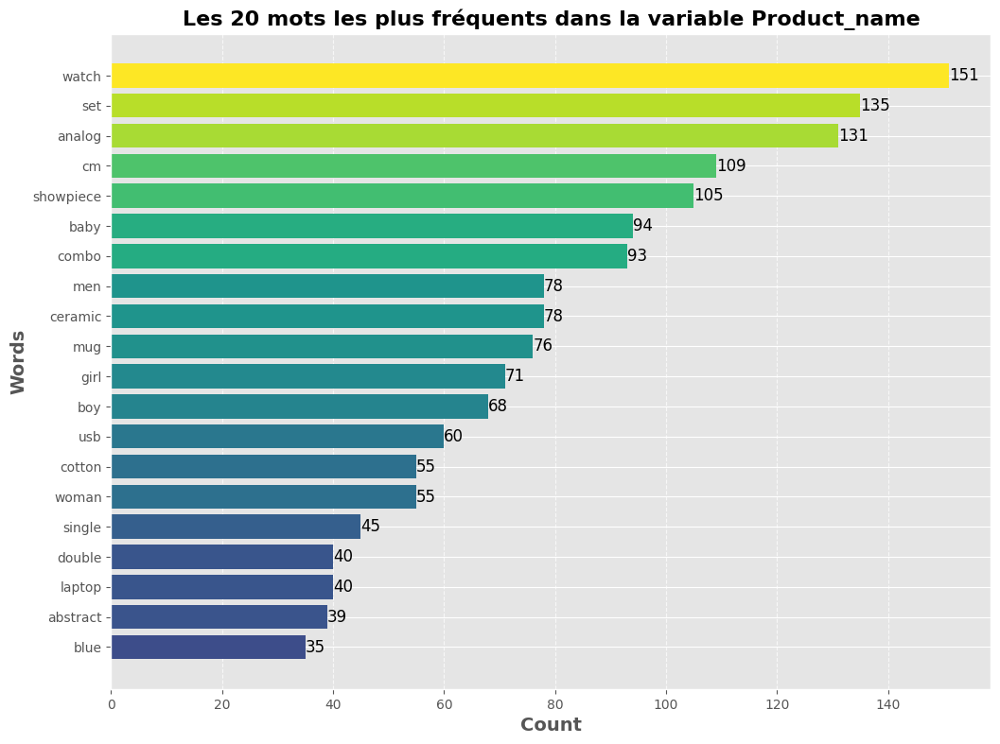

In [10]:
from matplotlib import style

# Style de fond
style.use('ggplot')

# Obtenir les 20 mots les plus fréquents
most_common_words = total_word_count.most_common(20)

# Convertir en dataframe pour visualisation
common_words_df = pd.DataFrame(most_common_words, columns=['Word', 'Count'])

# Plot
plt.figure(figsize=(12, 9))
bars = plt.barh(common_words_df['Word'], common_words_df['Count'], color=plt.cm.viridis(common_words_df['Count'] / max(common_words_df['Count'])))
plt.xlabel('Count', fontsize=14, fontweight='bold')
plt.ylabel('Words', fontsize=14, fontweight='bold')
plt.title('Les 20 mots les plus fréquents dans la variable Product_name', fontsize=16, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Ajouter des étiquettes de valeurs
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, 
             str(bar.get_width()), va='center', ha='left', fontsize=12, color='black')

plt.show()

#### b. Variable 'description'

In [11]:
# Fonction pour compter les mots
def word_count(text):
    words = re.findall(r'\b\w+\b', text.lower())
    return Counter(words)

# Appliquer la fonction à la colonne product_name
word_counts = df_text['clean_description'].apply(word_count)

# Combiner tous les compteurs
total_word_count = sum(word_counts, Counter())

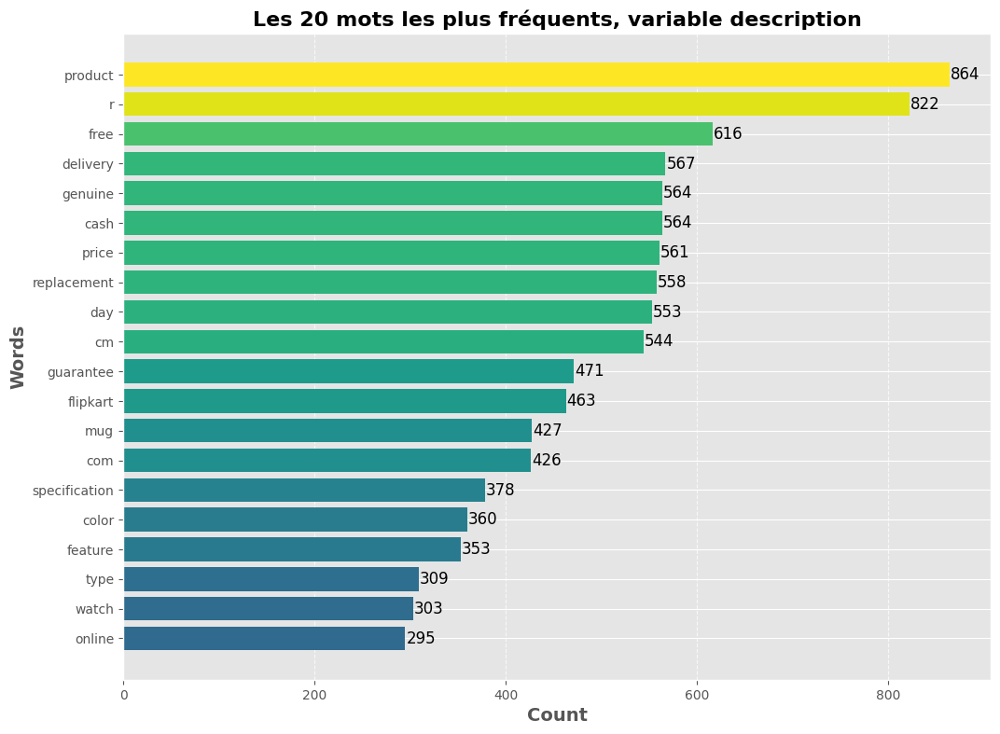

In [12]:
# Style de fond
style.use('ggplot')

# Obtenir les 20 mots les plus fréquents
most_common_words = total_word_count.most_common(20)

# Convertir en dataframe pour visualisation
common_words_df = pd.DataFrame(most_common_words, columns=['Word', 'Count'])

# Plot
plt.figure(figsize=(12, 9))
bars = plt.barh(common_words_df['Word'], common_words_df['Count'], 
                color=plt.cm.viridis(common_words_df['Count'] / max(common_words_df['Count'])))
plt.xlabel('Count', fontsize=14, fontweight='bold')
plt.ylabel('Words', fontsize=14, fontweight='bold')
plt.title('Les 20 mots les plus fréquents, variable description', fontsize=16, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Ajouter des étiquettes de valeurs
for bar in bars:
    plt.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
             str(bar.get_width()), va='center', ha='left', fontsize=12, color='black')

plt.show()

#### c. Analyse bivariée : product_name & description

In [13]:
# Fonction pour compter les mots
def word_count(text):
    words = re.findall(r'\b\w+\b', text.lower())
    return Counter(words)

# Appliquer la fonction aux colonnes product_name et description
word_counts_product_name = df_text['clean_product_name'].apply(word_count)
word_counts_description = df_text['clean_description'].apply(word_count)

# Combiner tous les compteurs pour chaque colonne
total_word_count_product_name = sum(word_counts_product_name, Counter())
total_word_count_description = sum(word_counts_description, Counter())

# Trouver les mots communs
common_words = set(total_word_count_product_name.keys()) & set(total_word_count_description.keys())

# Préparer les données pour le nuage de points
common_word_frequencies = {
    word: (total_word_count_product_name[word], total_word_count_description[word]) 
    for word in common_words
}

# Convertir en dataframe pour visualisation
common_words_df = pd.DataFrame.from_dict(common_word_frequencies, orient='index', columns=['clean_product_name', 'clean_description'])

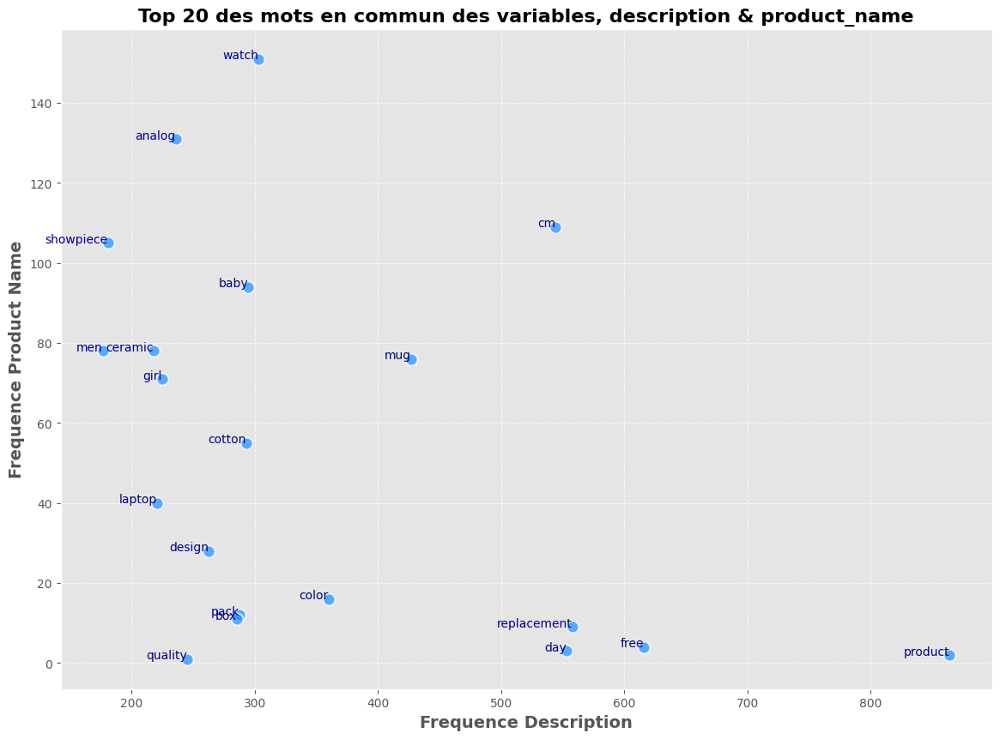

In [14]:
from matplotlib import style

# Style de fond
#style.use('seaborn-darkgrid')

# Sélectionner les 20 mots les plus fréquents en commun
common_words_df['total_frequency'] = common_words_df['clean_product_name'] + common_words_df['clean_description']
top_20_common_words_df = common_words_df.sort_values(by='total_frequency', ascending=False).head(20)

# Plot
plt.figure(figsize=(14, 10))
plt.scatter(top_20_common_words_df['clean_description'], top_20_common_words_df['clean_product_name'], 
            color='dodgerblue', alpha=0.7, s=100, edgecolors='w', linewidth=1.5)
plt.xlabel('Frequence Description', fontsize=14, fontweight='bold')
plt.ylabel('Frequence Product Name', fontsize=14, fontweight='bold')
plt.title('Top 20 des mots en commun des variables, description & product_name', fontsize=16, fontweight='bold')

# Ajouter des étiquettes pour les points
for word, row in top_20_common_words_df.iterrows():
    plt.text(row['clean_description'], row['clean_product_name'], word, fontsize=10, ha='right', color='darkblue')

plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


#### d. Visualisation avec des Words-Clouds par catégorie selon la description

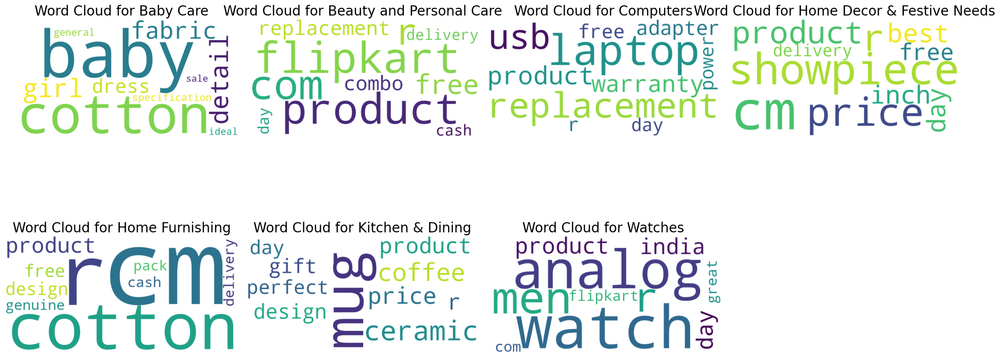

In [15]:
# Fonction pour générer et afficher un nuage de mots dans un subplot
def generate_wordcloud_subplot(ax, word_counts, title=None):
    # Obtenir les 10 mots les plus fréquents
    most_common_words = dict(word_counts.most_common(10))
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(most_common_words)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    if title:
        ax.set_title(title, fontsize=20)

# Group by 'Level_1' and combine descriptions
grouped = df_text.groupby('Level_1')['clean_description'].apply(lambda x: ' '.join(x))

# Nombre total de catégories
num_categories = len(grouped)
# Nombre de colonnes
num_cols = (num_categories + 1) // 2

fig, axes = plt.subplots(2, num_cols, figsize=(20, 10))

# Aplatir les axes pour faciliter l'itération
axes = axes.flatten()

# Générer les nuages de mots pour chaque catégorie
for idx, (category, text) in enumerate(grouped.items()):
    word_counts = word_count(text)
    generate_wordcloud_subplot(axes[idx], word_counts, title=f'Word Cloud for {category}')

# Cacher les axes inutilisés
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### e. Visualisation avec des Words-Clouds par catégorie selon le product_name

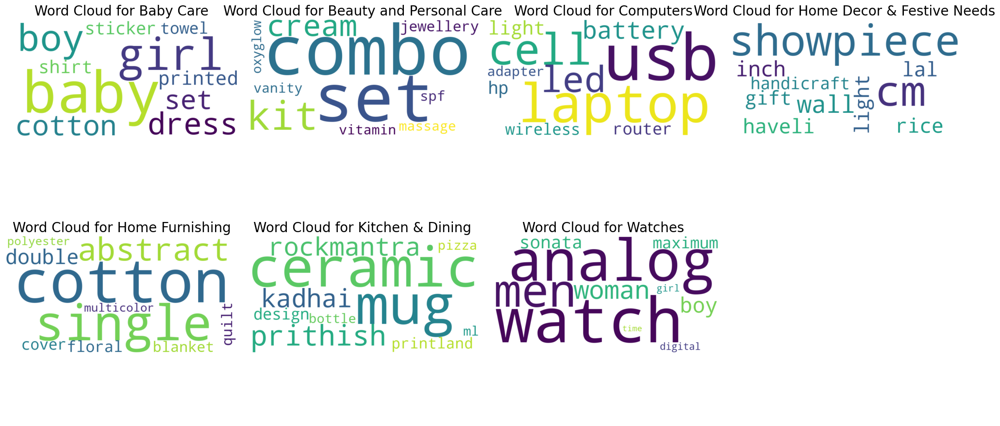

In [16]:
# Fonction pour générer et afficher un nuage de mots
def generate_wordcloud(word_counts, title=None, ax=None):
    # Obtenir les 15 mots les plus fréquents
    most_common_words = dict(word_counts.most_common(10))
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(most_common_words)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    if title:
        ax.set_title(title, fontsize=20)

# Group by 'Level_1' and combine descriptions
grouped = df_text.groupby('Level_1')['clean_product_name'].apply(lambda x: ' '.join(x))

# Determine the number of columns needed for a 2-row layout
num_categories = len(grouped)
num_rows = 2
num_cols = (num_categories + 1) // num_rows

# Create a figure with a grid of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Generate word clouds for each category
for i, (category, text) in enumerate(grouped.items()):
    word_counts = word_count(text)
    generate_wordcloud(word_counts, title=f'Word Cloud for {category}', ax=axes[i])

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


#### f. Variable 'clean_corpus'

In [37]:
# Fonction pour compter les mots
def word_count(text):
    words = re.findall(r'\b\w+\b', text.lower())
    return Counter(words)

# Appliquer la fonction à la colonne product_name
word_counts = df_text['clean_corpus'].apply(word_count)

# Combiner tous les compteurs
total_word_count = sum(word_counts, Counter())

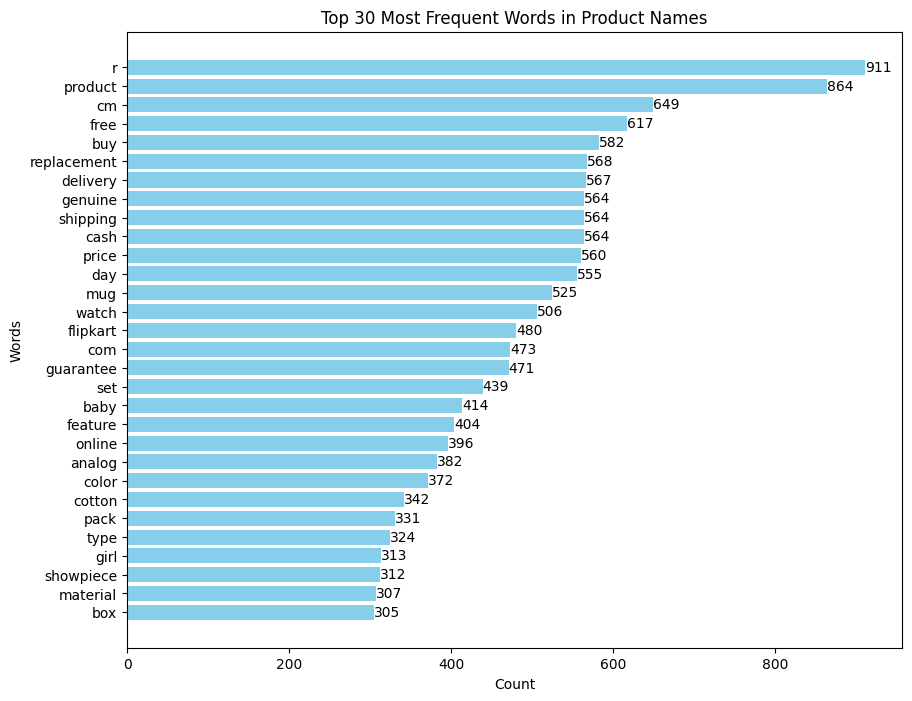

In [38]:
# Obtenir les 30 mots les plus fréquents
most_common_words = total_word_count.most_common(30)

# Convertir en dataframe pour visualisation
common_words_df = pd.DataFrame(most_common_words, columns=['Word', 'Count'])

# Plot
plt.figure(figsize=(10, 8))
bars = plt.barh(common_words_df['Word'], common_words_df['Count'], color='skyblue')
plt.xlabel('Count')
plt.ylabel('Words')
plt.title('Top 30 Most Frequent Words in Product Names')
plt.gca().invert_yaxis()

# Ajouter des étiquettes de valeurs
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, 
             str(bar.get_width()), va='center')

plt.show()

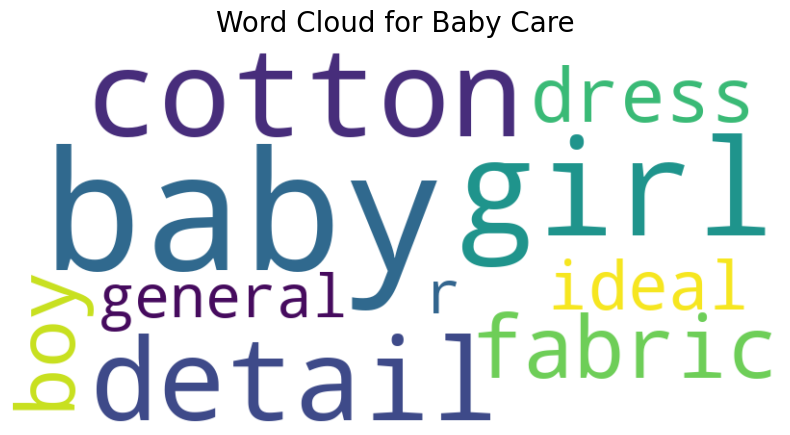

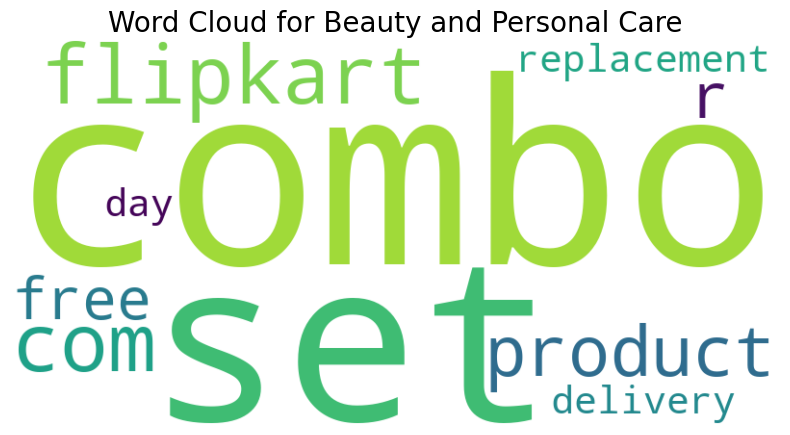

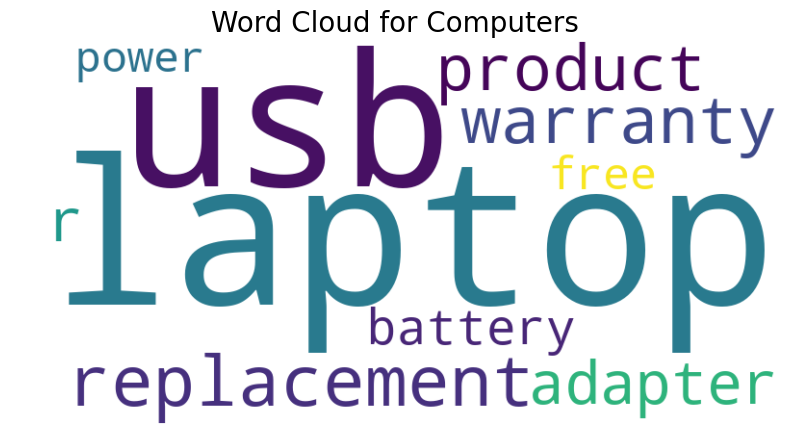

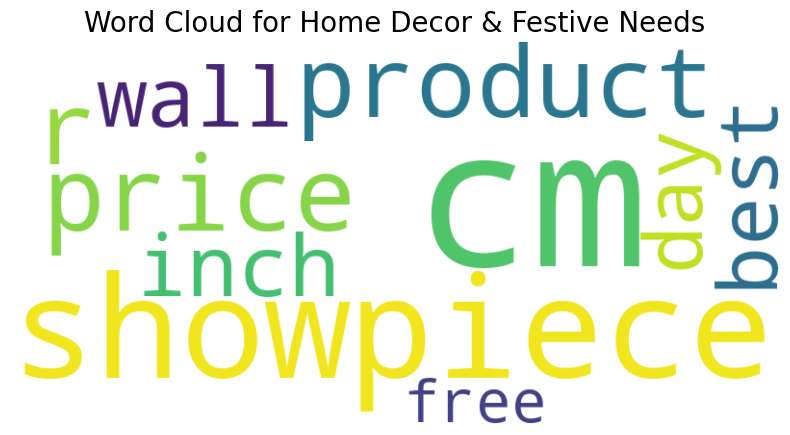

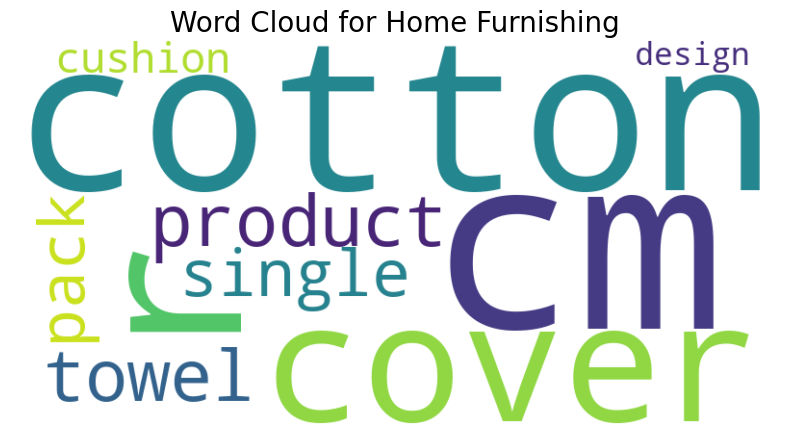

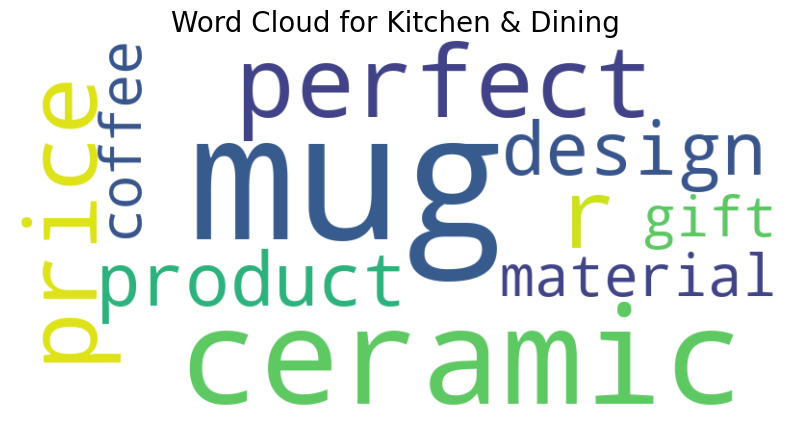

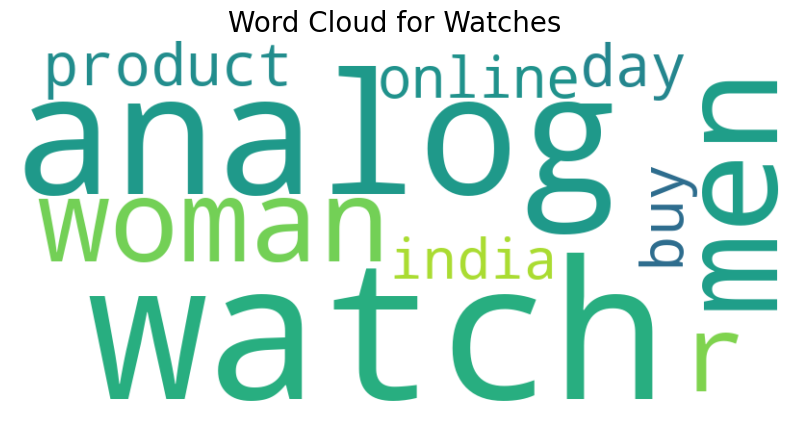

In [39]:
# Fonction pour générer et afficher un nuage de mots
def generate_wordcloud(word_counts, title=None):
    # Obtenir les 15 mots les plus fréquents
    most_common_words = dict(word_counts.most_common(10))
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(most_common_words)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    if title:
        plt.title(title, fontsize=20)
    plt.show()

# Group by 'Level_1' and combine descriptions
grouped = df_text.groupby('Level_1')['clean_corpus'].apply(lambda x: ' '.join(x))

# Generate word clouds for each category
for category, text in grouped.items():
    word_counts = word_count(text)
    generate_wordcloud(word_counts, title=f'Word Cloud for {category}')

La méthode du compatage simple de mot présente des résultats qui sont plutôt cohérents dans le sens où nous avons des mots qui ressortent en accord avec la catégorie, cependant cela peut-être optimisable car nous avons encore du 'bruit' de spécifié comme la lettre 'r', 'product', etc ... Nous allons continuer avec une approche plus poussée qui est tf-idf

### 2. Utilisation de TF - IDF

#### a. Variable 'product_name'

In [46]:
# Créer un objet TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer()

# Appliquer le vectorizer à la colonne clean_description du DataFrame
tfidf_matrix = tfidf_vectorizer.fit_transform(df_text['clean_product_name'])

# Convertir le résultat en DataFrame
tfidf_df_product_name = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Afficher les 5 premières lignes du DataFrame TF-IDF
tfidf_df_product_name.head(5)

# Importation de la target catégorielle
#tfidf_df_product_name['Level_1'] = df_text['Level_1'].copy()

# Transformation en csv des features et du dataframe
tfidf_df_product_name.to_csv('tf_idf_df_pn.csv', index = False)

In [47]:
tfidf_df_product_name.shape

(1050, 1820)

In [48]:
# Somme des valeurs TF-IDF pour chaque terme
term_importance = tfidf_df_product_name.sum().sort_values(ascending=False)

# Afficher les termes les plus importants
print(term_importance.head(15))

watch        44.056903
analog       39.550879
set          29.955824
cm           27.088107
men          26.521380
showpiece    26.328685
ceramic      24.820939
mug          24.643455
baby         24.505279
combo        22.795251
woman        21.040434
girl         20.417171
boy          19.761067
cotton       17.634600
single       14.348291
dtype: float64


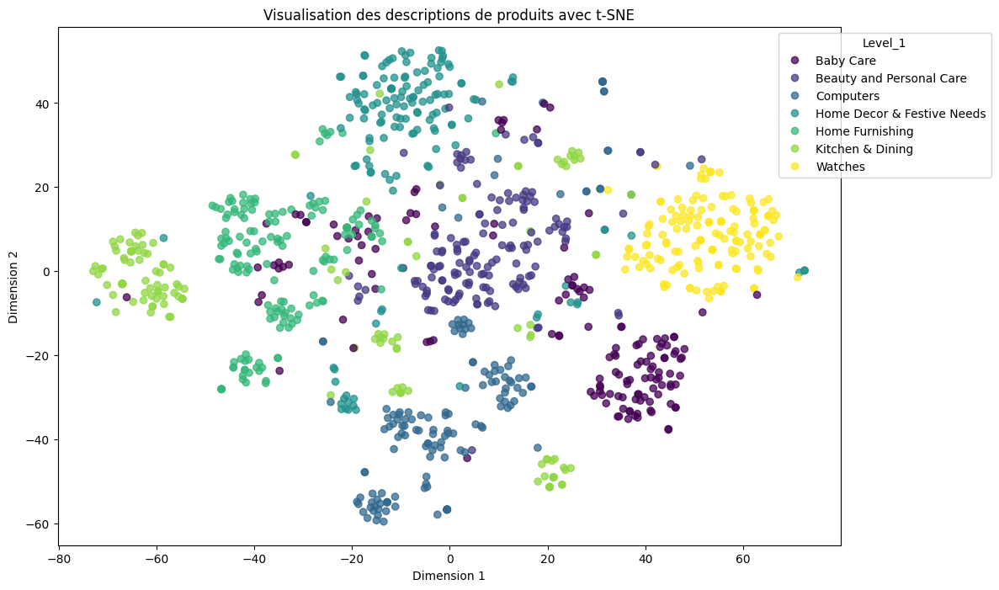

In [49]:
# Appliquer t-SNE pour réduire la dimensionnalité à 2D
tsne_model = TSNE(n_components=2, random_state=42)
tsne_matrix = tsne_model.fit_transform(tfidf_df_product_name)

# Créer un DataFrame avec les résultats t-SNE
tsne_df = pd.DataFrame(tsne_matrix, columns=['x', 'y'])

# Ajouter la variable Level_1 au DataFrame t-SNE
tsne_df['Level_1'] = df_text['Level_1']

# Encoder la variable catégorielle Level_1 en numérique
label_encoder = LabelEncoder()
tsne_df['Level_1_encoded'] = label_encoder.fit_transform(tsne_df['Level_1'])

# Visualiser les mots dans l'espace t-SNE
plt.figure(figsize=(12, 8))

# Utiliser un jeu de couleurs en fonction de la variable Level_1 encodée
scatter = plt.scatter(tsne_df['x'], tsne_df['y'], c=tsne_df['Level_1_encoded'], cmap='viridis', alpha=0.75)

# Créer la légende avec les noms des catégories
handles, _ = scatter.legend_elements()
labels = label_encoder.inverse_transform(range(len(handles)))
legend = plt.legend(handles, labels, title="Level_1", loc="upper right", bbox_to_anchor=(1.2, 1))

plt.title('Visualisation des descriptions de produits avec t-SNE')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

In [53]:
# Convertir les vecteurs en une liste pour l'application de LSA
X = tfidf_df_product_name.values

# Appliquer la réduction de dimension avec LSA (TruncatedSVD)
n_components = 7
lsa = TruncatedSVD(n_components=n_components, random_state=42)
X_reduced = lsa.fit_transform(X)

# Définir le nombre d'itérations et la méthode d'initialisation pour K-means
n_iter = 1000
init_method = 'k-means++'

# Appliquer K-means avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42, max_iter=n_iter, init=init_method)
tfidf_df_product_name['cluster'] = kmeans.fit_predict(X_reduced)

In [56]:
# X contient les vecteurs tf-idf
X = tfidf_df_product_name.values
labels = df_text['Level_1'].values

evaluations = []
evaluations_std = []

def fit_and_evaluate(km, X, labels, name=None, n_runs=5):
    name = km.__class__.__name__ if name is None else name

    train_times = []
    scores = defaultdict(list)
    for seed in range(n_runs):
        km.set_params(random_state=seed)
        t0 = time()
        km.fit(X)
        train_times.append(time() - t0)
        scores["Homogeneity"].append(metrics.homogeneity_score(labels, km.labels_))
        scores["Completeness"].append(metrics.completeness_score(labels, km.labels_))
        scores["V-measure"].append(metrics.v_measure_score(labels, km.labels_))
        scores["Adjusted Rand-Index"].append(
            metrics.adjusted_rand_score(labels, km.labels_)
        )
        scores["Silhouette Coefficient"].append(
            metrics.silhouette_score(X, km.labels_, sample_size=2000)
        )
    train_times = np.asarray(train_times)

    print(f"Clustering done in {train_times.mean():.2f} ± {train_times.std():.2f} s ")
    evaluation = {
        "estimator": name,
        "train_time": train_times.mean(),
    }
    evaluation_std = {
        "estimator": name,
        "train_time": train_times.std(),
    }
    for score_name, score_values in scores.items():
        mean_score, std_score = np.mean(score_values), np.std(score_values)
        print(f"{score_name}: {mean_score:.3f} ± {std_score:.3f}")
        evaluation[score_name] = mean_score
        evaluation_std[score_name] = std_score
    evaluations.append(evaluation)
    evaluations_std.append(evaluation_std)

# Initialisation de K-means avec k=7
km = KMeans(n_clusters=7, random_state=42)

# Application de la fonction d'évaluation
fit_and_evaluate(km, X, labels)


Clustering done in 0.10 ± 0.02 s 
Homogeneity: 0.448 ± 0.015
Completeness: 0.584 ± 0.019
V-measure: 0.507 ± 0.013
Adjusted Rand-Index: 0.210 ± 0.021
Silhouette Coefficient: 0.161 ± 0.051


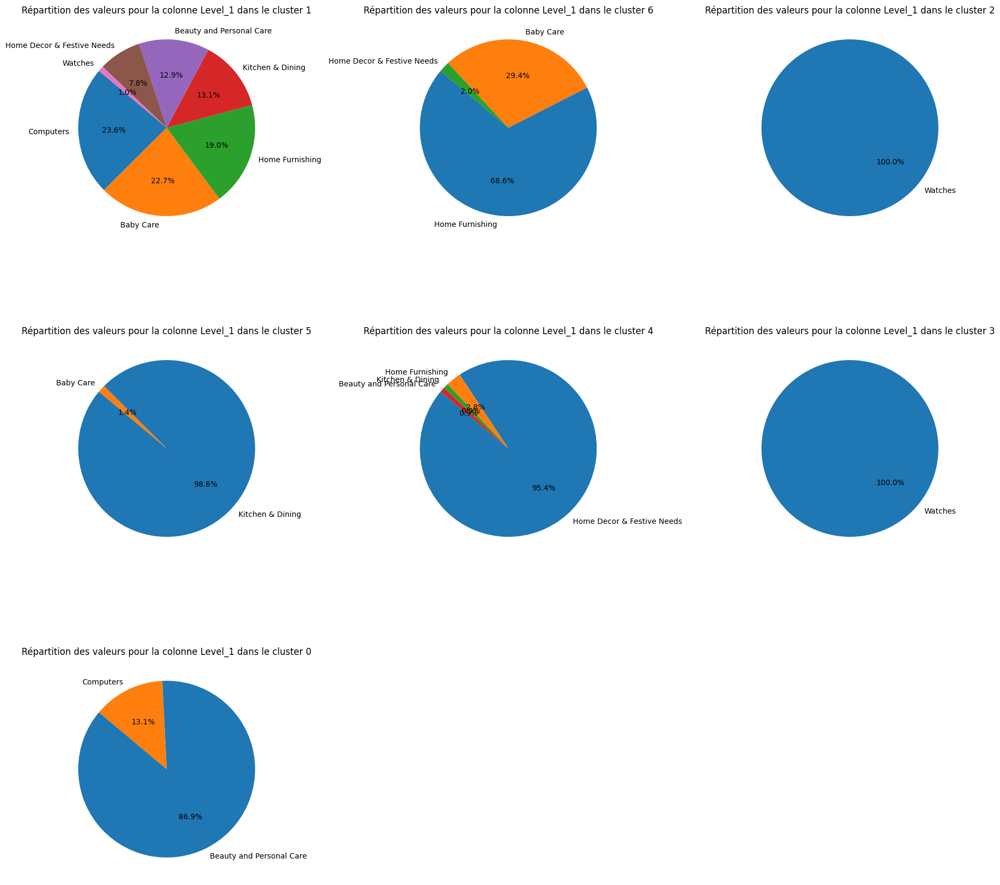

In [61]:
# colonne catégorielle
tfidf_df_product_name['Level_1'] = df_text['Level_1'].copy()

# Obtenir les clusters uniques
clusters = tfidf_df_product_name['cluster'].unique()

# Définir le nombre de colonnes pour les sous-graphes
num_cols = 3

# Calculer le nombre de lignes nécessaires
num_rows = (len(clusters) + num_cols - 1) // num_cols

# Créer les sous-graphes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 6))

# Aplatir les axes pour faciliter l'itération
axes = axes.flatten()

# Tracer un diagramme circulaire pour chaque cluster
for i, cluster in enumerate(clusters):
    cluster_data = tfidf_df_product_name[tfidf_df_product_name['cluster'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    axes[i].pie(level_1_counts, labels=level_1_counts.index, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(f"Répartition des valeurs pour la colonne Level_1 dans le cluster {cluster}")

# Supprimer les axes vides si le nombre de clusters n'est pas un multiple de num_cols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

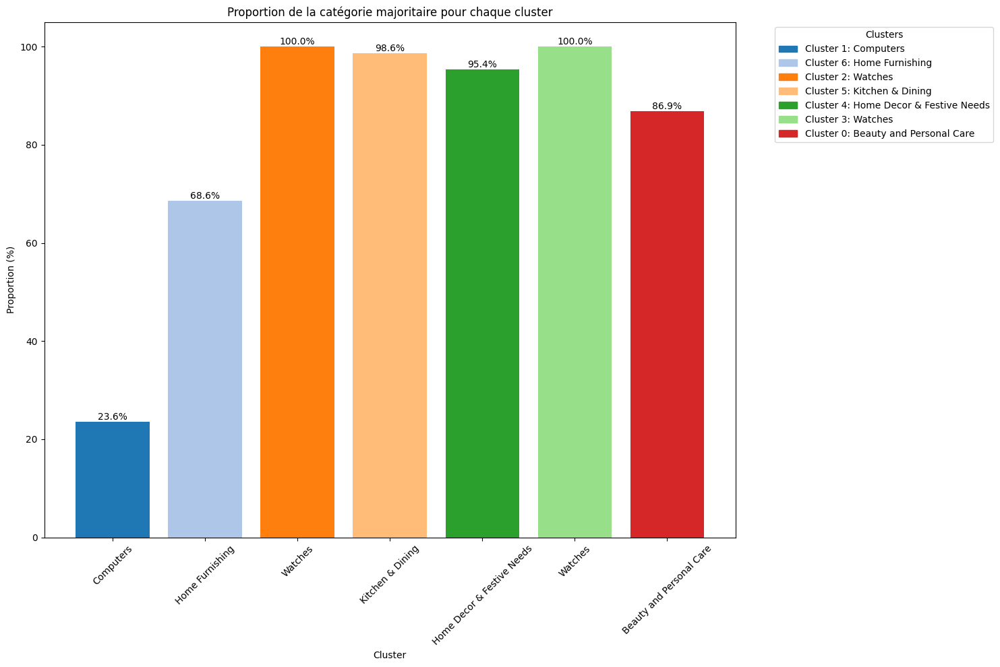

In [59]:
# Obtenir les clusters uniques
clusters = tfidf_df_product_name['cluster'].unique()

# Initialiser une liste pour stocker les informations
top_categories = []

# Extraire la catégorie la plus représentée et sa proportion pour chaque cluster
for cluster in clusters:
    cluster_data = tfidf_df_product_name[tfidf_df_product_name['cluster'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    # Obtenir la catégorie et la valeur la plus représentée
    top_category = level_1_counts.idxmax()
    top_value = level_1_counts.max()
    total_values = level_1_counts.sum()
    proportion = top_value / total_values * 100
    
    # Ajouter les informations à la liste
    top_categories.append({'Cluster': cluster, 'Top Category': top_category, 'Proportion': proportion})

# Convertir la liste en DataFrame
top_categories_df = pd.DataFrame(top_categories)

# Définir une palette de couleurs
colors = plt.cm.tab20.colors  

# Assigner une couleur à chaque cluster
cluster_colors = {cluster: colors[i % len(colors)] for i, cluster in enumerate(clusters)}

# Tracer l'histogramme des proportions
plt.figure(figsize=(15, 10))
bars = plt.bar(top_categories_df['Cluster'].astype(str), top_categories_df['Proportion'], 
               color=[cluster_colors[cluster] for cluster in top_categories_df['Cluster']], tick_label=top_categories_df['Top Category'])

# Ajouter les étiquettes de valeurs
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1f}%', ha='center', va='bottom')

# Ajouter la légende avec des descriptions plus complètes
handles = [plt.Rectangle((0,0),1,1, color=cluster_colors[cluster]) for cluster in clusters]
labels = [f'Cluster {cluster}: {top_categories_df[top_categories_df["Cluster"] == cluster]["Top Category"].values[0]}' for cluster in clusters]
plt.legend(handles, labels, title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Cluster')
plt.ylabel('Proportion (%)')
plt.title('Proportion de la catégorie majoritaire pour chaque cluster')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


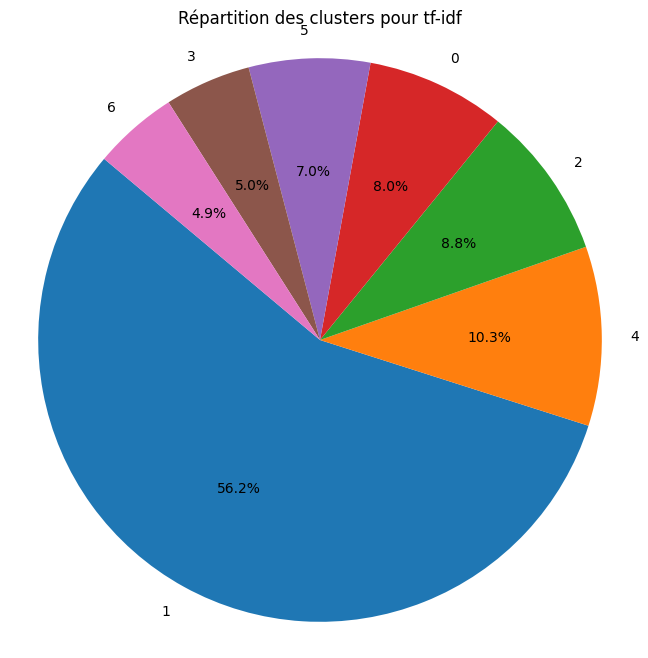

In [62]:
# compter les occurences par chacune des labels du df
cluster_counts = tfidf_df_product_name['cluster'].value_counts()

# créat° du graphique
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Répartition des clusters pour tf-idf')
plt.axis('equal')
plt.show()


#### b. Variable 'description'

In [102]:
# Créer un objet TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer()

# Appliquer le vectorizer à la colonne clean_description du DataFrame
tfidf_matrix = tfidf_vectorizer.fit_transform(df_text['clean_description'])

# Convertir le résultat en DataFrame
tfidf_df_description = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Afficher les 5 premières lignes du DataFrame TF-IDF
tfidf_df_description.head(5)


aa  aaa  aapno  aari  ability  abkl  able  abode  abrasion  absolute  \
0  0.0  0.0    0.0   0.0      0.0   0.0   0.0    0.0       0.0       0.0   
1  0.0  0.0    0.0   0.0      0.0   0.0   0.0    0.0       0.0       0.0   
2  0.0  0.0    0.0   0.0      0.0   0.0   0.0    0.0       0.0       0.0   
3  0.0  0.0    0.0   0.0      0.0   0.0   0.0    0.0       0.0       0.0   
4  0.0  0.0    0.0   0.0      0.0   0.0   0.0    0.0       0.0       0.0   

   absorbency  absorbent  abstract  abstrcts   ac  accent  access  accessory  \
0    0.000000        0.0  0.200009       0.0  0.0     0.0     0.0        0.0   
1    0.000000        0.0  0.000000       0.0  0.0     0.0     0.0        0.0   
2    0.074996        0.0  0.000000       0.0  0.0     0.0     0.0        0.0   
3    0.000000        0.0  0.000000       0.0  0.0     0.0     0.0        0.0   
4    0.000000        0.0  0.000000       0.0  0.0     0.0     0.0        0.0   

   accident  accidental  accommodate  accomplishes  acer  ache  acid  acrylic  \
0       0.0         0.0          0.0           0.0   0.0   0.0   0.0      0.0   
1       0.0         0.0          0.0           0.0   0.0   0.0   0.0      0.0   
2       0.0         0.0          0.0           0.0   0.0   0.0   0.0      0.0   
3       0.0         0.0          0.0           0.0   0.0   0.0   0.0      0.0   
4       0.0         0.0          0.0           0.0   0.0   0.0   0.0      0.0   

   act  active  actual  adapter  adaptor  add  addiction  addition  \
0  0.0     0.0     0.0      0.0      0.0  0.0        0.0       0.0   
1  0.0     0.0     0.0      0.0      0.0  0.0        0.0       0.0   
2  0.0     0.0     0.0      0.0      0.0  0.0        0.0       0.0   
3  0.0     0.0     0.0      0.0      0.0  0.0        0.0       0.0   
4  0.0     0.0     0.0      0.0      0.0  0.0        0.0       0.0   

   additional  adhesive  adi  adidas  adjustable  adjusts  admiration  \
0         0.0       0.0  0.0     0.0         0.0      0.0         0.0   
1         0.0       0.0  0.0     0.0         0.0      0.0         0.0   
2         0.0       0.0  0.0     0.0         0.0      0.0         0.0   
3         0.0       0.0  0.0     0.0         0.0      0.0         0.0   
4         0.0       0.0  0.0     0.0         0.0      0.0         0.0   

   admired  adorable  adorn  adsl  advance  advice  advisable  aero  affect  \
0      0.0       0.0    0.0   0.0      0.0     0.0        0.0   0.0     0.0   
1      0.0       0.0    0.0   0.0      0.0     0.0        0.0   0.0     0.0   
2      0.0       0.0    0.0   0.0      0.0     0.0        0.0   0.0     0.0   
3      0.0       0.0    0.0   0.0      0.0     0.0        0.0   0.0     0.0   
4      0.0       0.0    0.0   0.0      0.0     0.0        0.0   0.0     0.0   

   affordable  afternoon  agarwood  age  ageless  agrasen  agromech  aid  air  \
0         0.0        0.0       0.0  0.0      0.0      0.0       0.0  0.0  0.0   
1         0.0        0.0       0.0  0.0      0.0      0.0       0.0  0.0  0.0   
2         0.0        0.0       0.0  0.0      0.0      0.0       0.0  0.0  0.0   
3         0.0        0.0       0.0  0.0      0.0      0.0       0.0  0.0  0.0   
4         0.0        0.0       0.0  0.0      0.0      0.0       0.0  0.0  0.0   

   airport  airtel  airtex  ajmal  akshaj  akup  alarm  alcohol  aleo  alfajr  \
0      0.0     0.0     0.0    0.0     0.0   0.0    0.0      0.0   0.0     0.0   
1      0.0     0.0     0.0    0.0     0.0   0.0    0.0      0.0   0.0     0.0   
2      0.0     0.0     0.0    0.0     0.0   0.0    0.0      0.0   0.0     0.0   
3      0.0     0.0     0.0    0.0     0.0   0.0    0.0      0.0   0.0     0.0   
4      0.0     0.0     0.0    0.0     0.0   0.0    0.0      0.0   0.0     0.0   

   alive  allin  allows  alloy  alluminium  alluring  ally  almond  aloe  \
0    0.0    0.0     0.0    0.0         0.0       0.0   0.0     0.0   0.0   
1    0.0    0.0     0.0    0.0         0.0       0.0   0.0     0.0   0.0   
2    0.0    0.0     0.0    0.0         0.0

In [103]:
# Somme des valeurs TF-IDF pour chaque terme
term_importance_description = tfidf_df_description.sum().sort_values(ascending=False)

# Afficher les termes les plus importants
print(term_importance_description.head(15))

flipkart       61.174103
com            58.059825
product        53.230091
genuine        52.841326
cash           52.841326
delivery       52.768051
free           52.203350
day            45.526886
replacement    45.327487
guarantee      44.793181
shipping       39.849169
watch          35.349430
cm             34.045632
analog         32.215787
online         31.955591
dtype: float64


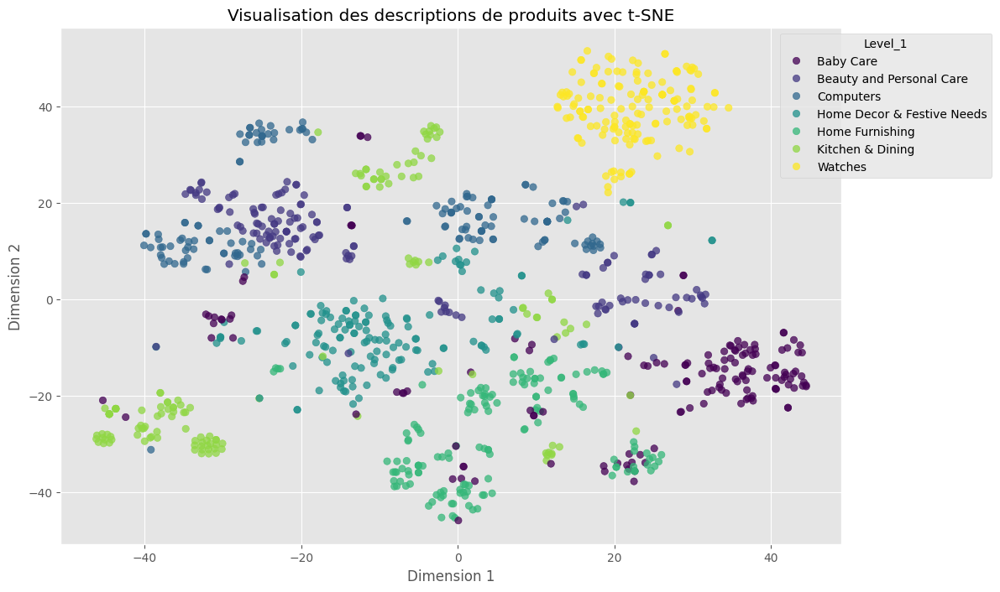

In [106]:
# Appliquer t-SNE pour réduire la dimensionnalité à 2D
tsne_model = TSNE(n_components=2, random_state=42)
tsne_matrix = tsne_model.fit_transform(tfidf_df_description)

# Créer un DataFrame avec les résultats t-SNE
tsne_df = pd.DataFrame(tsne_matrix, columns=['x', 'y'])

# Ajouter la variable Level_1 au DataFrame t-SNE
tsne_df['Level_1'] = df_text['Level_1']

# Encoder la variable catégorielle Level_1 en numérique
label_encoder = LabelEncoder()
tsne_df['Level_1_encoded'] = label_encoder.fit_transform(tsne_df['Level_1'])

# Visualiser les mots dans l'espace t-SNE
plt.figure(figsize=(12, 8))

# Utiliser un jeu de couleurs en fonction de la variable Level_1 encodée
scatter = plt.scatter(tsne_df['x'], tsne_df['y'], c=tsne_df['Level_1_encoded'], cmap='viridis', alpha=0.75)

# Créer la légende avec les noms des catégories
handles, _ = scatter.legend_elements()
labels = label_encoder.inverse_transform(range(len(handles)))
legend = plt.legend(handles, labels, title="Level_1", loc="upper right", bbox_to_anchor=(1.2, 1))

plt.title('Visualisation des descriptions de produits avec t-SNE')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()


In [104]:
# Convertir les vecteurs en une liste pour l'application de LSA
X = tfidf_df_description.values

# Appliquer la réduction de dimension avec LSA (TruncatedSVD)
n_components = 7
lsa = TruncatedSVD(n_components=n_components, random_state=42)
X_reduced = lsa.fit_transform(X)

# Définir le nombre d'itérations et la méthode d'initialisation pour K-means
n_iter = 1000
init_method = 'k-means++'

# Appliquer K-means avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42, max_iter=n_iter, init=init_method)
tfidf_df_product_name['cluster'] = kmeans.fit_predict(X_reduced)

In [105]:
# X contient les vecteurs BERT
X = tfidf_df_description.values
labels = df_text['Level_1'].values

evaluations = []
evaluations_std = []

def fit_and_evaluate(km, X, labels, name=None, n_runs=5):
    name = km.__class__.__name__ if name is None else name

    train_times = []
    scores = defaultdict(list)
    for seed in range(n_runs):
        km.set_params(random_state=seed)
        t0 = time()
        km.fit(X)
        train_times.append(time() - t0)
        scores["Homogeneity"].append(metrics.homogeneity_score(labels, km.labels_))
        scores["Completeness"].append(metrics.completeness_score(labels, km.labels_))
        scores["V-measure"].append(metrics.v_measure_score(labels, km.labels_))
        scores["Adjusted Rand-Index"].append(
            metrics.adjusted_rand_score(labels, km.labels_)
        )
        scores["Silhouette Coefficient"].append(
            metrics.silhouette_score(X, km.labels_, sample_size=2000)
        )
    train_times = np.asarray(train_times)

    print(f"Clustering done in {train_times.mean():.2f} ± {train_times.std():.2f} s ")
    evaluation = {
        "estimator": name,
        "train_time": train_times.mean(),
    }
    evaluation_std = {
        "estimator": name,
        "train_time": train_times.std(),
    }
    for score_name, score_values in scores.items():
        mean_score, std_score = np.mean(score_values), np.std(score_values)
        print(f"{score_name}: {mean_score:.3f} ± {std_score:.3f}")
        evaluation[score_name] = mean_score
        evaluation_std[score_name] = std_score
    evaluations.append(evaluation)
    evaluations_std.append(evaluation_std)

# Initialisation de K-means avec k=7
km = KMeans(n_clusters=7, random_state=42)

# Application de la fonction d'évaluation
fit_and_evaluate(km, X, labels)


Clustering done in 0.19 ± 0.02 s 
Homogeneity: 0.419 ± 0.070
Completeness: 0.500 ± 0.071
V-measure: 0.455 ± 0.069
Adjusted Rand-Index: 0.233 ± 0.048
Silhouette Coefficient: 0.056 ± 0.007


#### c. Variable 'clean_corpus'

In [42]:
# Créer un objet TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer()

# Appliquer le vectorizer à la colonne clean_description du DataFrame
tfidf_matrix = tfidf_vectorizer.fit_transform(df_text['clean_corpus'])

# Convertir le résultat en DataFrame
tfidf_df_clean_corpus = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Afficher les 5 premières lignes du DataFrame TF-IDF
tfidf_df_clean_corpus.head(5)


,aa,aaa,aapno,aari,aarika,ability,abklgrngrngrn,abklplplpnk,abklplpnkpnk,able,...,zinc,zingalalaa,zip,zipexterior,zipper,zippered,zone,zoom,zora,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [43]:
# Somme des valeurs TF-IDF pour chaque terme
term_importance_description = tfidf_df_clean_corpus.sum().sort_values(ascending=False)

# Afficher les termes les plus importants
print(term_importance_description.head(15))

watch          43.742019
analog         37.210609
com            36.464448
flipkart       36.328916
product        33.037918
genuine        31.695968
shipping       31.695968
cash           31.695968
delivery       31.660417
free           31.633777
buy            31.528538
cm             30.252715
day            29.226835
replacement    29.179753
mug            29.163998
dtype: float64


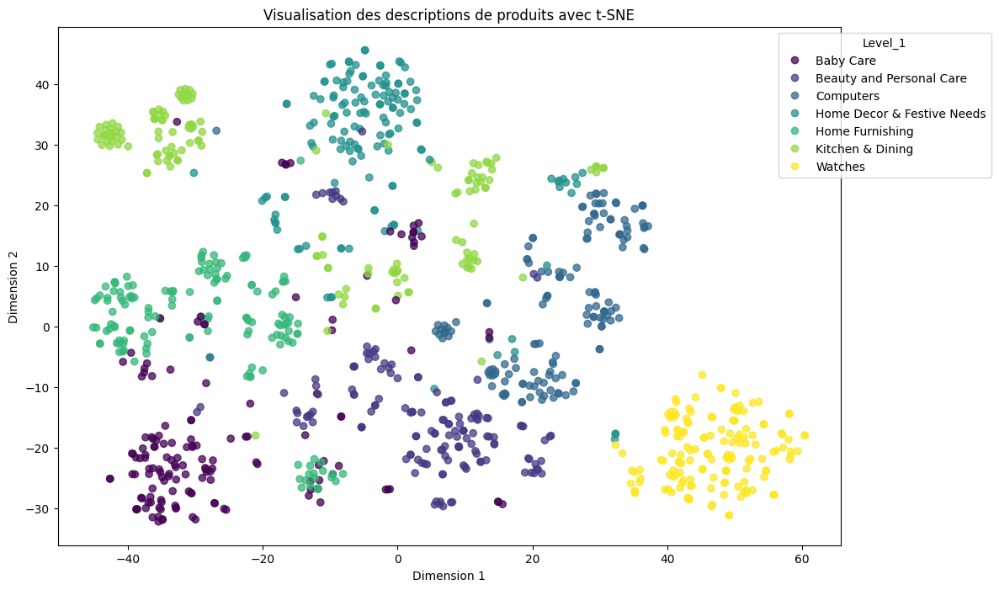

In [44]:
# Appliquer t-SNE pour réduire la dimensionnalité à 2D
tsne_model = TSNE(n_components=2, random_state=42)
tsne_matrix = tsne_model.fit_transform(tfidf_df_clean_corpus)

# Créer un DataFrame avec les résultats t-SNE
tsne_df = pd.DataFrame(tsne_matrix, columns=['x', 'y'])

# Ajouter la variable Level_1 au DataFrame t-SNE
tsne_df['Level_1'] = df_text['Level_1']

# Encoder la variable catégorielle Level_1 en numérique
label_encoder = LabelEncoder()
tsne_df['Level_1_encoded'] = label_encoder.fit_transform(tsne_df['Level_1'])

# Visualiser les mots dans l'espace t-SNE
plt.figure(figsize=(12, 8))

# Utiliser un jeu de couleurs en fonction de la variable Level_1 encodée
scatter = plt.scatter(tsne_df['x'], tsne_df['y'], c=tsne_df['Level_1_encoded'], cmap='viridis', alpha=0.75)

# Créer la légende avec les noms des catégories
handles, _ = scatter.legend_elements()
labels = label_encoder.inverse_transform(range(len(handles)))
legend = plt.legend(handles, labels, title="Level_1", loc="upper right", bbox_to_anchor=(1.2, 1))

plt.title('Visualisation des descriptions de produits avec t-SNE')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()


## C. Analyse textuelle approche word / sentence embeddings / modélisation non-supervisée (K-means)

Dans cette partie nous allons utiliser d'autres approches en analyse textuelle avec python. Les voici : 
- Word2Vec : qui capture les significations sémantiques des mots en plaçant des mots similaires dans des espaces vectoriels proches
- BERT : est un modèle de langage développé par Google qui permet de comprendre le contexte de chaque mot dans une phrase en considérant les mots qui le précèdent et le suivent simultanément
- USE : est un modèle de langage développé par Google qui encode des phrases en vecteurs de haute dimension, capturant ainsi les significations sémantiques pour améliorer les performances des tâches de traitement du langage naturel comme la classification de texte et la similarité sémantique

### 1. Utilisation de Word2Vec

In [32]:
df_w2v = pd.read_csv('df_nlp.csv')

Nous allons faire une première modélisation avec en utilisant Word2vec pour encoder notre corpus de texte, nettoyé au préalable, puis nous allons utiliser le k-means pour partitionner nos données. L'objectif est de voir si nous retrouvons nos catégories "vraies", en utilisant le corpus qui est la résultante de la concaténation "nom produit + description"

Voici la démarche qui sera opérée par étape : 
- Instancier et appliquer le wor2vec sur la colonne pré-traitée de texte : 'clean_corpus', vectorisation du corpus
- Faire une segmentaion avec le k-means (k=7 ; pour le nombre de catégories réelles)
- Utiliser une GridSearchValue pour rechercher les meilleurs hyperparamètres selon deux métriques : ARIScore & Coefficient de silhouette
- Utiliser PCA & TSNE pour faire des projections 2D
- Analyser la concordance entre clusters / true catégories

#### a. Application de Word2Vec

In [33]:
# Transformer chaque phrase en une liste de mots
df_w2v['clean_corpus'] = df_w2v['clean_corpus'].apply(lambda x: x.split())

# Entraîner Word2Vec
model = Word2Vec(sentences=df_w2v['clean_corpus'], vector_size=150, window=7, min_count=2, workers=4)

# Obtenir les vecteurs pour chaque description de produit
def get_vector(text, model):
    vector = sum(model.wv[word] for word in text if word in model.wv)
    return vector / len(text)

df_w2v['vector'] = df_w2v['clean_corpus'].apply(lambda x: get_vector(x, model))

#### b. Application du k-means

In [34]:
# Convertir les vecteurs en une liste pour l'application de LSA
X = list(df_w2v['vector'].values)

# Si nécessaire, convertir en une matrice numpy
import numpy as np
X = np.array(X)

# Appliquer la réduction de dimension avec LSA (TruncatedSVD)
n_components = 7
lsa = TruncatedSVD(n_components=n_components, random_state=42)
X_reduced = lsa.fit_transform(X)

# Définir le nombre d'itérations et la méthode d'initialisation pour K-means
n_iter = 1000
init_method = 'k-means++'

# Appliquer K-means avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42, max_iter=n_iter, init=init_method)
df_w2v['cluster'] = kmeans.fit_predict(X_reduced)

# Utiliser les clusters comme labels
labels = df_w2v['cluster'].values

#### c. Calcul des métriques

In [36]:
# X contient les vecteurs de Word2Vec
X = list(df_w2v['vector'].values)
labels = df_w2v['Level_1'].values

evaluations = []
evaluations_std = []

def fit_and_evaluate(km, X, labels, name=None, n_runs=5):
    name = km.__class__.__name__ if name is None else name

    train_times = []
    scores = defaultdict(list)
    for seed in range(n_runs):
        km.set_params(random_state=seed)
        t0 = time()
        km.fit(X)
        train_times.append(time() - t0)
        scores["Homogeneity"].append(metrics.homogeneity_score(labels, km.labels_))
        scores["Completeness"].append(metrics.completeness_score(labels, km.labels_))
        scores["V-measure"].append(metrics.v_measure_score(labels, km.labels_))
        scores["Adjusted Rand-Index"].append(
            metrics.adjusted_rand_score(labels, km.labels_)
        )
        scores["Silhouette Coefficient"].append(
            metrics.silhouette_score(X, km.labels_, sample_size=2000)
        )
    train_times = np.asarray(train_times)

    print(f"Clustering done in {train_times.mean():.2f} ± {train_times.std():.2f} s ")
    evaluation = {
        "estimator": name,
        "train_time": train_times.mean(),
    }
    evaluation_std = {
        "estimator": name,
        "train_time": train_times.std(),
    }
    for score_name, score_values in scores.items():
        mean_score, std_score = np.mean(score_values), np.std(score_values)
        print(f"{score_name}: {mean_score:.3f} ± {std_score:.3f}")
        evaluation[score_name] = mean_score
        evaluation_std[score_name] = std_score
    evaluations.append(evaluation)
    evaluations_std.append(evaluation_std)

# Initialisation de K-means avec k=7
km = KMeans(n_clusters=7, random_state=42)

# Application de la fonction d'évaluation
fit_and_evaluate(km, X_reduced, labels)


Clustering done in 0.02 ± 0.00 s 
Homogeneity: 0.308 ± 0.013
Completeness: 0.331 ± 0.018
V-measure: 0.319 ± 0.014
Adjusted Rand-Index: 0.181 ± 0.028
Silhouette Coefficient: 0.396 ± 0.025


#### d. Optimisation des hyperparamètres avec une GridSearchCV

In [37]:
# Fonction pour obtenir le vecteur moyen d'une phrase à partir du modèle Word2Vec
def get_vector(sentence, model):
    return np.mean([model.wv[word] for word in sentence if word in model.wv], axis=0)

# Fonction pour évaluer KMeans en utilisant uniquement l'ARI score
def evaluate_kmeans(X, km_param, df, n_clusters=7):
    kmeans = KMeans(n_clusters=n_clusters, **km_param)
    kmeans.fit(X)
    labels = kmeans.labels_
    
    le = LabelEncoder()
    df['encoded_Level_1'] = le.fit_transform(df['Level_1'])
    ari_score = adjusted_rand_score(df['encoded_Level_1'], labels)
    
    return (ari_score, km_param, labels)

# Fonction pour effectuer une recherche par grille sur les paramètres de Word2Vec et KMeans
def grid_search_word2vec_kmeans(df, word2vec_params, kmeans_params, n_clusters=7, n_jobs=-1):
    meilleur_ari = -np.inf
    meilleur_w2v_param = None
    meilleur_km_param = None
    meilleures_labels = None

    # Boucle sur chaque combinaison de paramètres Word2Vec
    for w2v_param in ParameterGrid(word2vec_params):
        # Entraîner le modèle Word2Vec
        model = Word2Vec(sentences=df['clean_corpus'], **w2v_param)
        
        # Obtenir les vecteurs pour chaque description de produit
        df['vector'] = df['clean_corpus'].apply(lambda x: get_vector(x, model))
        X = np.array(list(df['vector'].values))
        
        # Évaluation parallèle des paramètres de KMeans
        results = Parallel(n_jobs=n_jobs)(
            delayed(evaluate_kmeans)(X, km_param, df, n_clusters)
            for km_param in ParameterGrid(kmeans_params)
        )
        
        # Sélectionner les meilleurs paramètres en fonction de l'ARI score
        for ari_score, km_param, labels in results:
            if ari_score > meilleur_ari:
                meilleur_ari = ari_score
                meilleur_w2v_param = w2v_param
                meilleur_km_param = km_param
                meilleures_labels = labels
    
    meilleurs_params = {'word2vec': meilleur_w2v_param, 'kmeans': meilleur_km_param}
    return meilleurs_params, meilleur_ari, meilleures_labels

# Définir une grille de paramètres réduite pour Word2Vec et KMeans
word2vec_params = {
    'vector_size': [100, 150],
    'window': [3, 5],
    'min_count': [1],
    'workers': [4],
    'sg': [0, 1],
    'hs': [0],
    'negative': [5]
}

kmeans_params = {
    'init': ['k-means++'],
    'n_init': [10],
    'max_iter': [300]
}

# Effectuer la recherche par grille
meilleurs_params, meilleur_ari, meilleures_labels = grid_search_word2vec_kmeans(df_w2v, word2vec_params, kmeans_params, n_clusters=7, n_jobs=-1)

# Ajouter les nouvelles étiquettes au DataFrame
df_w2v['kmeans_labels'] = meilleures_labels

print(f"Meilleurs paramètres: {meilleurs_params}")
print(f"Meilleur ARI Score: {meilleur_ari}")

Meilleurs paramètres: {'word2vec': {'hs': 0, 'min_count': 1, 'negative': 5, 'sg': 1, 'vector_size': 150, 'window': 5, 'workers': 4}, 'kmeans': {'init': 'k-means++', 'max_iter': 300, 'n_init': 10}}
Meilleur ARI Score: 0.2889330754513297


#### e. Matrice de confusion / Hungarian Algorithm

Étiquettes encodées et étiquettes de clusters:
            Level_1  encoded_Level_1  kmeans_labels
0   Home Furnishing                4              4
1         Baby Care                0              4
2         Baby Care                0              1
3   Home Furnishing                4              4
4   Home Furnishing                4              4
5           Watches                6              5
6           Watches                6              5
7           Watches                6              1
8           Watches                6              5
9           Watches                6              5
10          Watches                6              1
11          Watches                6              5
12          Watches                6              5
13          Watches                6              5
14          Watches                6              5
15          Watches                6              1
16          Watches                6              5
17          Watch

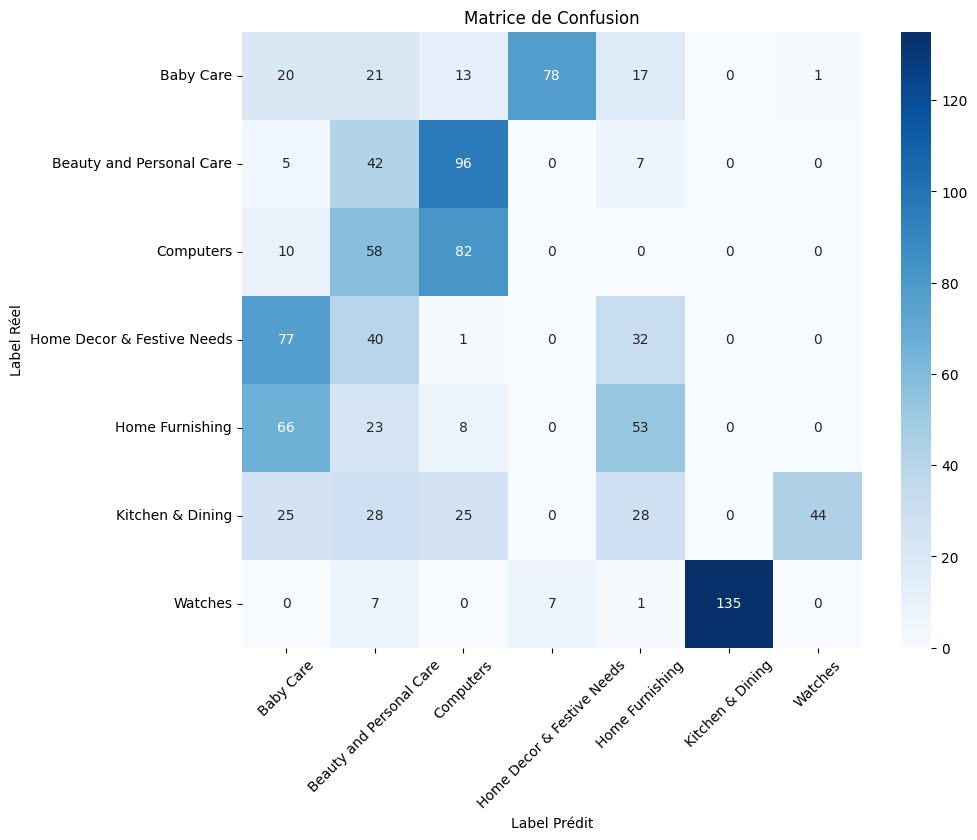

In [160]:
# Encoder les étiquettes originales
label_encoder = LabelEncoder()
df_w2v['encoded_Level_1'] = label_encoder.fit_transform(df_w2v['Level_1'])

# Afficher les étiquettes encodées et les étiquettes de clusters pour vérification
print("Étiquettes encodées et étiquettes de clusters:")
print(df_w2v[['Level_1', 'encoded_Level_1', 'kmeans_labels']].head(20))

# Vérifier l'alignement des étiquettes encodées et des étiquettes de clusters
unique_labels = df_w2v['encoded_Level_1'].unique()
unique_clusters = df_w2v['kmeans_labels'].unique()

print("Étiquettes encodées uniques :", unique_labels)
print("Clusters uniques :", unique_clusters)

# Créer la matrice de confusion
conf_matrix = confusion_matrix(df_w2v['encoded_Level_1'], df_w2v['kmeans_labels'])

# Afficher la matrice de confusion avec les noms des étiquettes originales
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Matrice de Confusion')
plt.xlabel('Label Prédit')
plt.ylabel('Label Réel')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


#### f. Correspondance entre catégories / labels

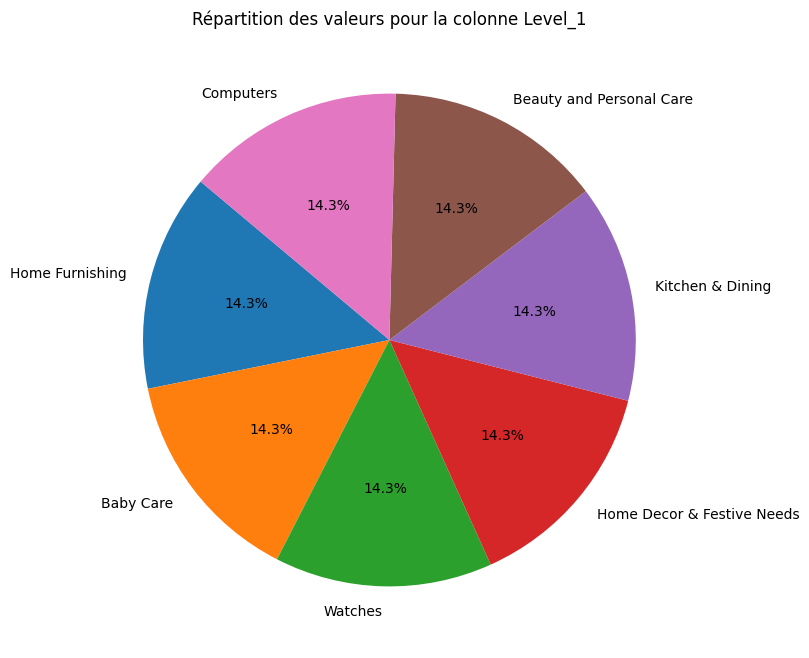

In [149]:
# Compter les occurrences de chaque valeur dans la colonne 'Level_1'
level_1_counts = df_w2v['Level_1'].value_counts()

# Tracer le diagramme circulaire
plt.figure(figsize=(8, 8))
plt.pie(level_1_counts, labels=level_1_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Répartition des valeurs pour la colonne Level_1')
plt.show()

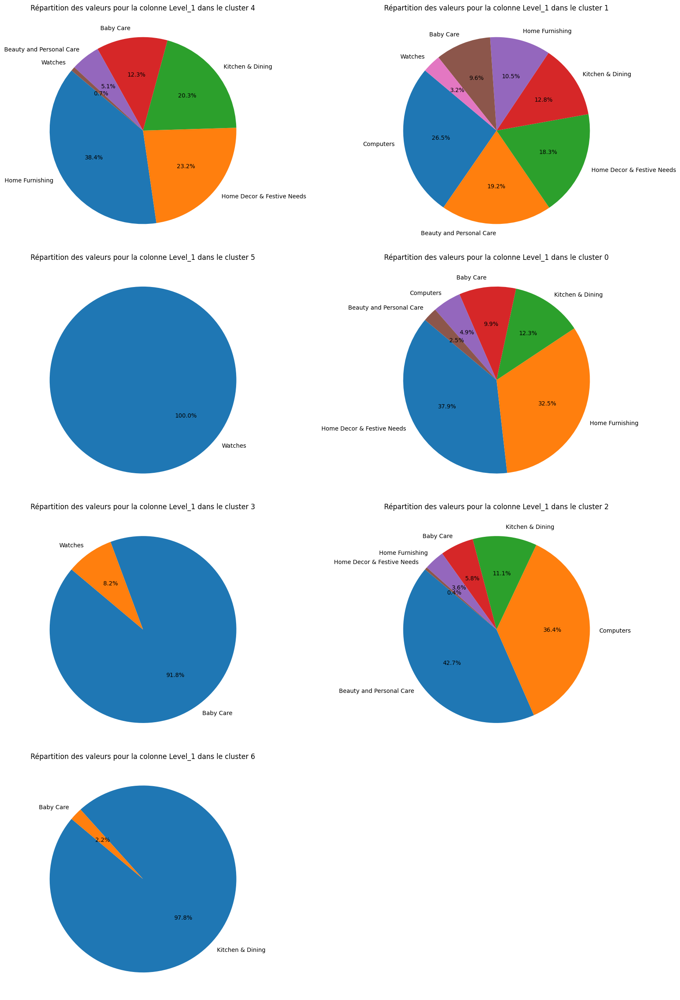

In [151]:
# Obtenir les clusters uniques
clusters = df_w2v['kmeans_labels'].unique()

# Définir le nombre de colonnes pour les sous-graphes
num_cols = 2

# Calculer le nombre de lignes nécessaires
num_rows = (len(clusters) + num_cols - 1) // num_cols

# Créer les sous-graphes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 6))

# Aplatir les axes pour faciliter l'itération
axes = axes.flatten()

# Tracer un diagramme circulaire pour chaque cluster
for i, cluster in enumerate(clusters):
    cluster_data = df_w2v[df_w2v['kmeans_labels'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    axes[i].pie(level_1_counts, labels=level_1_counts.index, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(f"Répartition des valeurs pour la colonne Level_1 dans le cluster {cluster}")

# Supprimer les axes vides si le nombre de clusters n'est pas un multiple de num_cols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

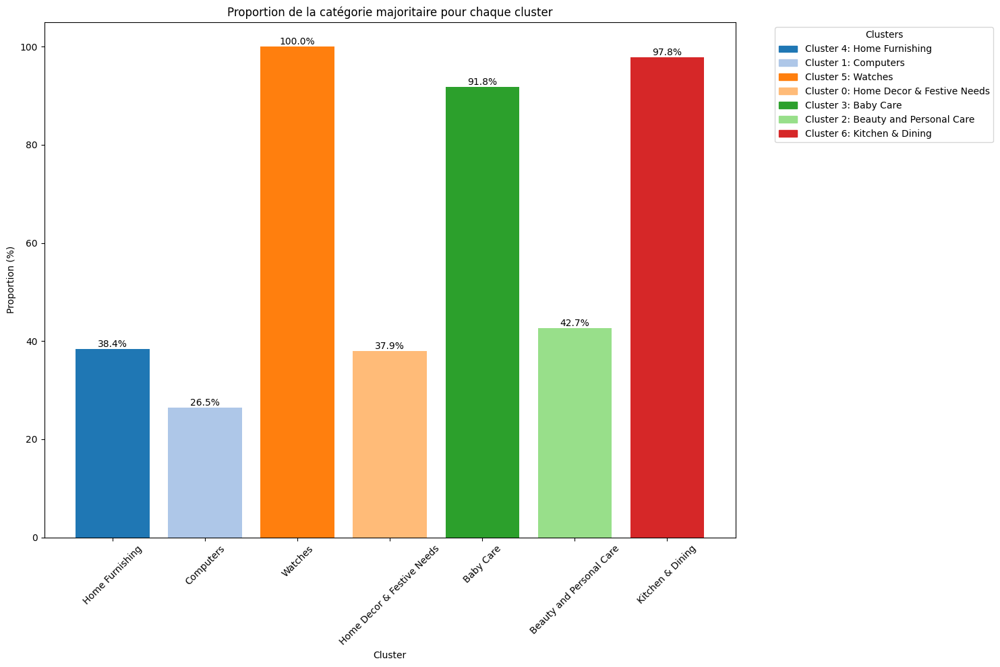

In [152]:
# Obtenir les clusters uniques
clusters = df_w2v['kmeans_labels'].unique()

# Initialiser une liste pour stocker les informations
top_categories = []

# Extraire la catégorie la plus représentée et sa proportion pour chaque cluster
for cluster in clusters:
    cluster_data = df_w2v[df_w2v['kmeans_labels'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    # Obtenir la catégorie et la valeur la plus représentée
    top_category = level_1_counts.idxmax()
    top_value = level_1_counts.max()
    total_values = level_1_counts.sum()
    proportion = top_value / total_values * 100
    
    # Ajouter les informations à la liste
    top_categories.append({'Cluster': cluster, 'Top Category': top_category, 'Proportion': proportion})

# Convertir la liste en DataFrame
top_categories_df = pd.DataFrame(top_categories)

# Définir une palette de couleurs
colors = plt.cm.tab20.colors  

# Assigner une couleur à chaque cluster
cluster_colors = {cluster: colors[i % len(colors)] for i, cluster in enumerate(clusters)}

# Tracer l'histogramme des proportions
plt.figure(figsize=(15, 10))
bars = plt.bar(top_categories_df['Cluster'].astype(str), top_categories_df['Proportion'], 
               color=[cluster_colors[cluster] for cluster in top_categories_df['Cluster']], tick_label=top_categories_df['Top Category'])

# Ajouter les étiquettes de valeurs
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1f}%', ha='center', va='bottom')

# Ajouter la légende avec des descriptions plus complètes
handles = [plt.Rectangle((0,0),1,1, color=cluster_colors[cluster]) for cluster in clusters]
labels = [f'Cluster {cluster}: {top_categories_df[top_categories_df["Cluster"] == cluster]["Top Category"].values[0]}' for cluster in clusters]
plt.legend(handles, labels, title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Cluster')
plt.ylabel('Proportion (%)')
plt.title('Proportion de la catégorie majoritaire pour chaque cluster')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### g. Projection en 2D avec PCA & TSNE

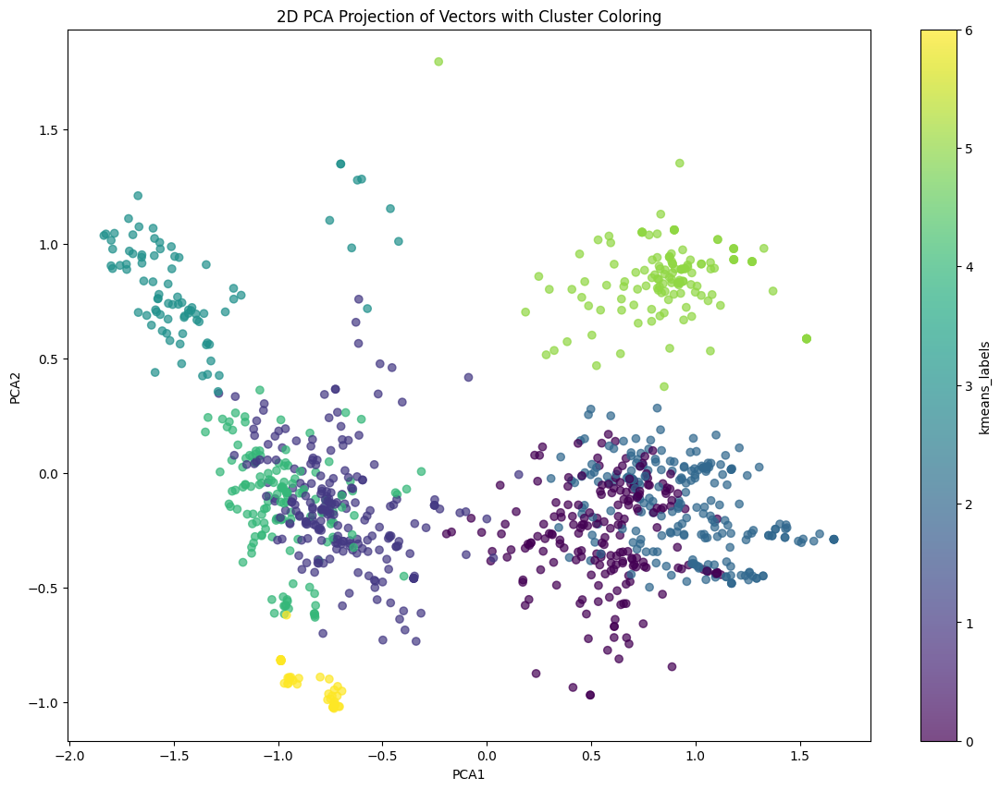

In [155]:
# Utilisation de PCA pour la réduction des données en 2 dimensions
vectors = np.stack(df_w2v['vector'].values)
pca = PCA(n_components=2)
reduced_vectors = pca.fit_transform(vectors)

# zjouter les composantes au dataframe df_w2v
df_w2v['PCA1'] = reduced_vectors[:, 0]
df_w2v['PCA2'] = reduced_vectors[:, 1]

# création du graphique
plt.figure(figsize=(14, 10))
scatter = plt.scatter(df_w2v['PCA1'], df_w2v['PCA2'], c=df_w2v['kmeans_labels'], cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='kmeans_labels')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('2D PCA Projection of Vectors with Cluster Coloring')
plt.show()

C:\Users\justi\.conda\envs\env_projetno6_marketplace\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


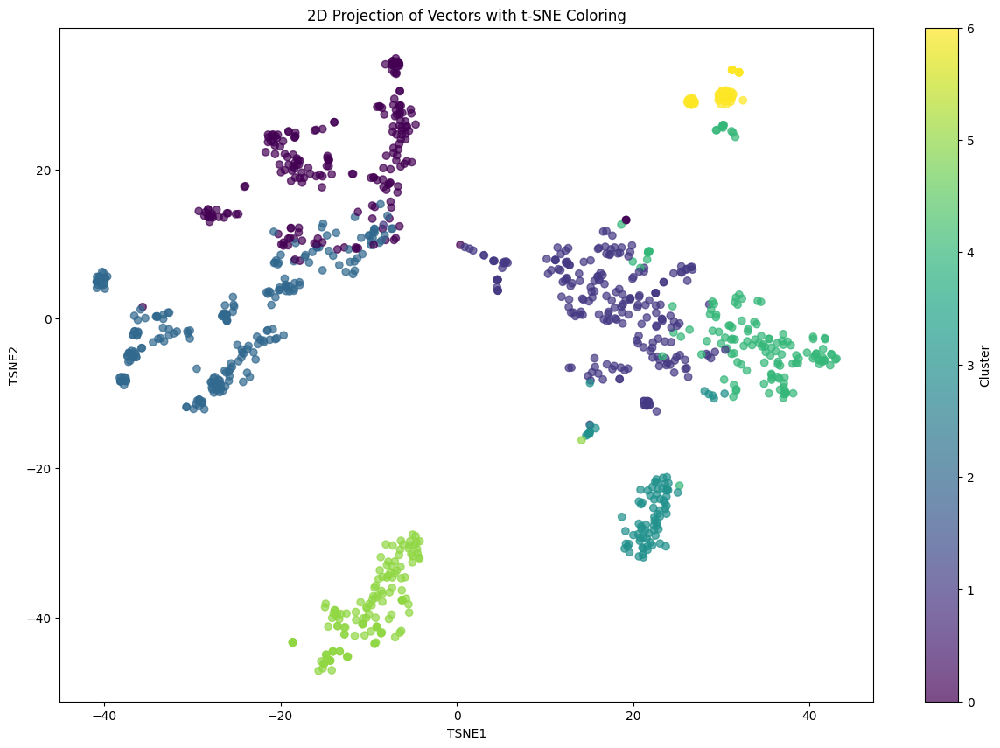

In [156]:
# Réduction en 2D avec TSNE
tsne = TSNE(n_components=2, random_state=42, init='pca', learning_rate='auto', n_iter=1000, perplexity=30)
reduced_tsne_vectors = tsne.fit_transform(X_reduced)

# Ajouter les deux dimnesions créées au dataframe 
df_w2v['TSNE1'] = reduced_tsne_vectors[:, 0]
df_w2v['TSNE2'] = reduced_tsne_vectors[:, 1]

# Graphique
plt.figure(figsize=(15, 10))
scatter = plt.scatter(df_w2v['TSNE1'], df_w2v['TSNE2'], c=df_w2v['kmeans_labels'], cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.xlabel('TSNE1')
plt.ylabel('TSNE2')
plt.title('2D Projection of Vectors with t-SNE Coloring')
plt.show()

### 2. Utilisation de BERT

In [36]:
df_bert = pd.read_csv('df_nlp.csv')

In [37]:
# Définir l'option pour afficher la totalité du contenu des colonnes
pd.set_option('display.max_colwidth', None)
df_bert

,product_name,clean_corpus,clean_description,clean_product_name,Level_1
0,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,elegance polyester multicolor abstract eyelet door curtain key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interior curtain made high quality polyester fabric feature eyelet style stitch metal ring make room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,key feature polyester multicolor abstract eyelet door floral curtain elegance polyester multicolor abstract eyelet door curtain cm pack price r curtain enhances interior high quality polyester fabric feature style stitch metal room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain draw first thing morning welcome bright sun ray wish good morning whole world draw close evening create special moment joyous beauty print home elegant curtain filter room right amount specification elegance polyester multicolor abstract eyelet door curtain cm general brand elegance door type eyelet model name abstract polyester door curtain model id color multicolor dimension cm box number content sale pack sale package body design material polyester,elegance polyester multicolor abstract eyelet door curtain,Home Furnishing
1,Sathiyas Cotton Bath Towel,sathiyas cotton bath towel specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,specification cotton bath towel bath towel yellow blue bath towel feature machine washable material cotton design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl id color yellow blue size mediam dimension inch width inch box number content sale package sale bath towel,sathiyas cotton bath towel,Baby Care
2,Eurospa Cotton Terry Face Towel Set,eurospa cotton terry face towel set key feature eurospa cotton terry face towel set size small height inch gsm eurospa cotton terry face towel set piece face towel set assorted price r eurospa brings exclusively designed soft cotton towel export quality product soft texture take care skin give enriched feeling deserve eurospa exporting bath towel lot renowned brand last year famous fine print absorbency softness durability note product cotton susceptible shrinkage product color may vary picture size may vary wash care wash cold water iron bleach flat dry wash first use size face towel cm cm specification eurospa cotton terry face towel set piece face towel set assorted bath towel feature material cotton terry design shuvam general brand eurospa gsm type face towel set model name ideal boy girl men woman model id size small color assorted dimension weight length inch width inch box number content sale package sale package piece face towel s

#### a. Vectorisation du corpus avec BERT

In [38]:
# Charger le modèle et le tokenizer BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Pondération des colonnes
NAME_WEIGHT = 4
DESC_WEIGHT = 1

# Fonction pour obtenir les embeddings BERT avec pondération
def get_weighted_bert_embeddings(clean_product_name, clean_description, name_weight=NAME_WEIGHT, desc_weight=DESC_WEIGHT):
    # Répéter le product_name selon son poids et le clean_description selon son poids
    weighted_text = (clean_product_name + ' ') * name_weight + (clean_description + ' ') * desc_weight
    
    # Tokenizer le texte pondéré
    inputs = tokenizer(weighted_text, return_tensors='pt', truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    # Utiliser les embeddings du [CLS] token
    embeddings = outputs.last_hidden_state[:, 0, :].squeeze().numpy()
    return embeddings

# Appliquer la fonction à chaque ligne en combinant les colonnes 'product_name' et 'clean_description'
df_bert['bert_embeddings'] = df_bert.apply(
    lambda row: get_weighted_bert_embeddings(row['clean_product_name'], row['clean_description']), axis=1
)

# Afficher les résultats
df_bert.head(3)

,product_name,clean_corpus,clean_description,clean_product_name,Level_1,bert_embeddings
0,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,elegance polyester multicolor abstract eyelet door curtain key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain cm height pack price r curtain enhances look interior curtain made high quality polyester fabric feature eyelet style stitch metal ring make room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room get right amount sunlight specification elegance polyester multicolor abstract eyelet door curtain cm height pack general brand elegance designed door type eyelet model name abstract polyester door curtain set model id color multicolor dimension length cm box number content sale package pack sale package curtain body design material polyester,key feature polyester multicolor abstract eyelet door floral curtain elegance polyester multicolor abstract eyelet door curtain cm pack price r curtain enhances interior high quality polyester fabric feature style stitch metal room environment romantic loving curtain ant wrinkle anti shrinkage elegant apparance home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain draw first thing morning welcome bright sun ray wish good morning whole world draw close evening create special moment joyous beauty print home elegant curtain filter room right amount specification elegance polyester multicolor abstract eyelet door curtain cm general brand elegance door type eyelet model name abstract polyester door curtain model id color multicolor dimension cm box number content sale pack sale package body design material polyester,elegance polyester multicolor abstract eyelet door curtain,Home Furnishing,"[-0.43731222, 0.025572807, 0.12266089, 0.021622237, -0.29500213, -0.06463146, 0.0948028, 0.2229405, -0.6919866, -0.010767652, 0.069804534, -0.12475855, 0.40239388, 0.46123886, -0.16412732, -0.0056878217, 0.28422812, 0.8175229, 0.32430345, 0.2017277, 0.101971604, -0.7600586, 0.17534049, -0.23295894, -0.0087677725, -0.27242798, -0.057343848, -0.04770048, 0.2737083, 0.106249176, 0.4217403, 0.16945404, -0.17935324, -0.3548541, 0.48781887, -0.7737081, 0.6158527, -0.562443, 0.5296649, 0.14929664, -0.26995018, 0.30947357, 0.74168205, -0.21852866, 0.56383187, -0.2911842, -2.9074144, 0.24222969, 0.06807938, -0.47148997, 0.49073428, -0.9291558, 0.33245054, 0.536466, 0.13021937, 0.53428066, -0.12500241, 0.2706807, 0.64055604, -0.0068071336, -0.04796237, -0.3403706, -0.13591549, 0.13819124, 0.2808268, 0.26661956, -0.31698608, 0.24486564, -0.49793878, 0.44015992, -0.004199002, 0.23172456, 0.7623869, -0.03914339, 0.27787653, -0.21802777, -0.1465746, 0.09701095, 0.09127945, -0.3304643, 0.09186447, 0.5421561, 0.10857215, -0.10746911, 0.16220912, 0.9540688, 0.20648935, -0.4073683, -0.07599573, 0.5131714, 0.18312858, -0.09323962, 0.31945428, 0.11163329, 0.36160204, 0.08313209, -0.11602128, 0.5373622, 0.311344, 0.5344676, ...]"
1,Sathiyas Cotton Bath Towel,sathiyas cotton bath towel specification sathiyas cotton bath towel bath towel red yellow blue bath towel feature machine washable yes material cotton design self design general brand sathiyas type bath towel gsm model name sathiyas cotton bath towel ideal men woman boy girl model id color red yellow blue size mediam dimension length inch width inch box number content sale package sale package bath towel,specification cotton bath towel bath towel yellow blue bath towel feature machine washable material cotton de

#### b. Application du k-means pour partitionner le dataset

In [39]:
# Convertir les vecteurs en une liste pour l'application de LSA
X = list(df_bert['bert_embeddings'].values)

# Appliquer la réduction de dimension avec LSA (TruncatedSVD)
n_components = 7
lsa = TruncatedSVD(n_components=n_components, random_state=42)
X_reduced = lsa.fit_transform(X)

# Définir le nombre d'itérations et la méthode d'initialisation pour K-means
n_iter = 1000
init_method = 'k-means++'

# Appliquer K-means avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42, max_iter=n_iter, init=init_method)
df_bert['cluster'] = kmeans.fit_predict(X_reduced)

#### c. Calcul des métriques de performances sur la première initialisation

In [40]:
# X contient les vecteurs BERT
X = list(df_bert['bert_embeddings'].values)
labels = df_bert['Level_1'].values

evaluations = []
evaluations_std = []

def fit_and_evaluate(km, X, labels, name=None, n_runs=5):
    name = km.__class__.__name__ if name is None else name

    train_times = []
    scores = defaultdict(list)
    for seed in range(n_runs):
        km.set_params(random_state=seed)
        t0 = time()
        km.fit(X)
        train_times.append(time() - t0)
        scores["Homogeneity"].append(metrics.homogeneity_score(labels, km.labels_))
        scores["Completeness"].append(metrics.completeness_score(labels, km.labels_))
        scores["V-measure"].append(metrics.v_measure_score(labels, km.labels_))
        scores["Adjusted Rand-Index"].append(
            metrics.adjusted_rand_score(labels, km.labels_)
        )
        scores["Silhouette Coefficient"].append(
            metrics.silhouette_score(X, km.labels_, sample_size=2000)
        )
    train_times = np.asarray(train_times)

    print(f"Clustering done in {train_times.mean():.2f} ± {train_times.std():.2f} s ")
    evaluation = {
        "estimator": name,
        "train_time": train_times.mean(),
    }
    evaluation_std = {
        "estimator": name,
        "train_time": train_times.std(),
    }
    for score_name, score_values in scores.items():
        mean_score, std_score = np.mean(score_values), np.std(score_values)
        print(f"{score_name}: {mean_score:.3f} ± {std_score:.3f}")
        evaluation[score_name] = mean_score
        evaluation_std[score_name] = std_score
    evaluations.append(evaluation)
    evaluations_std.append(evaluation_std)

# Initialisation de K-means avec k=7
km = KMeans(n_clusters=7, random_state=42)

# Application de la fonction d'évaluation
fit_and_evaluate(km, X_reduced, labels)


Clustering done in 0.02 ± 0.00 s 
Homogeneity: 0.312 ± 0.015
Completeness: 0.326 ± 0.018
V-measure: 0.319 ± 0.016
Adjusted Rand-Index: 0.222 ± 0.009
Silhouette Coefficient: 0.255 ± 0.003


#### d. Projection 2D avec PCA & TSNE

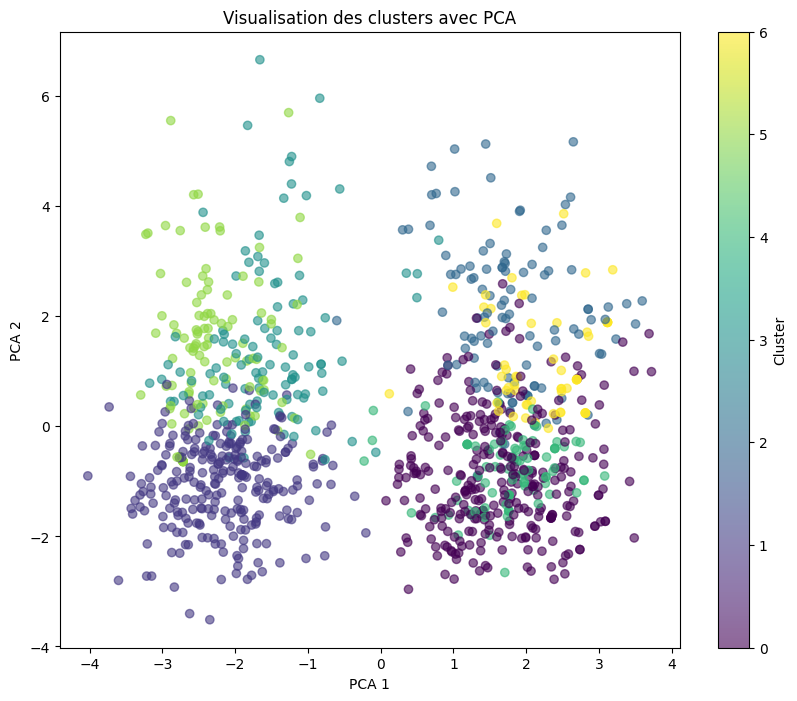

In [163]:
# Appliquer la PCA pour réduire à 2 dimensions
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_reduced)

# Ajouter les composants principaux au dataframe
df_bert['pca_1'] = X_pca[:, 0]
df_bert['pca_2'] = X_pca[:, 1]

# Visualiser les clusters en 2D
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df_bert['pca_1'], df_bert['pca_2'], c=df_bert['cluster'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
plt.title('Visualisation des clusters avec PCA')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

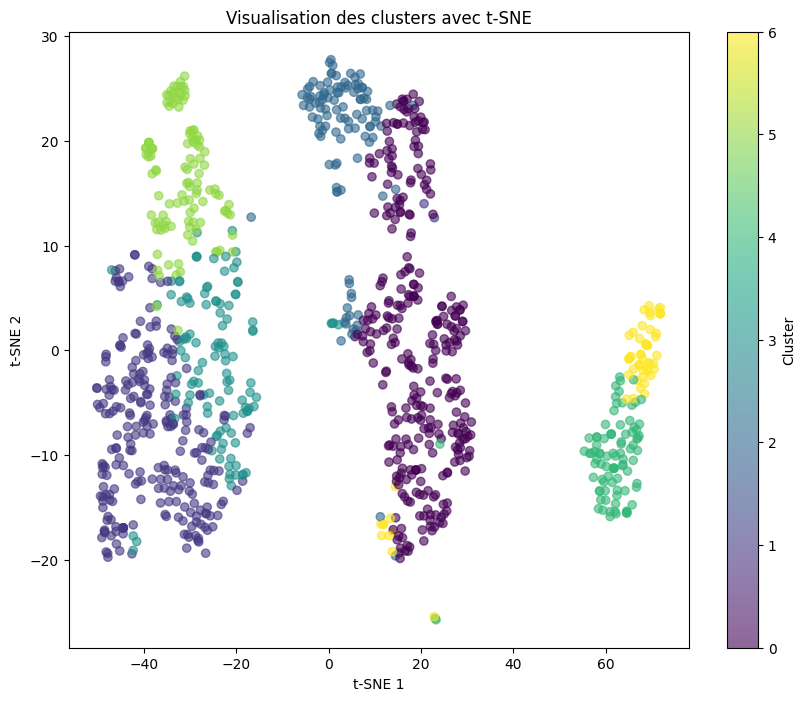

In [164]:
# Appliquer t-SNE pour réduire à 2 dimensions
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_reduced)

df_bert['tsne_1'] = X_tsne[:, 0]
df_bert['tsne_2'] = X_tsne[:, 1]

# Visualiser les clusters en 2D
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df_bert['tsne_1'], df_bert['tsne_2'], c=df_bert['cluster'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
plt.title('Visualisation des clusters avec t-SNE')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


#### e. Analyse de la correspondance entre labels et catégories réelles

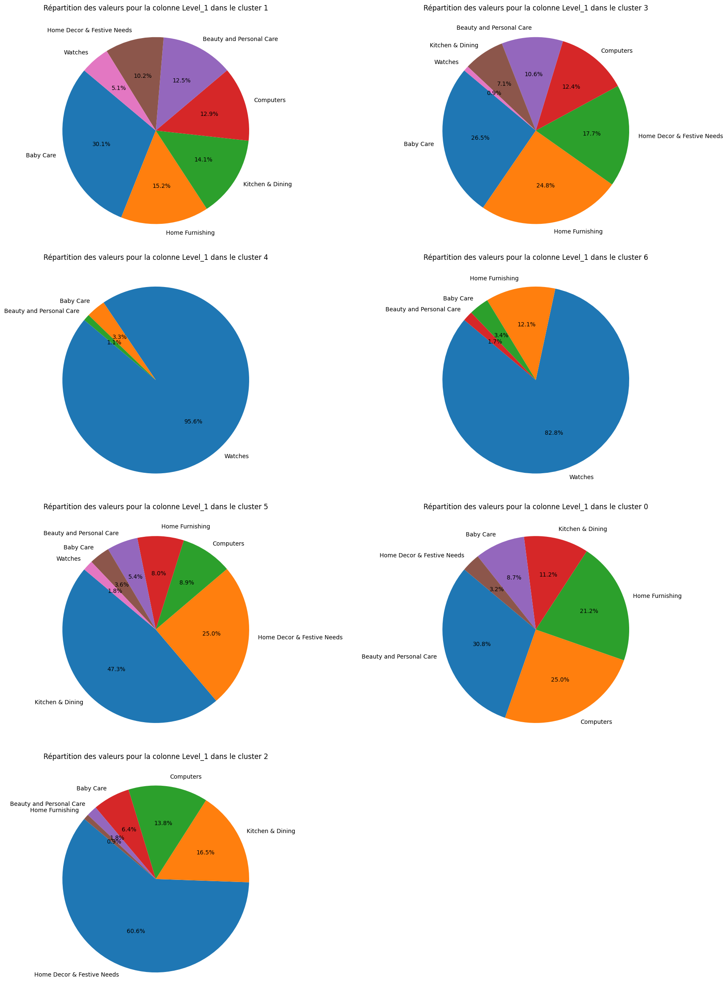

In [165]:
# Obtenir les clusters uniques
clusters = df_bert['cluster'].unique()

# Définir le nombre de colonnes pour les sous-graphes
num_cols = 2

# Calculer le nombre de lignes nécessaires
num_rows = (len(clusters) + num_cols - 1) // num_cols

# Créer les sous-graphes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 6))

# Aplatir les axes pour faciliter l'itération
axes = axes.flatten()

# Tracer un diagramme circulaire pour chaque cluster
for i, cluster in enumerate(clusters):
    cluster_data = df_bert[df_bert['cluster'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    axes[i].pie(level_1_counts, labels=level_1_counts.index, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(f"Répartition des valeurs pour la colonne Level_1 dans le cluster {cluster}")

# Supprimer les axes vides si le nombre de clusters n'est pas un multiple de num_cols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

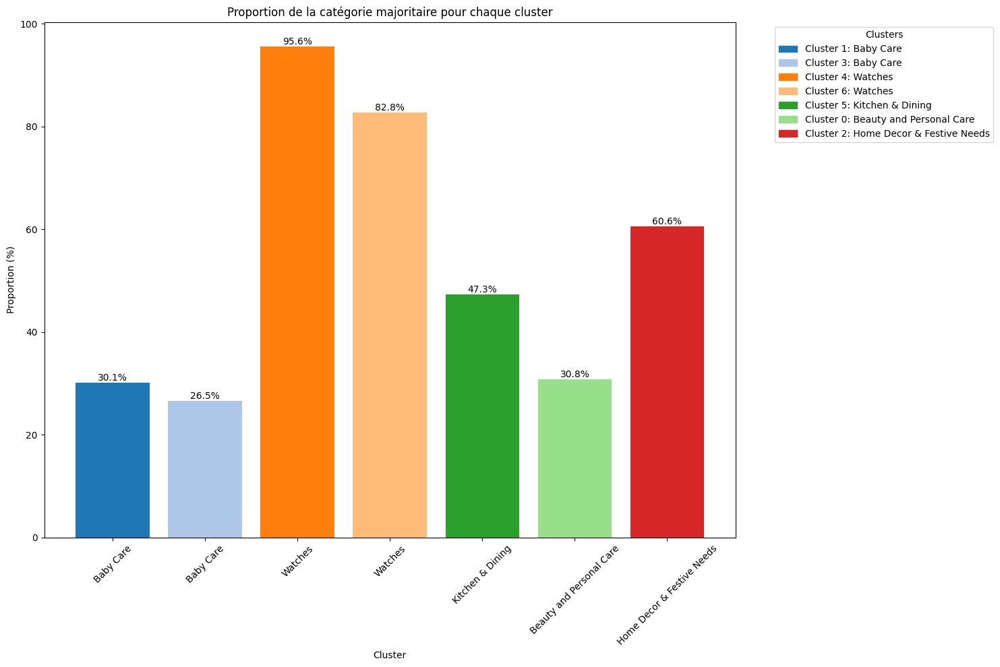

In [166]:
# Obtenir les clusters uniques
clusters = df_bert['cluster'].unique()

# Initialiser une liste pour stocker les informations
top_categories = []

# Extraire la catégorie la plus représentée et sa proportion pour chaque cluster
for cluster in clusters:
    cluster_data = df_bert[df_bert['cluster'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    # Obtenir la catégorie et la valeur la plus représentée
    top_category = level_1_counts.idxmax()
    top_value = level_1_counts.max()
    total_values = level_1_counts.sum()
    proportion = top_value / total_values * 100
    
    # Ajouter les informations à la liste
    top_categories.append({'Cluster': cluster, 'Top Category': top_category, 'Proportion': proportion})

# Convertir la liste en DataFrame
top_categories_df = pd.DataFrame(top_categories)

# Définir une palette de couleurs
colors = plt.cm.tab20.colors  

# Assigner une couleur à chaque cluster
cluster_colors = {cluster: colors[i % len(colors)] for i, cluster in enumerate(clusters)}

# Tracer l'histogramme des proportions
plt.figure(figsize=(15, 10))
bars = plt.bar(top_categories_df['Cluster'].astype(str), top_categories_df['Proportion'], 
               color=[cluster_colors[cluster] for cluster in top_categories_df['Cluster']], tick_label=top_categories_df['Top Category'])

# Ajouter les étiquettes de valeurs
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1f}%', ha='center', va='bottom')

# Ajouter la légende avec des descriptions plus complètes
handles = [plt.Rectangle((0,0),1,1, color=cluster_colors[cluster]) for cluster in clusters]
labels = [f'Cluster {cluster}: {top_categories_df[top_categories_df["Cluster"] == cluster]["Top Category"].values[0]}' for cluster in clusters]
plt.legend(handles, labels, title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Cluster')
plt.ylabel('Proportion (%)')
plt.title('Proportion de la catégorie majoritaire pour chaque cluster')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### 3. Utilisation de Universal Sentence Encoder (USE)

In [30]:
df_use = pd.read_csv('df_nlp.csv')

In [31]:
df_use['corpus'] = df_use['product_name'] +' '+ df_use['clean_description']

In [32]:
def clean_text_column(df, column_name):
    """
    Cette fonction nettoie une colonne de texte dans un DataFrame et conserve uniquement les noms et les adjectifs.
    :param df: DataFrame pandas
    :param column_name: Nom de la colonne à nettoyer
    :return: DataFrame avec une nouvelle colonne nettoyée
    """
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    def clean_text(text):
        # Mettre en minuscule
        text = text.lower()
        
        # Suppression de la ponctuation en ajoutant des espaces pour éviter la concatenation des mots
        text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
        
        # Tokenisation
        words = word_tokenize(text)
        
        # Suppression des stop words, des caractères non alphabétiques, et des lettres uniques
        words = [word for word in words if word.isalpha() and word not in stop_words and len(word) > 1]
        
        # POS tagging
        tagged_words = pos_tag(words)
        
        # Conserver seulement les noms (NN) et les adjectifs (JJ)
        #words = [word for word, tag in tagged_words if tag in ('NN', 'NNS', 'NNP', 'NNPS', 'JJ', 'JJR', 'JJS')]
        
        # Lemmatisation
        words = [lemmatizer.lemmatize(word) for word in words]
        
        return ' '.join(words)
    
    clean_column_name = 'clean_' + column_name
    df[clean_column_name] = df[column_name].apply(clean_text)
    
    return df

# Utilisation de la fonction sur la colonne description
df_use = clean_text_column(df_use, 'product_name')

#### a. Encodage du corpus avec USE

In [33]:
# Charger le modèle Universal Sentence Encoder
use_model = hub.KerasLayer("https://tfhub.dev/google/universal-sentence-encoder/4")

# Fonction pour encoder les textes par lots
def batch_encode(texts, model, batch_size=512):
    embeddings = []
    for i in tqdm(range(0, len(texts), batch_size)):
        batch_texts = texts[i:i+batch_size]
        batch_embeddings = model(batch_texts)
        embeddings.append(batch_embeddings)
    return tf.concat(embeddings, axis=0)

# Encoder la variable textuelle 'clean_product_name'
texts = df_use['clean_product_name'].tolist()
embeddings = batch_encode(texts, use_model)

# Convertir les embeddings en array et les ajouter au dataframe
df_use_embeddings = pd.DataFrame(embeddings.numpy(), columns=[f'embed_{i}' for i in range(embeddings.shape[1])])
df_use_encoded = pd.concat([df_use, df_use_embeddings], axis=1)


100%|██████████| 3/3 [00:00<00:00,  6.57it/s]


#### b. Réduction avec LSA & clustering avec le K-means

In [34]:
# Convertir les embeddings en une liste pour l'application de LSA
X = embeddings.numpy()

# Appliquer la réduction de dimension avec LSA
n_components = 7
lsa = TruncatedSVD(n_components=n_components, random_state=42)
X_reduced = lsa.fit_transform(X)

# Définir le nombre d'itérations et la méthode d'initialisation pour K-means
n_iter = 10000
init_method = 'k-means++'

# Appliquer K-means avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42, max_iter=n_iter, init=init_method)
df_use_encoded['cluster'] = kmeans.fit_predict(X_reduced)

#### c. Métriques de performances du clustering

In [35]:
# Sélectionner toutes les colonnes qui ont le préfixe 'embed_'
embed_columns = df_use_encoded.filter(like='embed_').columns
X = df_use_encoded[embed_columns].values

# Extraire les labels
labels = df_use_encoded['Level_1'].values

evaluations = []
evaluations_std = []

def fit_and_evaluate(km, X, labels, name=None, n_runs=5):
    name = km.__class__.__name__ if name is None else name

    train_times = []
    scores = defaultdict(list)
    for seed in range(n_runs):
        km.set_params(random_state=seed)
        t0 = time()
        km.fit(X)
        train_times.append(time() - t0)
        scores["Homogeneity"].append(metrics.homogeneity_score(labels, km.labels_))
        scores["Completeness"].append(metrics.completeness_score(labels, km.labels_))
        scores["V-measure"].append(metrics.v_measure_score(labels, km.labels_))
        scores["Adjusted Rand-Index"].append(
            metrics.adjusted_rand_score(labels, km.labels_)
        )
        scores["Silhouette Coefficient"].append(
            metrics.silhouette_score(X, km.labels_, sample_size=2000)
        )
    train_times = np.asarray(train_times)

    print(f"Clustering done in {train_times.mean():.2f} ± {train_times.std():.2f} s ")
    evaluation = {
        "estimator": name,
        "train_time": train_times.mean(),
    }
    evaluation_std = {
        "estimator": name,
        "train_time": train_times.std(),
    }
    for score_name, score_values in scores.items():
        mean_score, std_score = np.mean(score_values), np.std(score_values)
        print(f"{score_name}: {mean_score:.3f} ± {std_score:.3f}")
        evaluation[score_name] = mean_score
        evaluation_std[score_name] = std_score
    evaluations.append(evaluation)
    evaluations_std.append(evaluation_std)

# Initialisation de K-means avec k=7
km = KMeans(n_clusters=7, random_state=42)

# Application de la fonction d'évaluation
fit_and_evaluate(km, X_reduced, labels)


Clustering done in 0.02 ± 0.01 s 
Homogeneity: 0.620 ± 0.011
Completeness: 0.642 ± 0.008
V-measure: 0.631 ± 0.009
Adjusted Rand-Index: 0.523 ± 0.012
Silhouette Coefficient: 0.370 ± 0.006


#### d. Projection dans des espaces en 2D & 3D

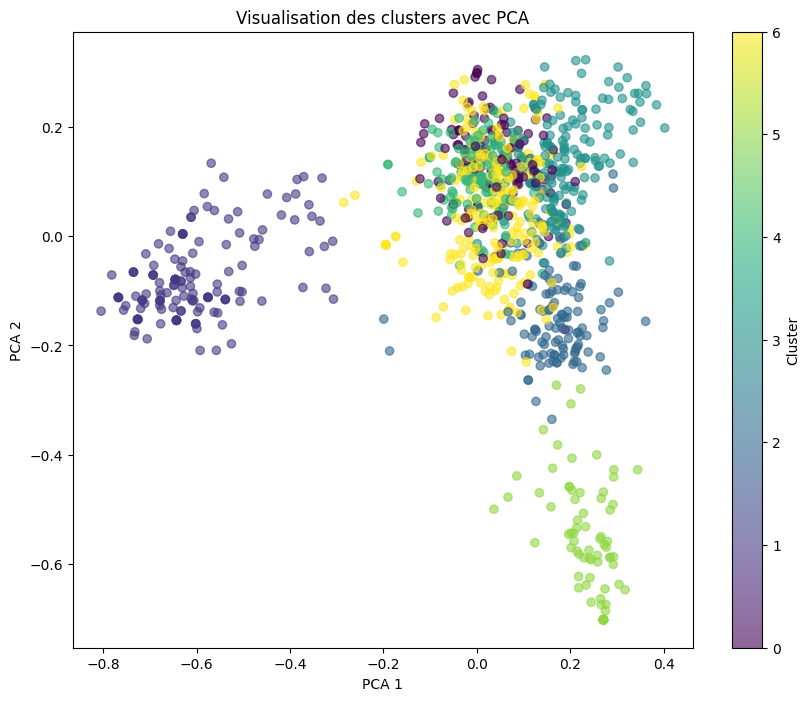

In [181]:
# Appliquer la PCA pour réduire à 2 dimensions
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_reduced)

# Ajouter les composants principaux au dataframe
df_use_encoded['pca_1'] = X_pca[:, 0]
df_use_encoded['pca_2'] = X_pca[:, 1]

# Visualiser les clusters en 2D
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df_use_encoded['pca_1'], df_use_encoded['pca_2'], c=df_use_encoded['cluster'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
plt.title('Visualisation des clusters avec PCA')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

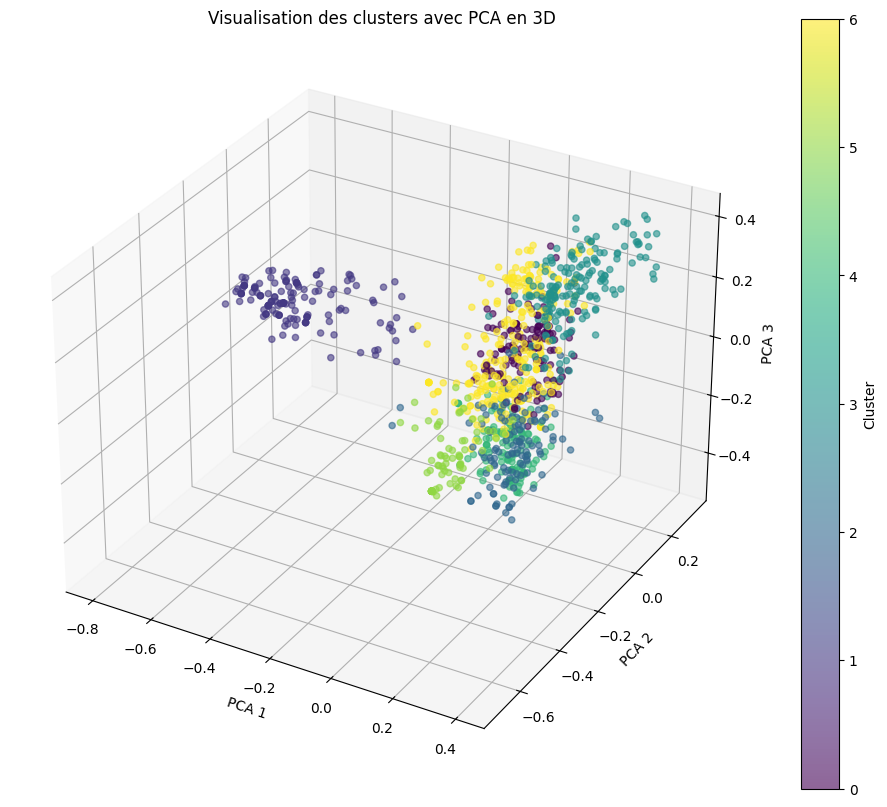

In [182]:
# Appliquer la PCA pour réduire à 3 dimensions
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_reduced)

# Ajouter les composants principaux au dataframe
df_use_encoded['pca_1'] = X_pca[:, 0]
df_use_encoded['pca_2'] = X_pca[:, 1]
df_use_encoded['pca_3'] = X_pca[:, 2]

# Visualiser les clusters en 3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_use_encoded['pca_1'], df_use_encoded['pca_2'], df_use_encoded['pca_3'], c=df_use_encoded['cluster'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
ax.set_title('Visualisation des clusters avec PCA en 3D')
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.show()


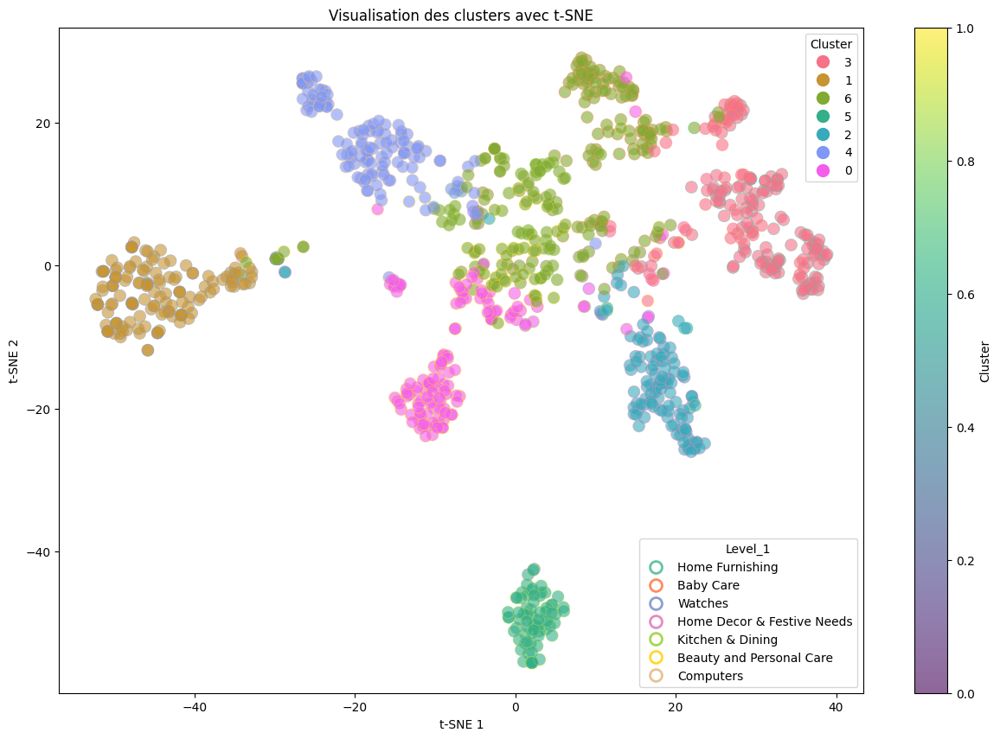

In [15]:
# Appliquer t-SNE pour réduire à 2 dimensions
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_reduced)

df_use_encoded['tsne_1'] = X_tsne[:, 0]
df_use_encoded['tsne_2'] = X_tsne[:, 1]

# Définir une palette de couleurs pour Level_1 et les clusters
cluster_palette = sns.color_palette("husl", df_use_encoded['cluster'].nunique())
level_1_palette = sns.color_palette("Set2", df_use_encoded['Level_1'].nunique())

# Mapper les couleurs
cluster_colors = {cluster: color for cluster, color in zip(df_use_encoded['cluster'].unique(), cluster_palette)}
level_1_colors = {level: color for level, color in zip(df_use_encoded['Level_1'].unique(), level_1_palette)}

# Visualiser les clusters en 2D avec deux variables catégorielles
plt.figure(figsize=(15, 10))

for level in df_use_encoded['Level_1'].unique():
    subset = df_use_encoded[df_use_encoded['Level_1'] == level]
    plt.scatter(
        subset['tsne_1'], subset['tsne_2'],
        c=subset['cluster'].map(cluster_colors), alpha=0.6, s=100,
        edgecolor=[level_1_colors[level]] * len(subset), linewidth=0.5, label=level
    )

# Créer des légendes
# Légende pour Level_1
handles_level_1 = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='w', markersize=10, 
                              markeredgecolor=color, markeredgewidth=2) for color in level_1_palette]
labels_level_1 = df_use_encoded['Level_1'].unique()

# Légende pour clusters
handles_cluster = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10) for color in cluster_palette]
labels_cluster = df_use_encoded['cluster'].unique()

# Ajouter les légendes
first_legend = plt.legend(handles_cluster, labels_cluster, title="Cluster", loc="upper right")
plt.gca().add_artist(first_legend)
plt.legend(handles_level_1, labels_level_1, title="Level_1", loc="lower right")

plt.colorbar(label='Cluster')
plt.title('Visualisation des clusters avec t-SNE')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


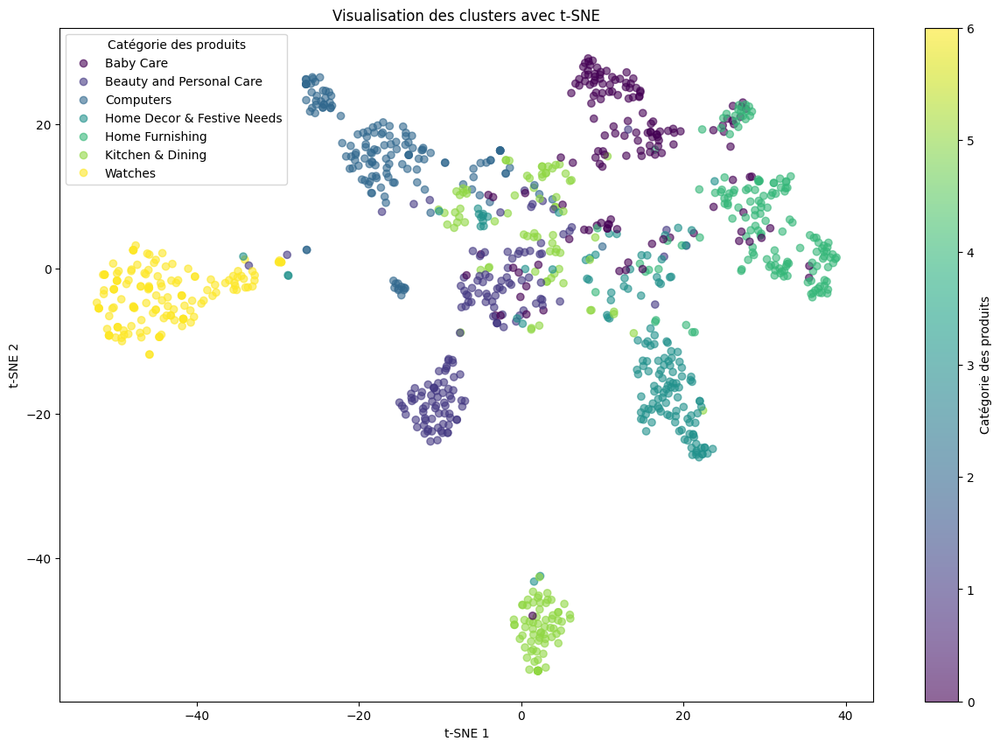

In [21]:
# Appliquer t-SNE pour réduire à 2 dimensions
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_reduced)

df_use_encoded['tsne_1'] = X_tsne[:, 0]
df_use_encoded['tsne_2'] = X_tsne[:, 1]

# Encoder les catégories en valeurs numériques
label_encoder = LabelEncoder()
df_use_encoded['Level_1_encoded'] = label_encoder.fit_transform(df_use_encoded['Level_1'])

# Visualiser les clusters en 2D
plt.figure(figsize=(15, 10))
scatter = plt.scatter(df_use_encoded['tsne_1'], df_use_encoded['tsne_2'], c=df_use_encoded['Level_1_encoded'], cmap='viridis', alpha=0.6)

# Ajouter une légende personnalisée
handles, _ = scatter.legend_elements()
labels = label_encoder.classes_
legend = plt.legend(handles, labels, title="Catégorie des produits")

plt.colorbar(scatter, label='Catégorie des produits')
plt.title('Visualisation des clusters avec t-SNE')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


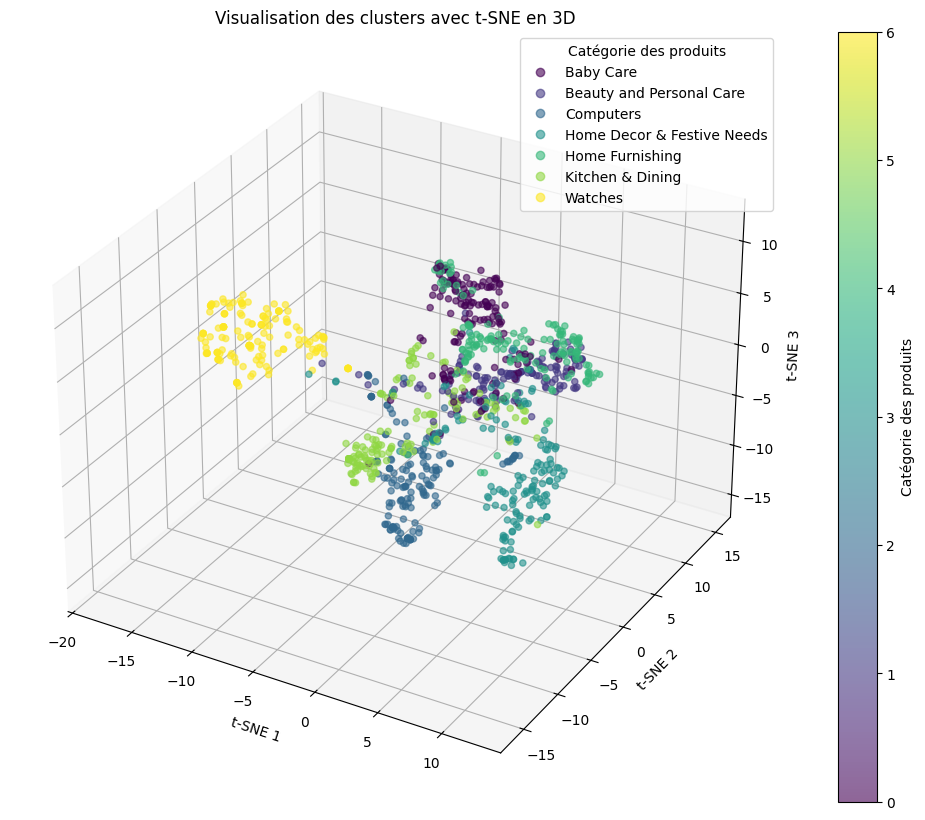

In [22]:
# Appliquer t-SNE pour réduire à 3 dimensions
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(X_reduced)

df_use_encoded['tsne_1'] = X_tsne[:, 0]
df_use_encoded['tsne_2'] = X_tsne[:, 1]
df_use_encoded['tsne_3'] = X_tsne[:, 2]

# Encoder les catégories en valeurs numériques
label_encoder = LabelEncoder()
df_use_encoded['Level_1_encoded'] = label_encoder.fit_transform(df_use_encoded['Level_1'])

# Visualiser les clusters en 3D
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_use_encoded['tsne_1'], df_use_encoded['tsne_2'], df_use_encoded['tsne_3'], 
                     c=df_use_encoded['Level_1_encoded'], cmap='viridis', alpha=0.6)

# Ajouter une légende personnalisée
handles, _ = scatter.legend_elements()
labels = label_encoder.classes_
legend = ax.legend(handles, labels, title="Catégorie des produits")

fig.colorbar(scatter, ax=ax, label='Catégorie des produits')
ax.set_title('Visualisation des clusters avec t-SNE en 3D')
ax.set_xlabel('t-SNE 1')
ax.set_ylabel('t-SNE 2')
ax.set_zlabel('t-SNE 3')
plt.show()


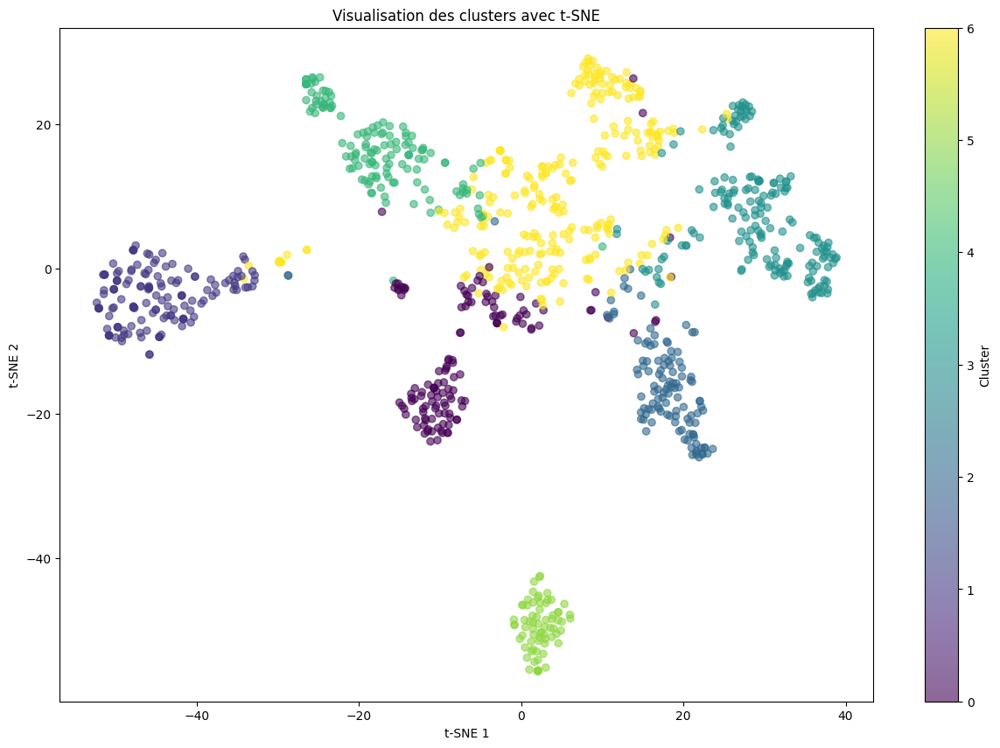

In [12]:
# Appliquer t-SNE pour réduire à 2 dimensions
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_reduced)

df_use_encoded['tsne_1'] = X_tsne[:, 0]
df_use_encoded['tsne_2'] = X_tsne[:, 1]

# Visualiser les clusters en 2D
plt.figure(figsize=(15, 10))
scatter = plt.scatter(df_use_encoded['tsne_1'], df_use_encoded['tsne_2'], c=df_use_encoded['cluster'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
plt.title('Visualisation des clusters avec t-SNE')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


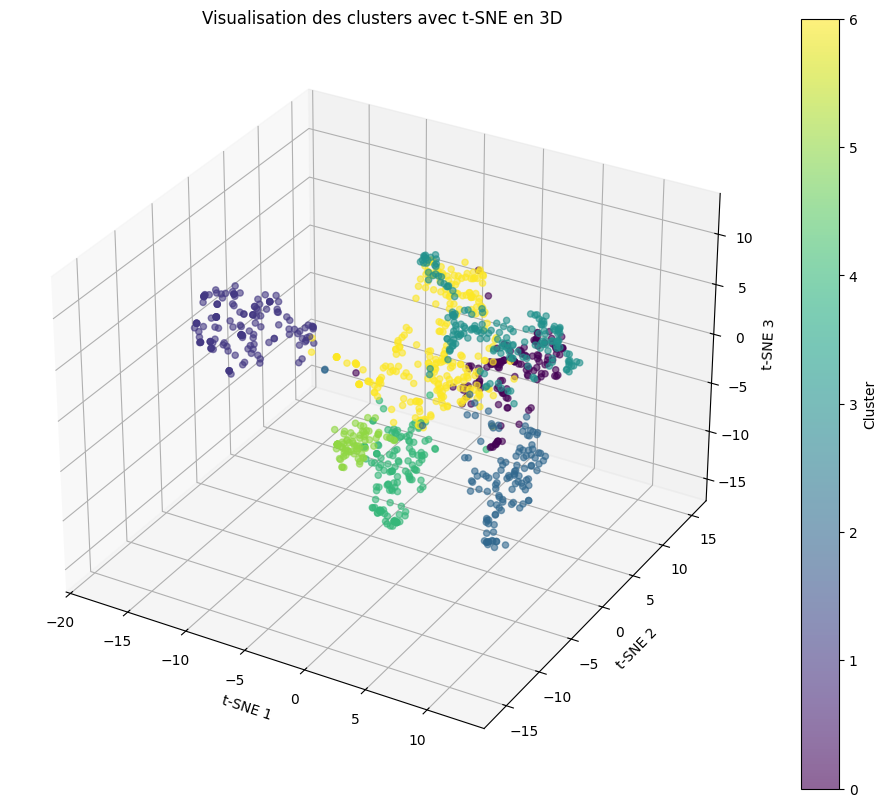

In [184]:
# Appliquer t-SNE pour réduire à 3 dimensions
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(X_reduced)

# Ajouter les composants t-SNE au dataframe
df_use_encoded['tsne_1'] = X_tsne[:, 0]
df_use_encoded['tsne_2'] = X_tsne[:, 1]
df_use_encoded['tsne_3'] = X_tsne[:, 2]

# Visualiser les clusters en 3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_use_encoded['tsne_1'], df_use_encoded['tsne_2'], df_use_encoded['tsne_3'], c=df_use_encoded['cluster'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
ax.set_title('Visualisation des clusters avec t-SNE en 3D')
ax.set_xlabel('t-SNE 1')
ax.set_ylabel('t-SNE 2')
ax.set_zlabel('t-SNE 3')
plt.show()


#### e. Correspondance des catégories / labels

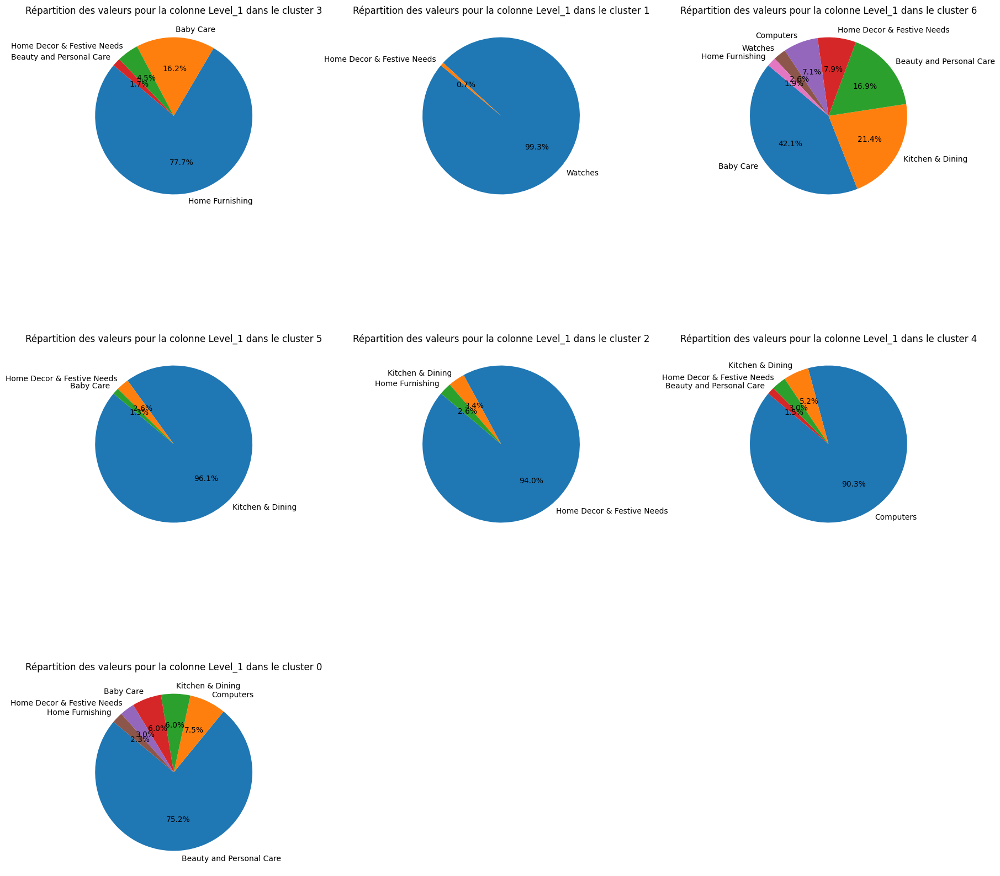

In [17]:
# Obtenir les clusters uniques
clusters = df_use_encoded['cluster'].unique()

# Définir le nombre de colonnes pour les sous-graphes
num_cols = 3

# Calculer le nombre de lignes nécessaires
num_rows = (len(clusters) + num_cols - 1) // num_cols

# Créer les sous-graphes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 6))

# Aplatir les axes pour faciliter l'itération
axes = axes.flatten()

# Tracer un diagramme circulaire pour chaque cluster
for i, cluster in enumerate(clusters):
    cluster_data = df_use_encoded[df_use_encoded['cluster'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    axes[i].pie(level_1_counts, labels=level_1_counts.index, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(f"Répartition des valeurs pour la colonne Level_1 dans le cluster {cluster}")

# Supprimer les axes vides si le nombre de clusters n'est pas un multiple de num_cols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

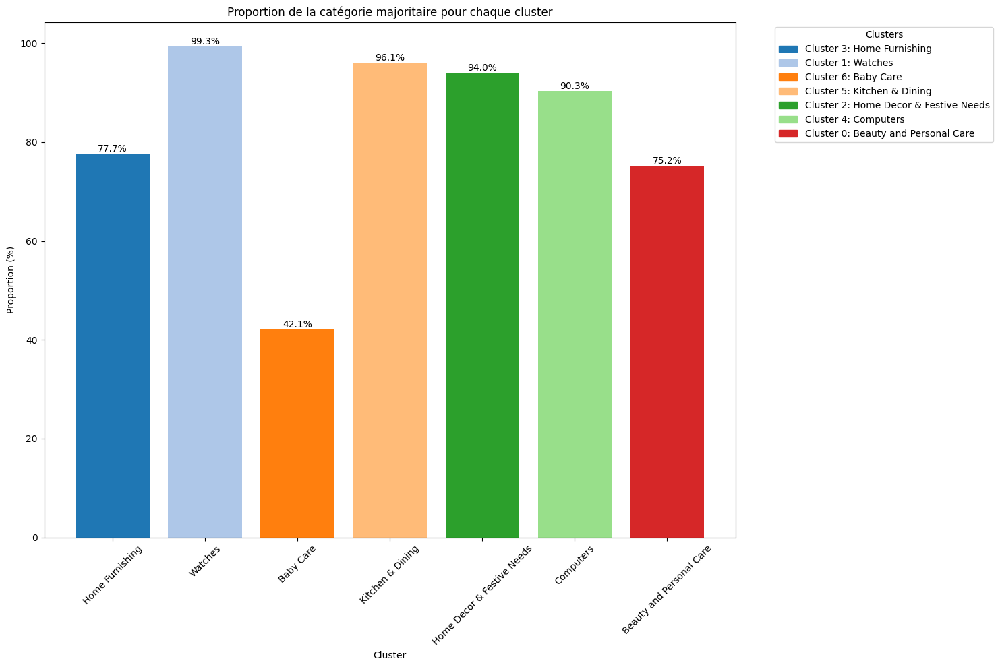

In [18]:
# Obtenir les clusters uniques
clusters = df_use_encoded['cluster'].unique()

# Initialiser une liste pour stocker les informations
top_categories = []

# Extraire la catégorie la plus représentée et sa proportion pour chaque cluster
for cluster in clusters:
    cluster_data = df_use_encoded[df_use_encoded['cluster'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    # Obtenir la catégorie et la valeur la plus représentée
    top_category = level_1_counts.idxmax()
    top_value = level_1_counts.max()
    total_values = level_1_counts.sum()
    proportion = top_value / total_values * 100
    
    # Ajouter les informations à la liste
    top_categories.append({'Cluster': cluster, 'Top Category': top_category, 'Proportion': proportion})

# Convertir la liste en DataFrame
top_categories_df = pd.DataFrame(top_categories)

# Définir une palette de couleurs
colors = plt.cm.tab20.colors  # Choisir une palette avec suffisamment de couleurs

# Assigner une couleur à chaque cluster
cluster_colors = {cluster: colors[i % len(colors)] for i, cluster in enumerate(clusters)}

# Tracer l'histogramme des proportions
plt.figure(figsize=(15, 10))
bars = plt.bar(top_categories_df['Cluster'].astype(str), top_categories_df['Proportion'], 
               color=[cluster_colors[cluster] for cluster in top_categories_df['Cluster']], tick_label=top_categories_df['Top Category'])

# Ajouter les étiquettes de valeurs
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1f}%', ha='center', va='bottom')

# Ajouter la légende avec des descriptions plus complètes
handles = [plt.Rectangle((0,0),1,1, color=cluster_colors[cluster]) for cluster in clusters]
labels = [f'Cluster {cluster}: {top_categories_df[top_categories_df["Cluster"] == cluster]["Top Category"].values[0]}' for cluster in clusters]
plt.legend(handles, labels, title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Cluster')
plt.ylabel('Proportion (%)')
plt.title('Proportion de la catégorie majoritaire pour chaque cluster')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [10]:
####chercher les topics avec LDA ..
# NETTOYER LE CORPUS

def clean_text_column(df, column_name):
    """
    Cette fonction nettoie une colonne de texte dans un DataFrame et conserve uniquement les noms et les adjectifs.
    :param df: DataFrame pandas
    :param column_name: Nom de la colonne à nettoyer
    :return: DataFrame avec une nouvelle colonne nettoyée
    """
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    
    def clean_text(text):
        # Mettre en minuscule
        text = text.lower()
        
        # Suppression de la ponctuation en ajoutant des espaces pour éviter la concatenation des mots
        text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
        
        # Tokenisation
        words = word_tokenize(text)
        
        # Suppression des stop words, des caractères non alphabétiques, et des lettres uniques
        words = [word for word in words if word.isalpha() and word not in stop_words and len(word) > 1]
        
        # POS tagging
        tagged_words = pos_tag(words)
        
        # Conserver seulement les noms (NN) et les adjectifs (JJ)
        words = [word for word, tag in tagged_words if tag in ('NN', 'NNS', 'NNP', 'NNPS', 'JJ', 'JJR', 'JJS')]
        
        # Lemmatisation
        words = [lemmatizer.lemmatize(word) for word in words]
        
        return ' '.join(words)
    
    clean_column_name = 'clean_' + column_name
    df[clean_column_name] = df[column_name].apply(clean_text)
    
    return df

# Utilisation de la fonction sur la colonne description
df_use = clean_text_column(df_use, 'corpus')


In [14]:


# Supposons que 'clean_corpus' est une liste de phrases nettoyées
clean_corpus = df_use['clean_corpus'].tolist()

# Tokenisation
#tokenized_corpus = [preprocess_string(doc) for doc in clean_corpus]

# Création du dictionnaire et du corpus (Bag of Words)
dictionary = corpora.Dictionary(tokenized_corpus)
corpus = [dictionary.doc2bow(text) for text in tokenized_corpus]

# Construction du modèle LDA
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=7, passes=180)

# Affichage des mots-clés pour chaque thème
for idx, topic in lda_model.print_topics(-1):
    print('Thème: {} \nMots-clés: {}\n'.format(idx, topic))

Thème: 0 
Mots-clés: 0.029*"towel" + 0.018*"cotton" + 0.014*"hair" + 0.014*"bath" + 0.014*"skin" + 0.013*"type" + 0.013*"price" + 0.011*"soft" + 0.011*"soap" + 0.010*"face"

Thème: 1 
Mots-clés: 0.018*"inch" + 0.017*"box" + 0.016*"color" + 0.015*"design" + 0.014*"sale" + 0.014*"featur" + 0.013*"number" + 0.013*"materi" + 0.013*"home" + 0.013*"pack"

Thème: 2 
Mots-clés: 0.042*"flipkart" + 0.040*"com" + 0.037*"combo" + 0.036*"mug" + 0.028*"free" + 0.028*"genuin" + 0.028*"cash" + 0.028*"deliveri" + 0.027*"dai" + 0.027*"product"

Thème: 3 
Mots-clés: 0.044*"product" + 0.042*"free" + 0.042*"deliveri" + 0.042*"genuin" + 0.042*"cash" + 0.038*"watch" + 0.034*"dai" + 0.034*"replac" + 0.034*"analog" + 0.034*"guarante"

Thème: 4 
Mots-clés: 0.062*"mug" + 0.046*"ceram" + 0.022*"coffe" + 0.019*"product" + 0.019*"perfect" + 0.018*"gift" + 0.016*"rockmantra" + 0.015*"specif" + 0.014*"price" + 0.014*"safe"

Thème: 5 
Mots-clés: 0.049*"babi" + 0.035*"girl" + 0.022*"fabric" + 0.021*"cotton" + 0.016*"dr

#### f. Utilisation de la GridSearchCV pour optimiser les transformations

### 4. Utilisation de BERT & USE

In [161]:
df_bu = pd.read_csv('df_text.csv')

In [162]:
df_bu

,product_name,product_category_tree,description,tree_depth,Level_1,Level_2,Level_3,Level_4,Level_5,Level_6,Level_7,lenght_description,lenght_name
0,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]","Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the right amount of sunlight.,Specifications of Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) General Brand Elegance Designed For Door Type Eyelet Model Name Abstract Polyester Door Curtain Set Of 2 Model ID Duster25 Color Multicolor Dimensions Length 213 cm In the Box Number of Contents in Sales Package Pack of 2 Sales Package 2 Curtains Body & Design Material Polyester",4,Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet Do...,NaN,NaN,NaN,1420,58
1,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]","Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",5,Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...",NaN,NaN,444,26
2,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA...""]","Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our product is 100% cotton, so it is susceptible to shrinkage. Product color may vary from the picture. Size may vary by ±3% WASH CARE: Wash in cold Water, Do not Iron, Do not Bleach, Flat dry, Wash before first use. SIZE- FACE TOWEL - 23 cms X 23 cms.,Specifications of Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Bath Towel Features Material Cotton Terry Design SHUVAM General Brand Eurospa GSM 360 Type Face Towel Set Model Name SHUVAM20PCFTSETASSORTED Ideal For Boys, Girls, Men, Women Model ID SHUVAM20PCFTSETASSORTED Size small Color Assorted Dimensions Weight 350 g Length 9 inch Width 9 inch In the Box Number of 

In [163]:
# Chargement des modèles BERT et USE
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')
use_model = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Fonction pour obtenir les embeddings BERT
def get_bert_embeddings(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=512)
    outputs = bert_model(**inputs)
    embeddings = outputs.last_hidden_state[:, 0, :].detach().numpy()
    return embeddings[0]

# Fonction pour obtenir les embeddings USE
def get_use_embeddings(text):
    embeddings = use_model([text])
    return embeddings.numpy()[0]

# Fonction pour combiner les embeddings BERT et USE
def combine_embeddings(text):
    bert_embeddings = get_bert_embeddings(text)
    use_embeddings = get_use_embeddings(text)
    combined_embeddings = np.concatenate((bert_embeddings, use_embeddings))
    return combined_embeddings

# Application de la fonction de combinaison aux textes de la colonne clean_corpus
df_bu['combined_embeddings'] = df_bu['description'].apply(lambda x: combine_embeddings(x))

In [164]:
# Convertir les vecteurs en une liste pour l'application de LSA
X = list(df_bu['combined_embeddings'].values)

# Appliquer la réduction de dimension avec LSA (TruncatedSVD)
n_components = 7
lsa = TruncatedSVD(n_components=n_components, random_state=42)
X_reduced = lsa.fit_transform(X)

# Définir le nombre d'itérations et la méthode d'initialisation pour K-means
n_iter = 1000
init_method = 'k-means++'

# Appliquer K-means avec k=7 sur les données réduites
kmeans = KMeans(n_clusters=7, random_state=42, max_iter=n_iter, init=init_method)
df_bu['cluster'] = kmeans.fit_predict(X_reduced)

In [165]:
# X contient les vecteurs BERT
X = list(df_bu['combined_embeddings'].values)
labels = df_bu['Level_1'].values

evaluations = []
evaluations_std = []

def fit_and_evaluate(km, X, labels, name=None, n_runs=5):
    name = km.__class__.__name__ if name is None else name

    train_times = []
    scores = defaultdict(list)
    for seed in range(n_runs):
        km.set_params(random_state=seed)
        t0 = time()
        km.fit(X)
        train_times.append(time() - t0)
        scores["Homogeneity"].append(metrics.homogeneity_score(labels, km.labels_))
        scores["Completeness"].append(metrics.completeness_score(labels, km.labels_))
        scores["V-measure"].append(metrics.v_measure_score(labels, km.labels_))
        scores["Adjusted Rand-Index"].append(
            metrics.adjusted_rand_score(labels, km.labels_)
        )
        scores["Silhouette Coefficient"].append(
            metrics.silhouette_score(X, km.labels_, sample_size=2000)
        )
    train_times = np.asarray(train_times)

    print(f"Clustering done in {train_times.mean():.2f} ± {train_times.std():.2f} s ")
    evaluation = {
        "estimator": name,
        "train_time": train_times.mean(),
    }
    evaluation_std = {
        "estimator": name,
        "train_time": train_times.std(),
    }
    for score_name, score_values in scores.items():
        mean_score, std_score = np.mean(score_values), np.std(score_values)
        print(f"{score_name}: {mean_score:.3f} ± {std_score:.3f}")
        evaluation[score_name] = mean_score
        evaluation_std[score_name] = std_score
    evaluations.append(evaluation)
    evaluations_std.append(evaluation_std)

# Initialisation de K-means avec k=7
km = KMeans(n_clusters=7, random_state=42)

# Application de la fonction d'évaluation
fit_and_evaluate(km, X_reduced, labels)


Clustering done in 0.02 ± 0.01 s 
Homogeneity: 0.327 ± 0.036
Completeness: 0.343 ± 0.027
V-measure: 0.335 ± 0.032
Adjusted Rand-Index: 0.242 ± 0.028
Silhouette Coefficient: 0.419 ± 0.014


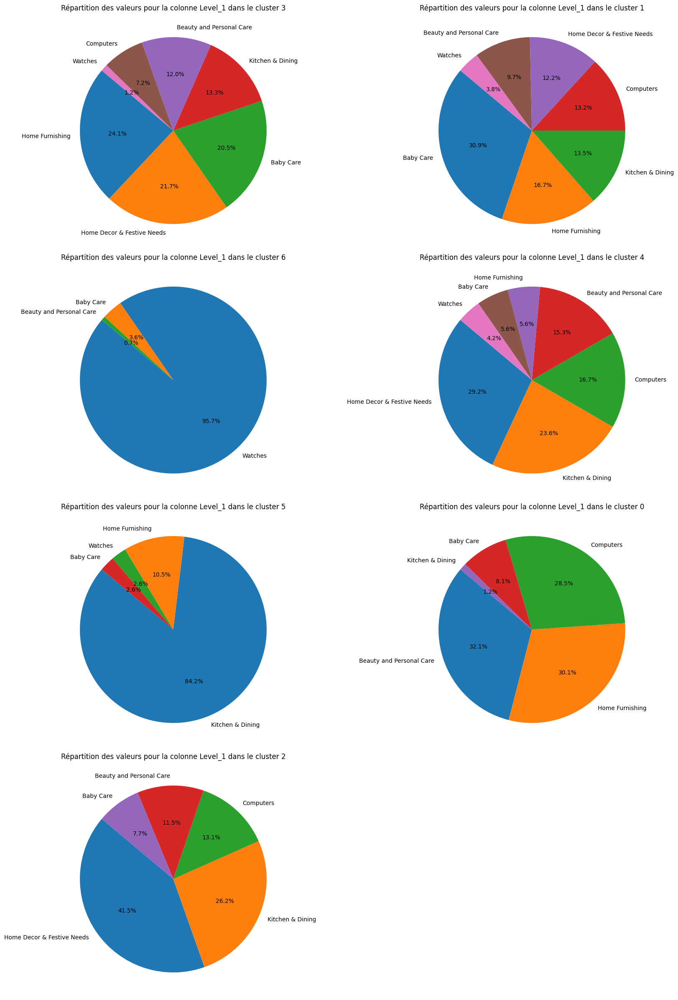

In [167]:
# Obtenir les clusters uniques
clusters = df_bu['cluster'].unique()

# Définir le nombre de colonnes pour les sous-graphes
num_cols = 2

# Calculer le nombre de lignes nécessaires
num_rows = (len(clusters) + num_cols - 1) // num_cols

# Créer les sous-graphes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 6))

# Aplatir les axes pour faciliter l'itération
axes = axes.flatten()

# Tracer un diagramme circulaire pour chaque cluster
for i, cluster in enumerate(clusters):
    cluster_data = df_w2v[df_bu['cluster'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    axes[i].pie(level_1_counts, labels=level_1_counts.index, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(f"Répartition des valeurs pour la colonne Level_1 dans le cluster {cluster}")

# Supprimer les axes vides si le nombre de clusters n'est pas un multiple de num_cols
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

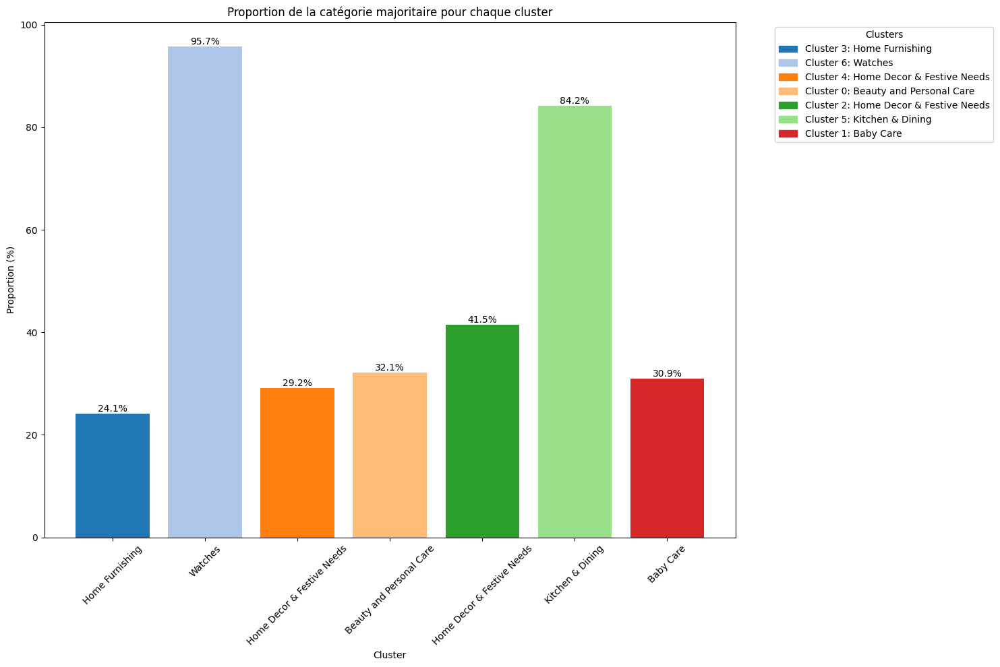

In [168]:
# Obtenir les clusters uniques
clusters = df_use_encoded['cluster'].unique()

# Initialiser une liste pour stocker les informations
top_categories = []

# Extraire la catégorie la plus représentée et sa proportion pour chaque cluster
for cluster in clusters:
    cluster_data = df_bu[df_bu['cluster'] == cluster]
    level_1_counts = cluster_data['Level_1'].value_counts()
    
    # Obtenir la catégorie et la valeur la plus représentée
    top_category = level_1_counts.idxmax()
    top_value = level_1_counts.max()
    total_values = level_1_counts.sum()
    proportion = top_value / total_values * 100
    
    # Ajouter les informations à la liste
    top_categories.append({'Cluster': cluster, 'Top Category': top_category, 'Proportion': proportion})

# Convertir la liste en DataFrame
top_categories_df = pd.DataFrame(top_categories)

# Définir une palette de couleurs
colors = plt.cm.tab20.colors

# Assigner une couleur à chaque cluster
cluster_colors = {cluster: colors[i % len(colors)] for i, cluster in enumerate(clusters)}

# Tracer l'histogramme des proportions
plt.figure(figsize=(15, 10))
bars = plt.bar(top_categories_df['Cluster'].astype(str), top_categories_df['Proportion'], 
               color=[cluster_colors[cluster] for cluster in top_categories_df['Cluster']], tick_label=top_categories_df['Top Category'])

# Ajouter les étiquettes de valeurs
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1f}%', ha='center', va='bottom')

# Ajouter la légende avec des descriptions plus complètes
handles = [plt.Rectangle((0,0),1,1, color=cluster_colors[cluster]) for cluster in clusters]
labels = [f'Cluster {cluster}: {top_categories_df[top_categories_df["Cluster"] == cluster]["Top Category"].values[0]}' for cluster in clusters]
plt.legend(handles, labels, title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Cluster')
plt.ylabel('Proportion (%)')
plt.title('Proportion de la catégorie majoritaire pour chaque cluster')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## D. Analyse des données textuelles avec modélisation supervisée (SVC & Random Forest)

### 1. Modélisation supervisée avec le SVC

In [11]:
df_svc = pd.read_csv('df_nlp.csv')

#### a. Sélection du meilleur outil NLP entre Word2Vec ; BERT & USE

In [17]:
# Enlever les colonnes non-utiles à la modélisation
#df_svc = df_svc.drop(columns=['product_name', 'clean_description', 'clean_product_name'])

# Encoder la colonne target
label_encoder = LabelEncoder()
df_svc['Level_1'] = label_encoder.fit_transform(df_svc['Level_1'])

# Séparer les features et le target
X = df_svc['clean_corpus']
y = df_svc['Level_1']

# Split des données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [18]:
class Word2VecVectorizer(BaseEstimator, TransformerMixin):
    def __init__(self, vector_size=100, window=7, min_count=2, workers=4):
        self.vector_size = vector_size
        self.window = window
        self.min_count = min_count
        self.workers = workers

    def fit(self, X, y=None):
        sentences = [text.split() for text in X]
        self.model = Word2Vec(sentences, vector_size=self.vector_size, window=self.window, min_count=self.min_count, workers=self.workers)
        return self

    def transform(self, X):
        return np.array([np.mean([self.model.wv[word] for word in text.split() if word in self.model.wv] or [np.zeros(self.vector_size)], axis=0) for text in X])

# Pipeline Word2Vec
pipeline_w2v = Pipeline([
    ('w2v', Word2VecVectorizer()),
    ('svc', SVC())
])

pipeline_w2v.fit(X_train, y_train)
y_pred_w2v = pipeline_w2v.predict(X_test)
accuracy_w2v = accuracy_score(y_test, y_pred_w2v)
print(f'Accuracy Word2Vec: {accuracy_w2v}')


Accuracy Word2Vec: 0.6523809523809524


In [19]:
class BERTVectorizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
        self.model = BertModel.from_pretrained('bert-base-uncased')

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        embeddings = []
        for text in X:
            inputs = self.tokenizer(text, return_tensors='pt', truncation=True, padding=True)
            outputs = self.model(**inputs)
            embeddings.append(outputs.last_hidden_state.mean(dim=1).detach().numpy().flatten())
        return np.array(embeddings)

# Pipeline BERT
pipeline_bert = Pipeline([
    ('bert', BERTVectorizer()),
    ('svc', SVC())
])

pipeline_bert.fit(X_train, y_train)
y_pred_bert = pipeline_bert.predict(X_test)
accuracy_bert = accuracy_score(y_test, y_pred_bert)
print(f'Accuracy BERT: {accuracy_bert}')


Accuracy BERT: 0.9333333333333333


In [20]:
class USEVectorizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return self.embed(X).numpy()

# Pipeline USE
pipeline_use = Pipeline([
    ('use', USEVectorizer()),
    ('svc', SVC())
])

pipeline_use.fit(X_train, y_train)
y_pred_use = pipeline_use.predict(X_test)
accuracy_use = accuracy_score(y_test, y_pred_use)
print(f'Accuracy USE: {accuracy_use}')


Accuracy USE: 0.9380952380952381


In [21]:
# Comparaison entre les trois modèles
accuracies = {
    'Word2Vec': accuracy_w2v,
    'BERT': accuracy_bert,
    'USE': accuracy_use
}

for method, acc in accuracies.items():
    print(f'{method} accuracy: {acc}')

best_method = max(accuracies, key=accuracies.get)
print(f'The best method is: {best_method} with an accuracy of {accuracies[best_method]}')


Word2Vec accuracy: 0.6523809523809524
BERT accuracy: 0.9333333333333333
USE accuracy: 0.9380952380952381
The best method is: USE with an accuracy of 0.9380952380952381


Avec une légère avance en terme de performances, nous allons donc prendre le USE pour aller plus loin dans la modélisation supervisée, avec le SVC.

#### b. Modélisation multi-classes avec USE + SVC

##### i. Préparation des données (encodage avec USE)

In [16]:
df_svcUse = pd.read_csv('df_nlp.csv')
df_svcUse = df_svcUse[['clean_corpus',
                    'Level_1']].copy()

In [17]:
# Charger le modèle Universal Sentence Encoder
use_model = hub.KerasLayer("https://tfhub.dev/google/universal-sentence-encoder/4", trainable=False)

# Séparer les features et le target
X = df_svcUse['clean_corpus']
y = df_svcUse['Level_1']

# Vectoriser le corpus avec USE
X_vectorized = use_model(X.tolist()).numpy()

# Normaliser les données vectorisées
scaler = StandardScaler()
X_vectorized_normalized = scaler.fit_transform(X_vectorized)

# Split des données
X_train, X_test, y_train, y_test = train_test_split(X_vectorized_normalized, y, test_size=0.2, random_state=42)

##### ii. Modélisation avec le SVC

In [22]:
# Entraîner un modèle SVC linéaire
model = SVC(kernel='rbf', random_state=42)
model.fit(X_train, y_train)

# Prédire sur le jeu de test
y_pred = model.predict(X_test)

# Évaluer le modèle
report = classification_report(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

# Afficher les résultats
print(f"Global Accuracy: {accuracy:.3f}")
print("Classification Report:")
print(report)

Global Accuracy: 0.938
Classification Report:
                            precision    recall  f1-score   support

                 Baby Care       0.95      0.70      0.81        27
  Beauty and Personal Care       0.95      1.00      0.98        21
                 Computers       0.97      1.00      0.99        38
Home Decor & Festive Needs       0.85      0.97      0.91        30
           Home Furnishing       0.92      0.94      0.93        35
          Kitchen & Dining       0.92      0.92      0.92        26
                   Watches       1.00      1.00      1.00        33

                  accuracy                           0.94       210
                 macro avg       0.94      0.93      0.93       210
              weighted avg       0.94      0.94      0.94       210



##### iii. Résultats de la modélisation

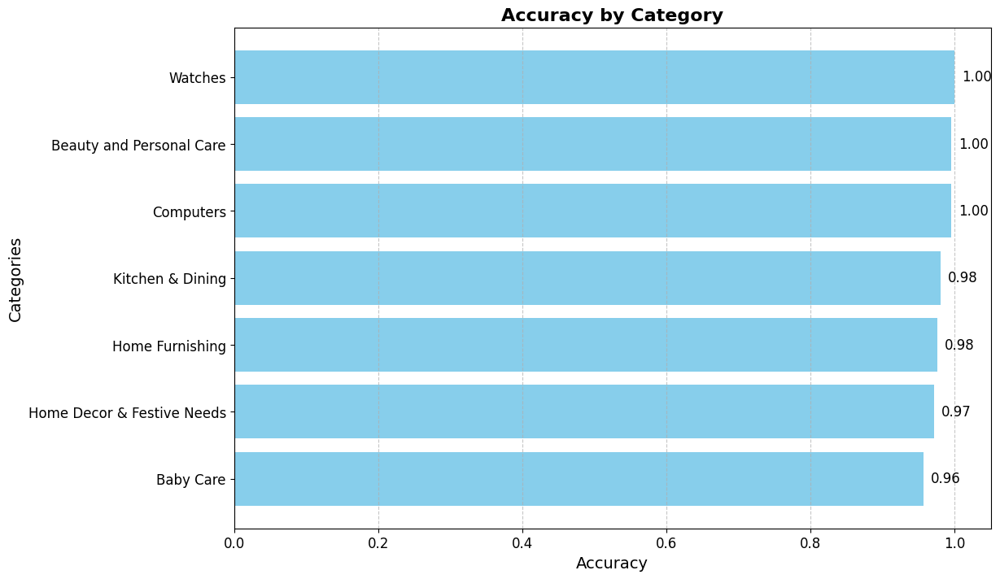

In [26]:
from sklearn.preprocessing import LabelBinarizer

# Binarisation des étiquettes
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test)
y_pred_bin = lb.transform(y_pred)

# Calculer l'accuracy pour chaque catégorie
accuracies = []
for i in range(y_test_bin.shape[1]):
    accuracy = accuracy_score(y_test_bin[:, i], y_pred_bin[:, i])
    accuracies.append((lb.classes_[i], accuracy))

# Trier les accuracies du meilleur résultat au moins bon
accuracies.sort(key=lambda x: x[1], reverse=True)

# Extraire les noms des catégories et les accuracies
categories = [x[0] for x in accuracies]
accuracy_values = [x[1] for x in accuracies]

# Créer l'histogramme amélioré
plt.figure(figsize=(12, 8))
bars = plt.barh(categories, accuracy_values, color='skyblue')
plt.xlabel('Accuracy', fontsize=14)
plt.ylabel('Categories', fontsize=14)
plt.title('Accuracy by Category', fontsize=16, weight='bold')
plt.gca().invert_yaxis()

# Ajouter les étiquettes de valeur sur les barres
for bar in bars:
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
             f'{bar.get_width():.2f}', 
             va='center', ha='left', fontsize=12)

# Améliorer l'esthétique générale
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Afficher le graphique
plt.show()

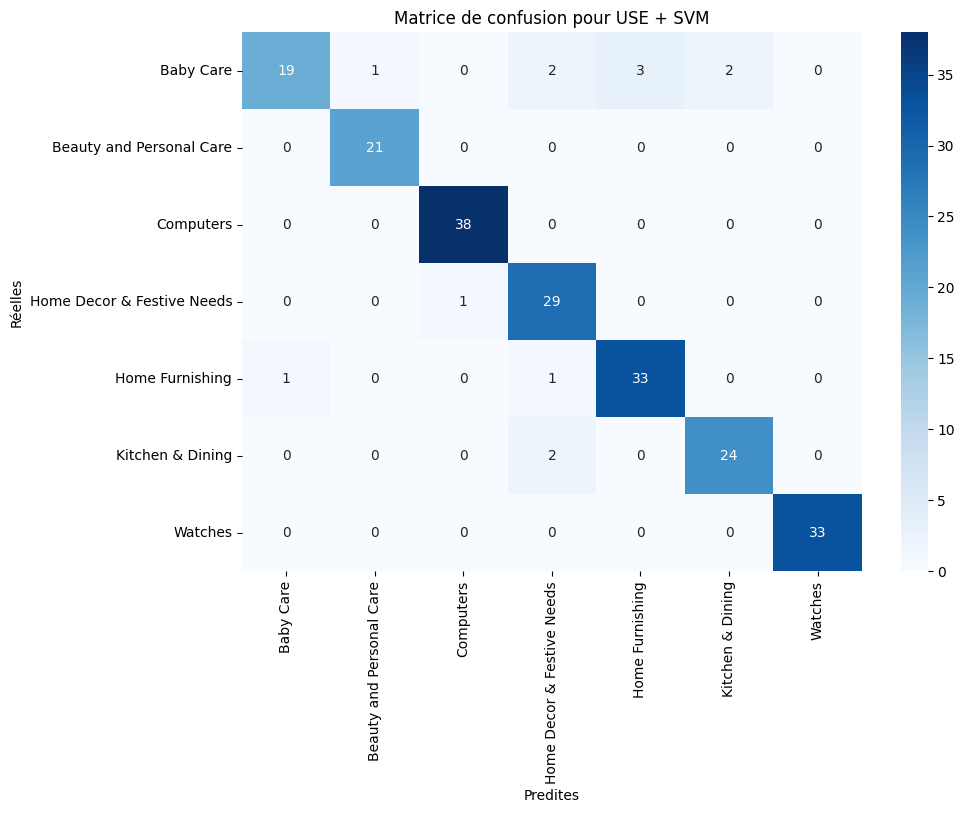

In [28]:
# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)

# Afficher la matrice de confusion
plt.figure(figsize=(10,7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=svm_model.classes_, yticklabels=model.classes_)
plt.xlabel('Predites')
plt.ylabel('Réelles')
plt.title('Matrice de confusion pour USE + SVM')
plt.show()


In [46]:
# Configurer la validation croisée en 10 plis
cv = StratifiedKFold(n_splits=10)

# Effectuer la validation croisée
cv_scores = cross_val_score(model, X_vectorized_normalized, y, cv=cv, scoring='accuracy')

# Calculer la moyenne globale
mean_accuracy = cv_scores.mean()

# Créer un tableau des résultats pour chaque pli avec trois chiffres après la virgule
cv_results_df = pd.DataFrame({'Fold': range(1, len(cv_scores) + 1), 'Accuracy': [f"{score:.3f}" for score in cv_scores]})

# Ajouter la moyenne globale en haut du tableau
mean_row = pd.DataFrame({'Fold': ['Mean'], 'Accuracy': [f"{mean_accuracy:.3f}"]})
cv_results_df_use = pd.concat([mean_row, cv_results_df], ignore_index=True)

# Afficher les résultats
cv_results_df_use


,Fold,Accuracy
0,Mean,0.893
1,1,0.848
2,2,0.952
3,3,0.981
4,4,0.971
5,5,1.000
6,6,0.848
7,7,0.752
8,8,0.876
9,9,0.876


#### c. Classification avec les features du tf-idf

In [47]:
# Importation des features / dataframe plus la target 'Level_1'
df_idf = pd.read_csv('tf_idf_df_pn.csv')
df_idf['Level_1'] = df_text['Level_1'].copy()

In [48]:
# Séparer les données en variables d'entrée (features) et la variable cible (target)
X = df_idf.drop('Level_1', axis=1)
y = df_idf['Level_1']

# Normaliser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Entraîner le modèle SVM
svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)

# Prédire sur l'ensemble de test
y_pred = svm_model.predict(X_test)

# Évaluer le modèle
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Afficher les résultats
print(f"Accuracy: {accuracy:.3f}")
print("Classification Report:")
print(report)


Accuracy: 0.914
Classification Report:
                            precision    recall  f1-score   support

                 Baby Care       0.77      0.89      0.83        27
  Beauty and Personal Care       0.90      0.90      0.90        21
                 Computers       0.92      0.95      0.94        38
Home Decor & Festive Needs       0.97      0.93      0.95        30
           Home Furnishing       0.97      0.83      0.89        35
          Kitchen & Dining       0.85      0.88      0.87        26
                   Watches       1.00      1.00      1.00        33

                  accuracy                           0.91       210
                 macro avg       0.91      0.91      0.91       210
              weighted avg       0.92      0.91      0.91       210



In [45]:
# Configurer la validation croisée en 10 plis
cv = StratifiedKFold(n_splits=10)

# Effectuer la validation croisée
cv_scores = cross_val_score(svm_model, X_scaled, y, cv=cv, scoring='accuracy')

# Calculer la moyenne globale
mean_accuracy = cv_scores.mean()

# Créer un tableau des résultats pour chaque pli avec trois chiffres après la virgule
cv_results_df = pd.DataFrame({'Fold': range(1, len(cv_scores) + 1), 'Accuracy': [f"{score:.3f}" for score in cv_scores]})

# Ajouter la moyenne globale en haut du tableau
mean_row = pd.DataFrame({'Fold': ['Mean'], 'Accuracy': [f"{mean_accuracy:.3f}"]})
cv_results_df_svm = pd.concat([mean_row, cv_results_df], ignore_index=True)

# Afficher les résultats
cv_results_df_svm


,Fold,Accuracy
0,Mean,0.834
1,1,0.838
2,2,0.914
3,3,0.981
4,4,0.943
5,5,0.990
6,6,0.819
7,7,0.648
8,8,0.781
9,9,0.771


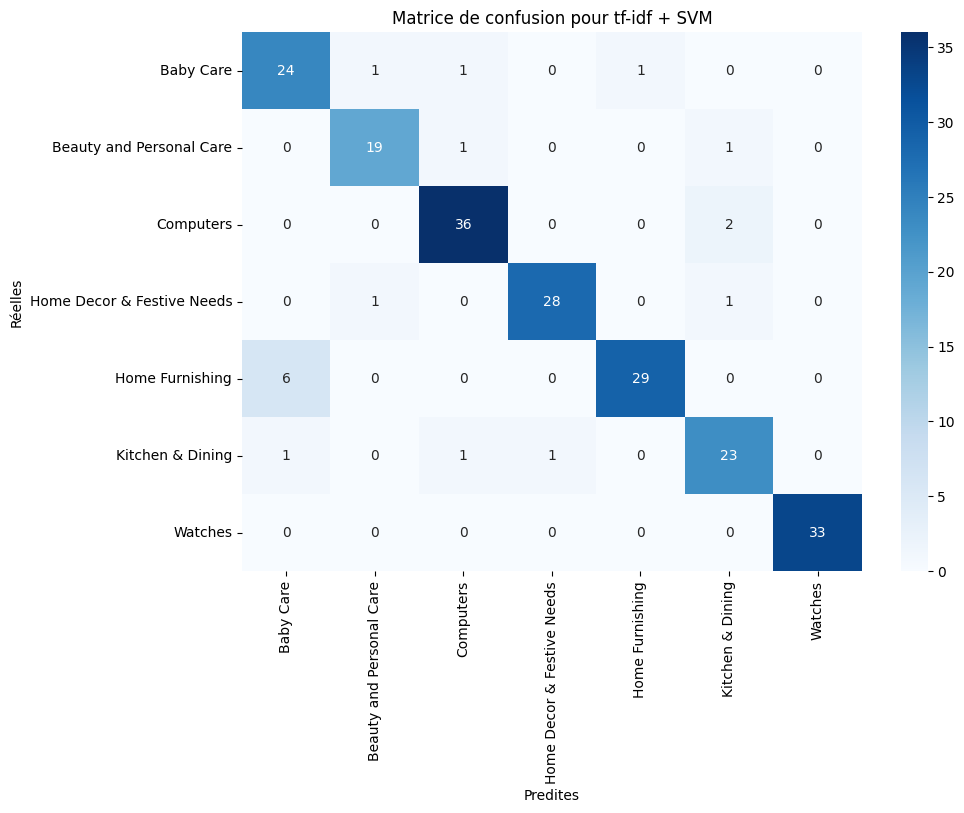

In [36]:
# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)

# Afficher la matrice de confusion
plt.figure(figsize=(10,7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=svm_model.classes_, yticklabels=svm_model.classes_)
plt.xlabel('Predites')
plt.ylabel('Réelles')
plt.title('Matrice de confusion pour tf-idf + SVM')
plt.show()


##### iV. Optimisation des hyperparamètres / analyse de l'overfitting

In [37]:
# Paramètres de la validation croisée
n_splits = 10
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Entraîner un modèle SVC pour chaque catégorie avec validation croisée
classifiers = []
cv_scores = []

for i in range(y_train_bin.shape[1]):
    print(f'Training and cross-validating classifier for category {mlb.classes_[i]}')
    pipeline_use = Pipeline([
        ('use', USEVectorizer()),
        ('svc', SVC(kernel='linear', probability=True))
    ])
    
    # Effectuer la validation croisée
    scores = cross_val_score(pipeline_use, X_train, y_train_bin[:, i], cv=kf, scoring='accuracy')
    
    print(f'Cross-validation scores for category {mlb.classes_[i]}: {scores}')
    print(f'Average cross-validation score for category {mlb.classes_[i]}: {np.mean(scores)}')
    
    # Entraîner sur l'ensemble des données d'entraînement
    pipeline_use.fit(X_train, y_train_bin[:, i])
    
    classifiers.append(pipeline_use)
    cv_scores.append(scores)

# tCalculer la moyenne des scores de validation croisée pour chaque catégorie
avg_cv_scores = [np.mean(scores) for scores in cv_scores]
print(f'Average cross-validation scores: {avg_cv_scores}')


Training and cross-validating classifier for category Baby Care
Cross-validation scores for category Baby Care: [0.94047619 0.95238095 0.96428571 0.94047619 0.95238095 0.91666667
 0.95238095 0.95238095 0.96428571 0.91666667]
Average cross-validation score for category Baby Care: 0.9452380952380951
Training and cross-validating classifier for category Beauty and Personal Care
Cross-validation scores for category Beauty and Personal Care: [0.98809524 0.96428571 1.         1.         0.95238095 0.96428571
 0.96428571 0.95238095 0.97619048 0.96428571]
Average cross-validation score for category Beauty and Personal Care: 0.9726190476190475
Training and cross-validating classifier for category Computers
Cross-validation scores for category Computers: [0.97619048 1.         1.         0.98809524 1.         0.97619048
 0.98809524 0.98809524 1.         0.98809524]
Average cross-validation score for category Computers: 0.9904761904761905
Training and cross-validating classifier for category Home

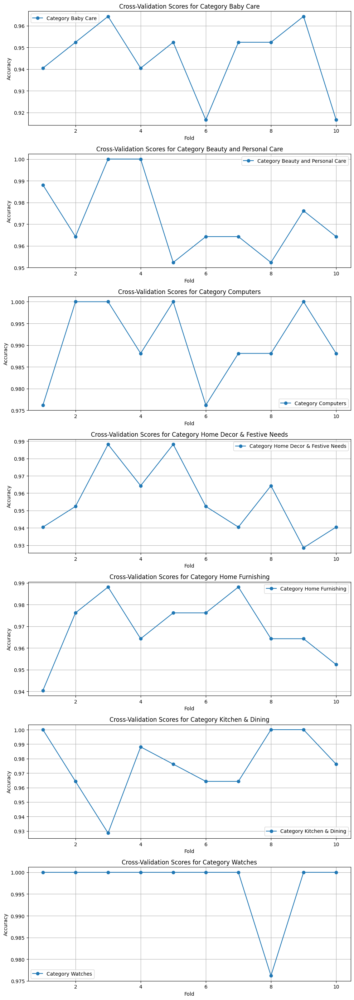

In [39]:
# Tracer les scores de validation croisée pour chaque catégorie
fig, axs = plt.subplots(y_train_bin.shape[1], 1, figsize=(10, 4 * y_train_bin.shape[1]))

for i, scores in enumerate(cv_scores):
    axs[i].plot(range(1, n_splits + 1), scores, marker='o', linestyle='-', label=f'Category {mlb.classes_[i]}')
    axs[i].set_title(f'Cross-Validation Scores for Category {mlb.classes_[i]}')
    axs[i].set_xlabel('Fold')
    axs[i].set_ylabel('Accuracy')
    axs[i].legend(loc='best')
    axs[i].grid(True)

plt.tight_layout()
plt.show()

A REVOIR -- FAIRE GRIDSEARCHCV POUR OBTENIR BEST MODEL

### 2. Modélisation supervisée avec le Random Forest Classifier

In [30]:
df_rfc = pd.read_csv('df_nlp.csv')

#### a. Sélection du meilleur outil NLP entre Word2Vec ; BERT & USE

In [31]:
# Encoder la colonne target
label_encoder = LabelEncoder()
df_rfc['Level_1'] = label_encoder.fit_transform(df_rfc['Level_1'])

# Séparer les features et le target
X = df_rfc['clean_corpus']
y = df_rfc['Level_1']

# Split des données
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [33]:
class Word2VecVectorizer(BaseEstimator, TransformerMixin):
    def __init__(self, vector_size=100, window=7, min_count=2, workers=4):
        self.vector_size = vector_size
        self.window = window
        self.min_count = min_count
        self.workers = workers

    def fit(self, X, y=None):
        sentences = [text.split() for text in X]
        self.model = Word2Vec(sentences, vector_size=self.vector_size, window=self.window, min_count=self.min_count, workers=self.workers)
        return self

    def transform(self, X):
        return np.array([np.mean([self.model.wv[word] for word in text.split() if word in self.model.wv] or [np.zeros(self.vector_size)], axis=0) for text in X])

# Pipeline Word2Vec avec RandomForestClassifier
pipeline_w2v_rf = Pipeline([
    ('w2v', Word2VecVectorizer()),
    ('random_forest', RandomForestClassifier())
])

pipeline_w2v_rf.fit(X_train, y_train)
y_pred_w2v_rf = pipeline_w2v_rf.predict(X_test)
accuracy_w2v_rf = accuracy_score(y_test, y_pred_w2v_rf)
print(f'Accuracy Word2Vec with RandomForest: {accuracy_w2v_rf}')


Accuracy Word2Vec with RandomForest: 0.819047619047619


In [34]:
class BERTVectorizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
        self.model = BertModel.from_pretrained('bert-base-uncased')

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        embeddings = []
        for text in X:
            inputs = self.tokenizer(text, return_tensors='pt', truncation=True, padding=True)
            outputs = self.model(**inputs)
            embeddings.append(outputs.last_hidden_state.mean(dim=1).detach().numpy().flatten())
        return np.array(embeddings)

# Pipeline BERT
pipeline_bert = Pipeline([
    ('bert', BERTVectorizer()),
    ('random_forest', RandomForestClassifier())
])

pipeline_bert.fit(X_train, y_train)
y_pred_bert = pipeline_bert.predict(X_test)
accuracy_bert = accuracy_score(y_test, y_pred_bert)
print(f'Accuracy BERT: {accuracy_bert}')


Accuracy BERT: 0.9047619047619048


In [35]:
class USEVectorizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return self.embed(X).numpy()

# Pipeline USE
pipeline_use = Pipeline([
    ('use', USEVectorizer()),
    ('random_forest', RandomForestClassifier())
])

pipeline_use.fit(X_train, y_train)
y_pred_use = pipeline_use.predict(X_test)
accuracy_use = accuracy_score(y_test, y_pred_use)
print(f'Accuracy USE: {accuracy_use}')


Accuracy USE: 0.8904761904761904


In [36]:
# Comparaison entre les trois modèles
accuracies = {
    'Word2Vec': accuracy_w2v,
    'BERT': accuracy_bert,
    'USE': accuracy_use
}

for method, acc in accuracies.items():
    print(f'{method} accuracy: {acc}')

best_method = max(accuracies, key=accuracies.get)
print(f'The best method is: {best_method} with an accuracy of {accuracies[best_method]}')


Word2Vec accuracy: 0.6523809523809524
BERT accuracy: 0.9047619047619048
USE accuracy: 0.8904761904761904
The best method is: BERT with an accuracy of 0.9047619047619048


Si, on prend le temps d'exécution en compte dans notre choix, je vais continuer avec le USE, beaucoup rapide que le BERT en tant qu'outil NLP.

#### b. Modélisation multi-classes avec USE + RFC

##### i. Préparation des données (encodage avec USE)

In [38]:
df_rfcUse = pd.read_csv('df_nlp.csv')

In [39]:
# Exclure les colonnes non-utiles
#df_svcUse = df_svcUse.drop(columns=['product_name', 'clean_description', 'clean_product_name'])

# Séparer les features et le target
X = df_rfcUse['clean_corpus']
y = df_rfcUse['Level_1']

# Transformation en variables binaires
mlb = MultiLabelBinarizer()
y_bin = mlb.fit_transform([[label] for label in y])

# Split des données
X_train, X_test, y_train_bin, y_test_bin = train_test_split(X, y_bin, test_size=0.2, random_state=42)

In [40]:
class USEVectorizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return self.embed(X).numpy()

##### ii. Modélisation avec le "RandomForestClassifier"

In [41]:
# Entraîner un modèle RandomForestClassifier pour chaque catégorie
classifiers = []
for i in range(y_train_bin.shape[1]):
    print(f'Training classifier for category {mlb.classes_[i]}')
    pipeline_use = Pipeline([
        ('use', USEVectorizer()),
        ('rf', RandomForestClassifier(n_estimators=100))
    ])
    pipeline_use.fit(X_train, y_train_bin[:, i])
    classifiers.append(pipeline_use)


Training classifier for category Baby Care
Training classifier for category Beauty and Personal Care
Training classifier for category Computers
Training classifier for category Home Decor & Festive Needs
Training classifier for category Home Furnishing
Training classifier for category Kitchen & Dining
Training classifier for category Watches


##### iii. Résultats de la modélisation

In [42]:
# Évaluation des modèles
y_pred_bin = np.zeros_like(y_test_bin)
for i, classifier in enumerate(classifiers):
    y_pred_bin[:, i] = classifier.predict(X_test)

# Affichage des résultats
for i in range(y_test_bin.shape[1]):
    print(f'Classification Report for category {mlb.classes_[i]}:')
    print(classification_report(y_test_bin[:, i], y_pred_bin[:, i]))

Classification Report for category Baby Care:
              precision    recall  f1-score   support

           0       0.93      1.00      0.97       183
           1       1.00      0.52      0.68        27

    accuracy                           0.94       210
   macro avg       0.97      0.76      0.82       210
weighted avg       0.94      0.94      0.93       210

Classification Report for category Beauty and Personal Care:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       189
           1       1.00      0.62      0.76        21

    accuracy                           0.96       210
   macro avg       0.98      0.81      0.87       210
weighted avg       0.96      0.96      0.96       210

Classification Report for category Computers:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       172
           1       0.97      0.89      0.93        38

    accuracy                 

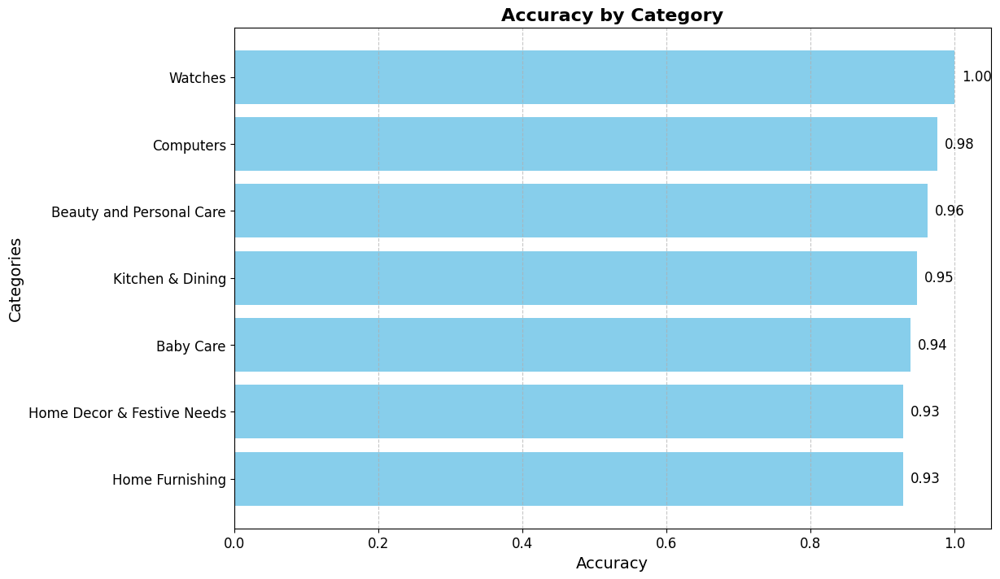

In [43]:
# Calculer l'accuracy pour chaque catégorie
accuracies = []
for i in range(y_test_bin.shape[1]):
    accuracy = accuracy_score(y_test_bin[:, i], y_pred_bin[:, i])
    accuracies.append((mlb.classes_[i], accuracy))

# Trier les accuracies du meilleur résultat au moins bon
accuracies.sort(key=lambda x: x[1], reverse=True)

# Extraire les noms des catégories et les accuracies
categories = [x[0] for x in accuracies]
accuracy_values = [x[1] for x in accuracies]

# Créer l'histogramme amélioré
plt.figure(figsize=(12, 8))
bars = plt.barh(categories, accuracy_values, color='skyblue')
plt.xlabel('Accuracy', fontsize=14)
plt.ylabel('Categories', fontsize=14)
plt.title('Accuracy by Category', fontsize=16, weight='bold')
plt.gca().invert_yaxis()

# Ajouter les étiquettes de valeur sur les barres
for bar in bars:
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
             f'{bar.get_width():.2f}', 
             va='center', ha='left', fontsize=12)

# Améliorer l'esthétique générale
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Afficher le graphique
plt.show()

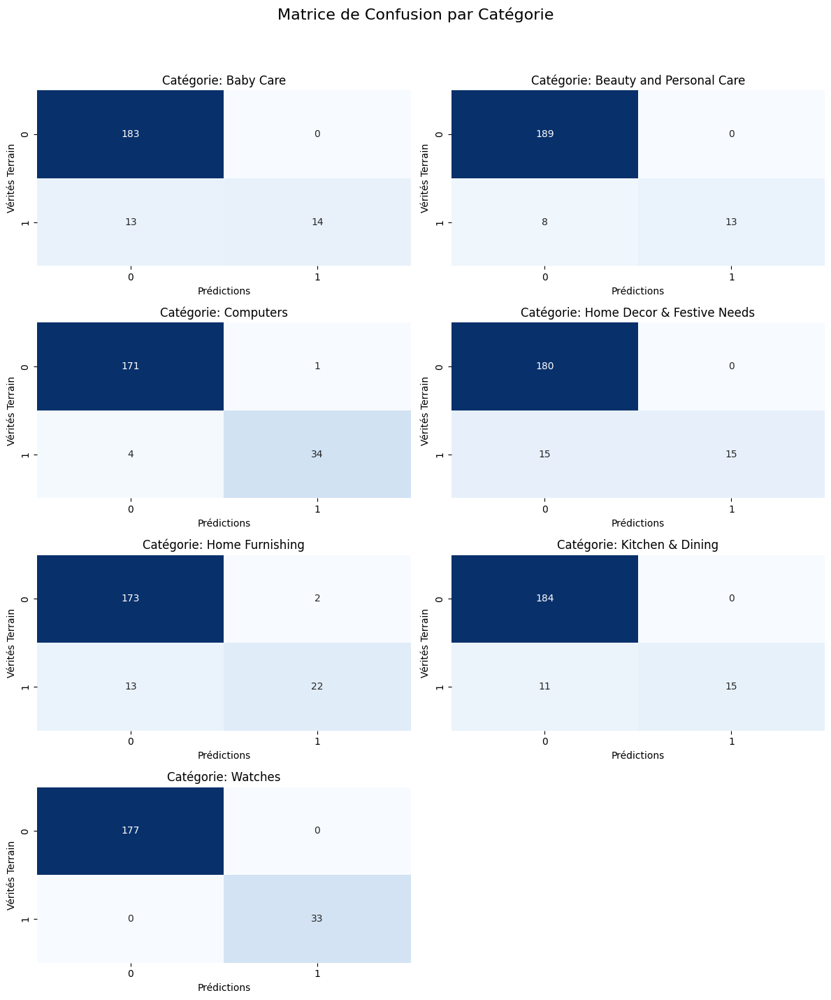

In [44]:
# Calculer la matrice de confusion pour chaque catégorie
confusion_matrices = multilabel_confusion_matrix(y_test_bin, y_pred_bin, labels=range(y_test_bin.shape[1]))

# Afficher les matrices de confusion
fig, axes = plt.subplots(nrows=len(confusion_matrices)//2 + len(confusion_matrices)%2, ncols=2, figsize=(12, 15))
fig.suptitle('Matrice de Confusion par Catégorie', fontsize=16)

# Si nombre de classes est impair, on ajoute une case vide
if len(confusion_matrices) % 2 != 0:
    axes[-1, -1].axis('off')

for i, (ax, cm) in enumerate(zip(axes.flatten(), confusion_matrices)):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, cbar=False)
    ax.set_xlabel('Prédictions')
    ax.set_ylabel('Vérités Terrain')
    ax.set_title(f'Catégorie: {mlb.classes_[i]}')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

##### iv. Analyse de l'overfitting / optimisation des hyperpramètres

In [45]:
# Paramètres de la validation croisée
n_splits = 10
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Entraîner un modèle SVC pour chaque catégorie avec validation croisée
classifiers = []
cv_scores = []

for i in range(y_train_bin.shape[1]):
    print(f'Training and cross-validating classifier for category {mlb.classes_[i]}')
    pipeline_use = Pipeline([
        ('use', USEVectorizer()),
        ('rf', RandomForestClassifier(n_estimators=100))
    ])
    
    # Effectuer la validation croisée
    scores = cross_val_score(pipeline_use, X_train, y_train_bin[:, i], cv=kf, scoring='accuracy')
    
    print(f'Cross-validation scores for category {mlb.classes_[i]}: {scores}')
    print(f'Average cross-validation score for category {mlb.classes_[i]}: {np.mean(scores)}')
    
    # Entraîner sur l'ensemble des données d'entraînement
    pipeline_use.fit(X_train, y_train_bin[:, i])
    
    classifiers.append(pipeline_use)
    cv_scores.append(scores)

# tCalculer la moyenne des scores de validation croisée pour chaque catégorie
avg_cv_scores = [np.mean(scores) for scores in cv_scores]
print(f'Average cross-validation scores: {avg_cv_scores}')


Training and cross-validating classifier for category Baby Care
Cross-validation scores for category Baby Care: [0.92857143 0.94047619 0.95238095 0.94047619 0.96428571 0.88095238
 0.94047619 0.94047619 0.97619048 0.9047619 ]
Average cross-validation score for category Baby Care: 0.9369047619047619
Training and cross-validating classifier for category Beauty and Personal Care
Cross-validation scores for category Beauty and Personal Care: [0.96428571 0.94047619 0.97619048 0.98809524 0.92857143 0.95238095
 0.92857143 0.94047619 0.91666667 0.95238095]
Average cross-validation score for category Beauty and Personal Care: 0.9488095238095238
Training and cross-validating classifier for category Computers
Cross-validation scores for category Computers: [0.97619048 1.         0.97619048 0.95238095 1.         0.95238095
 0.97619048 0.97619048 0.97619048 0.98809524]
Average cross-validation score for category Computers: 0.9773809523809522
Training and cross-validating classifier for category Home

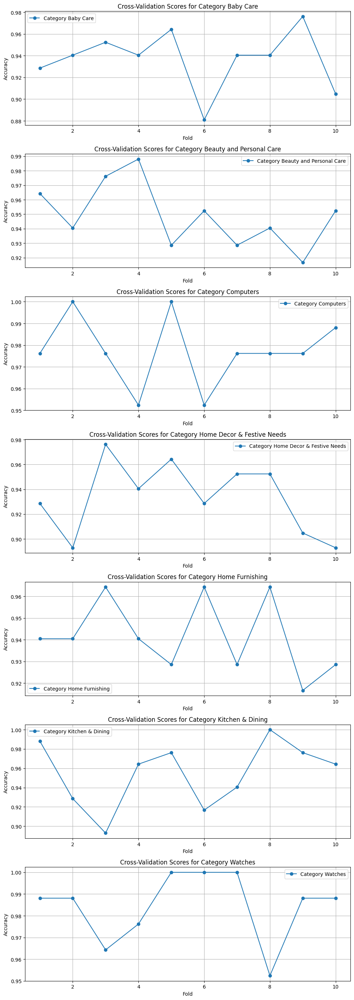

In [46]:
# Tracer les scores de validation croisée pour chaque catégorie
fig, axs = plt.subplots(y_train_bin.shape[1], 1, figsize=(10, 4 * y_train_bin.shape[1]))

for i, scores in enumerate(cv_scores):
    axs[i].plot(range(1, n_splits + 1), scores, marker='o', linestyle='-', label=f'Category {mlb.classes_[i]}')
    axs[i].set_title(f'Cross-Validation Scores for Category {mlb.classes_[i]}')
    axs[i].set_xlabel('Fold')
    axs[i].set_ylabel('Accuracy')
    axs[i].legend(loc='best')
    axs[i].grid(True)

plt.tight_layout()
plt.show()

#### c. Classification avec les features du tf-idf

In [33]:
# Importation des features / dataframe plus la target 'Level_1'
df_idf_rf = pd.read_csv('tf_idf_df_pn.csv')
df_idf_rf['Level_1'] = df_text['Level_1'].copy()

In [29]:
# Séparer les données en variables d'entrée (features) & la variable cible (target)
X = df_idf_rf.drop('Level_1', axis=1)
y = df_idf_rf['Level_1']

# Normaliser les données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Entraîner le modèle Random Forest
rf_model = RandomForestClassifier(n_estimators=300, random_state=42)
rf_model.fit(X_train, y_train)

# Prédire sur l'ensemble de test
y_pred = rf_model.predict(X_test)

# Évaluer le modèle
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Afficher les résultats
print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(report)


Accuracy: 0.919047619047619
Classification Report:
                            precision    recall  f1-score   support

                 Baby Care       1.00      0.63      0.77        27
  Beauty and Personal Care       0.90      0.86      0.88        21
                 Computers       0.84      1.00      0.92        38
Home Decor & Festive Needs       0.97      0.97      0.97        30
           Home Furnishing       0.92      0.97      0.94        35
          Kitchen & Dining       0.89      0.92      0.91        26
                   Watches       0.97      1.00      0.99        33

                  accuracy                           0.92       210
                 macro avg       0.93      0.91      0.91       210
              weighted avg       0.93      0.92      0.92       210



In [35]:
# Configurer la validation croisée en 10 plis
cv = StratifiedKFold(n_splits=10)

# Effectuer la validation croisée
cv_scores = cross_val_score(rf_model, X_scaled, y, cv=cv, scoring='accuracy')

# Calculer la moyenne globale
mean_accuracy = cv_scores.mean()

# Créer un tableau des résultats pour chaque pli
cv_results_df = pd.DataFrame({'Fold': range(1, len(cv_scores) + 1), 'Accuracy': cv_scores})

# Ajouter la moyenne globale en haut du tableau
mean_row = pd.DataFrame({'Fold': ['Mean'], 'Accuracy': [mean_accuracy]})
cv_results_df = pd.concat([mean_row, cv_results_df], ignore_index=True)

# Afficher les résultats
cv_results_df

,Fold,Accuracy
0,Mean,0.813333
1,1,0.828571
2,2,0.914286
3,3,0.990476
4,4,0.933333
5,5,0.971429
6,6,0.714286
7,7,0.704762
8,8,0.771429
9,9,0.790476


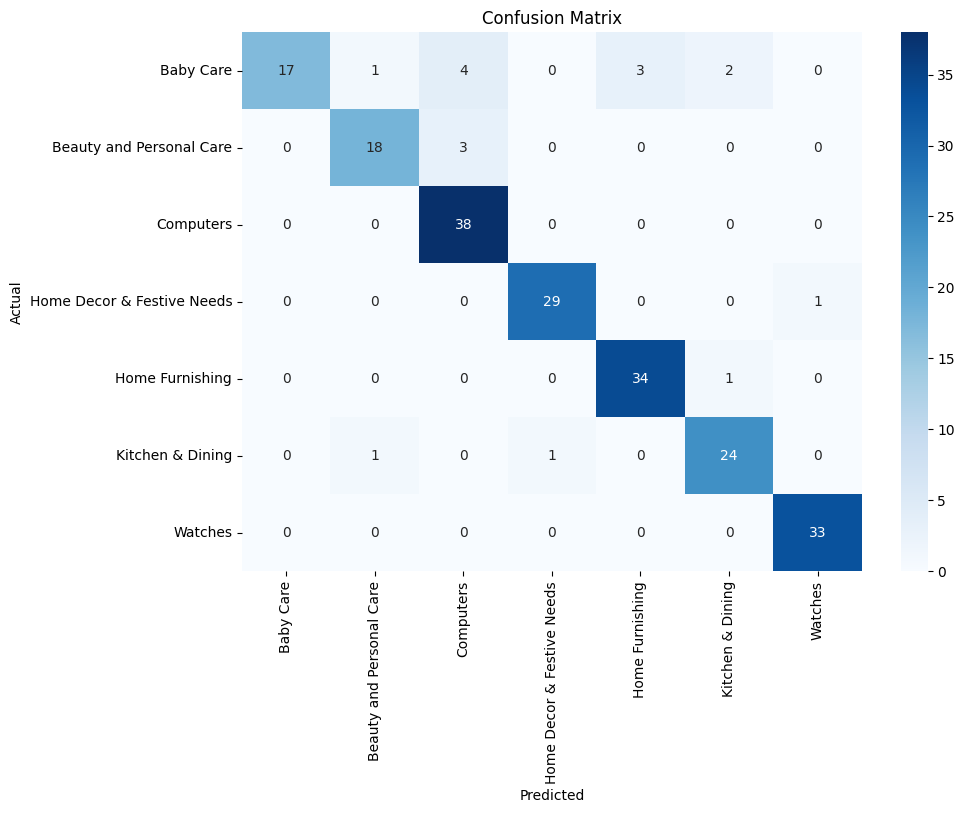

In [30]:
# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)

# Afficher la matrice de confusion
plt.figure(figsize=(10,7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=svm_model.classes_, yticklabels=svm_model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
